# CS 4330 Data Science - Term Project
## Progress Report 3
## Team Bit Blasters

Members:
Will Hennig (whennig@angelo.edu),
Ryan Dewey (rdewey@angelo.edu),
Sonpaorong Muchhim (smuchhim@angelo.edu)

## Set up access to the Barrios ISS dataset

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import graphviz

from sklearn.tree import export_graphviz
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score,mean_absolute_percentage_error
from scipy.signal import argrelmax, argrelmin, argrelextrema, find_peaks
from sklearn.linear_model import LinearRegression
from datetime import datetime
from google.colab import drive
drive.mount('/content/drive')

# change the following folder path to the one shared with you
dir = '/content/drive/MyDrive/Barrios-ASU - ISS Consumables Data Package/csv/'
mainDir = '/content/drive/MyDrive/Barrios-ASU - ISS Consumables Data Package/'
flist = os.listdir(dir)

# Sort file names
flist.sort()
flist

Mounted at /content/drive


['ims_consumables_category_lookup.csv',
 'inventory_mgmt_system_consumables_20220101-20230905.csv',
 'iss_flight_plan_20220101-20251231.csv',
 'iss_flight_plan_crew_20220101-20251321.csv',
 'iss_flight_plan_crew_nationality_lookup.csv',
 'rates_definition.csv',
 'rsa_consumable_water_summary_20220103-20230828.csv',
 'stored_items_only_inventory_mgmt_system_consumables_20220101-20230905.csv',
 'tank_capacity_definition.csv',
 'thresholds_limits_definition.csv',
 'us_rs_weekly_consumable_gas_summary_20220102-20230903.csv',
 'us_weekly_consumable_water_summary_20220102-20230903.csv',
 'vehicle_capcity_def.csv']

## Reading Stoables only CSV file to Dataframe

In [ ]:
# dir + flist[7]
# 'stored_items_only_inventory_mgmt_system_consumables_20220101-20230905.csv'

stowables = pd.read_csv(dir + flist[7])
stowables

# dfBigBoy = pd.read_csv(dir + flist[1], names=dataDictHeaders) # 'inventory_mgmt_system_consumables_20220101-20230905.csv'
# dfBigBoy

,datedim,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,...,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
0,1/1/2022 10:01,364155,265,/0/101/265/364155/,3,Storage Location,11Ф615.8720А55-20,1180,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
1,1/1/2022 10:01,364156,265,/0/101/265/364156/,3,Storage Location,11Ф615.8720А55-20,1181,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
2,1/1/2022 10:01,364157,265,/0/101/265/364157/,3,Storage Location,11Ф615.8720А55-20,1182,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
3,1/1/2022 10:01,364158,265,/0/101/265/364158/,3,Storage Location,11Ф615.8720А55-10,1182,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
4,1/1/2022 10:01,364160,265,/0/101/265/364160/,3,Storage Location,11Ф615.8720А55-20,1184,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533982,9/5/2023 15:20,496349,422154,/0/87242/87249/87279/422154/496349/,5,Storage Location,10182.5514.000,2203414,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts
533983,9/5/2023 15:20,496351,422154,/0/87242/87249/87279/422154/496351/,5,Storage Location,10182.5514.000,2102396,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts
533984,9/5/2023 15:20,496353,422154,/0/87242/87249/87279/422154/496353/,5,Storage Location,10182.5514.000,2102399,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts
533985,9/5/2023 15:20,496357,422154,/0/87242/87249/87279/422154/496357/,5,Storage Location,10182.5514.000,2102394,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts


In [ ]:
result1 = stowables['datedim'].str.split(' ', expand=True) #Trying to split the data in 'datedim' to 'date' and 'time' to group the quantity list into timeline graph by date
result1.columns = ['date', 'time']

In [ ]:
position_to_insert1 = stowables.columns.get_loc('datedim')
stowables.insert(position_to_insert1 + 1, 'date', result1['date'])
stowables.insert(position_to_insert1 + 2, 'time', result1['time'])

stowables.drop('datedim', axis=1)

,date,time,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,...,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
0,1/1/2022,10:01,364155,265,/0/101/265/364155/,3,Storage Location,11Ф615.8720А55-20,1180,ФГБ1ГА,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
1,1/1/2022,10:01,364156,265,/0/101/265/364156/,3,Storage Location,11Ф615.8720А55-20,1181,ФГБ1ГА,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
2,1/1/2022,10:01,364157,265,/0/101/265/364157/,3,Storage Location,11Ф615.8720А55-20,1182,ФГБ1ГА,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
3,1/1/2022,10:01,364158,265,/0/101/265/364158/,3,Storage Location,11Ф615.8720А55-10,1182,ФГБ1ГА,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
4,1/1/2022,10:01,364160,265,/0/101/265/364160/,3,Storage Location,11Ф615.8720А55-20,1184,ФГБ1ГА,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,10/10/2020 19:22,10/10/2020 19:22,NaN,3,KTO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533982,9/5/2023,15:20,496349,422154,/0/87242/87249/87279/422154/496349/,5,Storage Location,10182.5514.000,2203414,NOD3A2,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts
533983,9/5/2023,15:20,496351,422154,/0/87242/87249/87279/422154/496351/,5,Storage Location,10182.5514.000,2102396,NOD3A2,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts
533984,9/5/2023,15:20,496353,422154,/0/87242/87249/87279/422154/496353/,5,Storage Location,10182.5514.000,2102399,NOD3A2,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts
533985,9/5/2023,15:20,496357,422154,/0/87242/87249/87279/422154/496357/,5,Storage Location,10182.5514.000,2102394,NOD3A2,...,Stowed,1,1,ECLSS,WHC,8/8/2023 16:42,8/8/2023 16:42,NaN,5,Filter Inserts


In [ ]:
stowables['date'] = pd.to_datetime(stowables['date'], format='%m/%d/%Y')
stowables['date'] = stowables['date'].dt.strftime('%Y/%m/%d')

In [ ]:
pd.set_option('display.max_columns', None)
stowables.sample(n=10).sort_values(by='date')

,datedim,date,time,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,current_ip_owner,operational_nomenclature,russian_name,english_name,barcode,quantity,width,height,length,diameter,calculated_volume,stwg_ovrrd_vol,children_volume,stwg_ovrrd_chldrn_vol,ovrrd_notes,volume_notes,expire_date,launch,type,hazard,state,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
14541,1/24/2022 10:01,2022/01/24,10:01,336181,57256,/0/101/276/278/312/781/59827/57256/336181/,8,Storage Location,А8-9060-400,1181032,ФГБ1ПГО_2_217_1,Russian Space Agency,RSA00,Вкладыши АСУ,Вкладыши АСУ,Sanitary inserts,00075983R,1,230.0,95.00,230.00,NaN,0.09508,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,11/23/2023 0:00,Progress МS-11 (72P),Item,Non-hazardous,Functional,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,7/4/2019 22:39,7/4/2019 22:39,NaN,4,ACY Inserts
39938,2/26/2022 10:01,2022/02/26,10:01,408790,109748,/0/215428/215464/133770/109748/408790/,5,Storage Location,SEG48102042-901,Z0706,PMM1_Endcone_Trash Area_CT,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXZ0706J,1,304.8,123.83,377.83,NaN,0.26980,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG15,Item,NaN,Functional,Discard,1,1,Food Supply,NaN,12/25/2021 18:24,12/25/2021 18:24,NaN,6,Food
55602,3/12/2022 10:01,2022/03/12,10:01,447308,447256,/0/446988/447022/447036/447037/447256/447308/,6,Storage Location,SEG48102042-901,S154,CYG17P4_12,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F67CS154J,1,304.8,123.83,377.83,NaN,0.26980,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,2/22/2022 19:38,2/18/2022 21:35,NaN,6,Food
73167,3/28/2022 9:01,2022/03/28,9:01,440532,356199,/0/87242/87247/87272/356199/440532/,5,Storage Location,А8-9060-400,1070981,NOD3O2,NASA,NASA,ACY Inserts Kit,Вкладыши АСУ (уп.),TOILET (АСУ) INSERTS,NaN,1,230.0,95.00,230.00,NaN,0.09508,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,ECLSS,WHC,1/10/2022 22:13,12/22/2021 19:10,NaN,4,ACY Inserts
123159,5/20/2022 9:01,2022/05/20,9:01,423860,424323,/0/87242/87249/87279/424323/423860/,5,Storage Location,А8-9060-400,970951,NOD3A2,NASA,NASA,ACY Inserts Kit,Вкладыши АСУ (уп.),TOILET (АСУ) INSERTS,NaN,1,230.0,95.00,230.00,NaN,0.09508,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,ECLSS,WHC,3/17/2022 18:50,12/3/2021 14:41,NaN,4,ACY Inserts
213250,9/17/2022 9:01,2022/09/17,9:01,447716,441330,/0/103/283/563/441330/447716/,5,Storage Location,SEG48102042-901,S196,NOD1O2,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F67CS196J,1,304.8,123.83,377.83,NaN,0.26980,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG17,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,7/7/2022 18:24,7/5/2022 10:40,NaN,6,Food
275323,11/29/2022 10:02,2022/11/29,10:02,422879,449060,/0/215428/215464/133770/421596/449060/422879/,6,Storage Location,11Ф615.8720А55-10,1230,PMM1_Endcone_Trash Area,NASA,NASA,Solid Waste Container - Lid,Крышка контейнера твердых отходов,SOLID WASTE CONTAINER BOTTOM,00265595J,1,NaN,80.00,NaN,330.0,0.12946,NaN,NaN,NaN,NaN,Cylinder; Assume volume = H*pi(D/2)^2,NaN,CYG16,Item,NaN,Functional,Installed,1,1,ECLSS,WHC,11/1/2022 18:57,11/1/2022 18:57,NaN,3,KTO
339355,1/21/2023 10:02,2023/01/21,10:02,422097,109748,/0/215428/215464/133770/109748/422097/,5,Storage Location,SEG48102042-901,D2372,PMM1_Endcone_Trash Area_CT,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXD2372J,1,304.8,123.83,377.83,NaN,0.26980,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG16,Item,NaN,Functional,Discard,1,1,Food Supply,NaN,7/23/2022 19:09,7/23/2022 19:09,EMPTY,6,Food-US
343233,1/24/2023 10:01,2023/01/24,10:01,465992,109748,/0/21542

In [ ]:
stowables['status']

0            Stowed
1            Stowed
2            Stowed
3            Stowed
4            Stowed
            ...    
533982       Stowed
533983       Stowed
533984       Stowed
533985       Stowed
533986    Installed
Name: status, Length: 533987, dtype: object

In [ ]:
stowables.groupby('date').count()

,datedim,time,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,current_ip_owner,operational_nomenclature,russian_name,english_name,barcode,quantity,width,height,length,diameter,calculated_volume,stwg_ovrrd_vol,children_volume,stwg_ovrrd_chldrn_vol,ovrrd_notes,volume_notes,expire_date,launch,type,hazard,state,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022/01/01,326,326,326,326,326,326,326,326,326,326,326,326,326,326,326,276,326,154,278,201,182,325,0,24,0,0,326,141,164,313,94,326,326,326,326,326,326,326,326,2,326,326
2022/01/02,326,326,326,326,326,326,326,326,326,326,326,326,326,326,326,276,326,154,278,201,182,325,0,24,0,0,326,141,164,313,94,326,326,326,326,326,326,326,326,2,326,326
2022/01/03,326,326,326,326,326,326,326,326,326,326,326,326,326,326,326,276,326,154,278,201,182,325,0,24,0,0,326,141,164,313,94,326,326,326,326,326,326,326,326,2,326,326
2022/01/05,326,326,326,326,326,326,326,326,326,326,326,326,326,326,326,276,326,154,278,201,182,325,0,25,0,0,326,141,164,313,94,326,326,326,326,326,326,326,326,2,326,326
2022/01/06,725,725,725,725,725,725,725,725,725,725,725,725,725,720,725,675,725,553,677,600,190,724,0,25,0,0,725,141,268,705,94,725,725,725,725,720,328,725,725,32,725,725
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023/09/01,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1197,1252,959,1233,978,264,1221,0,43,0,0,1252,298,1252,1249,196,1234,1252,1252,1252,1244,455,1252,1252,54,1252,1252
2023/09/02,1257,1257,1257,1257,1257,1257,1257,1257,1257,1257,1257,1257,1257,1257,1257,1202,1257,964,1238,983,264,1226,0,45,0,0,1257,302,1257,1254,198,1239,1257,1257,1257,1249,455,1257,1257,57,1257,1257
2023/09/03,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252,1197,1252,959,1233,978,264,1221,0,44,0,0,1252,298,1252,1249,196,1234,1252,1252,1252,1244,455,1252,1252,57,1252,1252


In [ ]:
stowables.groupby('status').count()

,datedim,date,time,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,current_ip_owner,operational_nomenclature,russian_name,english_name,barcode,quantity,width,height,length,diameter,calculated_volume,stwg_ovrrd_vol,children_volume,stwg_ovrrd_chldrn_vol,ovrrd_notes,volume_notes,expire_date,launch,type,hazard,state,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
status,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Discard,142555,142555,142555,142555,142555,142555,142555,142555,142555,142555,142555,142555,142555,142555,141744,142555,136999,142555,126996,140470,128931,17134,141893,0,11063,0,0,142555,21607,105224,141088,17627,138232,142555,142555,140725,27534,142555,142555,26721,142555,142555
Installed,37743,37743,37743,37743,37743,37743,37743,37743,37743,37743,37743,37743,37743,37743,37686,37743,37743,37743,23686,35638,25774,14653,37300,0,3414,0,0,37743,10744,26158,37552,8779,34778,37743,37743,37217,17071,37743,37743,386,37743,37743
Stowed,353591,353591,353591,353591,353591,353591,353591,353591,353591,353591,353591,353591,353591,353591,353149,353591,330556,353591,254615,336977,271229,96485,349053,0,6593,0,0,353591,89845,236496,349320,63998,344945,353591,353591,350966,170345,353591,353591,616,353591,353591


In [ ]:
stowables['status'][:100]

0     Stowed
1     Stowed
2     Stowed
3     Stowed
4     Stowed
       ...  
95    Stowed
96    Stowed
97    Stowed
98    Stowed
99    Stowed
Name: status, Length: 100, dtype: object

In [ ]:
stowableCount = stowables[stowables['status'] == "Stowed"].groupby('date').count()['status']

for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = stowableCount.index.get_loc(targetDate)
    correctedValue = (stowableCount[targetIdx+1] + stowableCount[targetIdx-1]) // 2
    stowableCount[targetIdx] = correctedValue

In [ ]:
stowableCount

date
2022/01/01    281
2022/01/02    281
2022/01/03    281
2022/01/05    277
2022/01/06    571
             ... 
2023/09/01    916
2023/09/02    910
2023/09/03    907
2023/09/04    907
2023/09/05    901
Name: status, Length: 544, dtype: int64

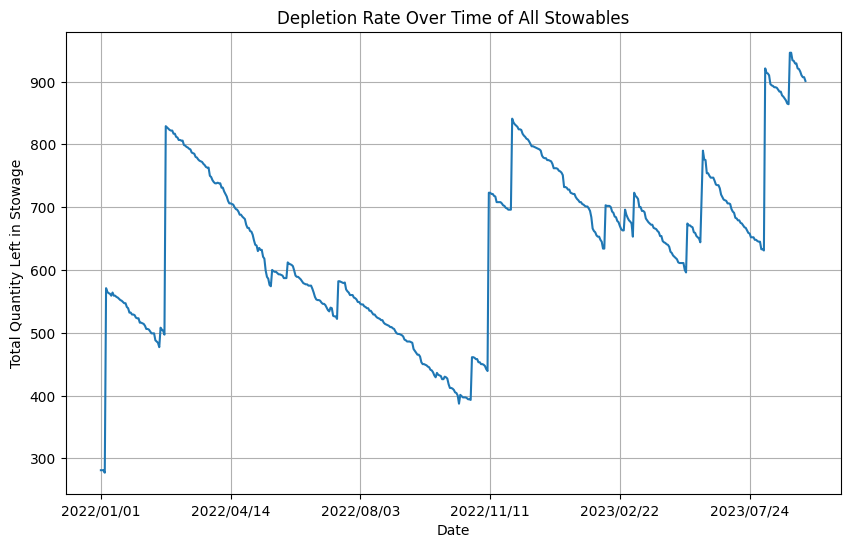

In [ ]:
stowableCount.plot(kind='line', figsize=(10, 6))
plt.title('Depletion Rate Over Time of All Stowables')
plt.xlabel('Date')
plt.ylabel('Total Quantity Left in Stowage')
plt.grid(True)
plt.show()

This here is calculated from the stowables subset of the inventory database. It is calculated from finding the number of items cataloged as "Stowed" for every day. Discrepancies found after 2023/02/22 and 2023/07/24. Will need to manually look at these entries to make sure they are addressed!

In [ ]:
stowableCount.nlargest(2)

date
2023/08/24    946
2023/08/25    946
Name: status, dtype: int64

In [ ]:
stowables.loc[stowables['category_name'] == 'Food', 'category_name'] = 'Food-US' # replace the name of 'Food' to 'Food-US'

In [ ]:
stowables[stowables['categoryID'] == 6].iloc[0]['category_name']

'Food-US'

The code below is the count of the stowables per day, separated by category. Note the abnormal spikes on dates 2023/05/01 and 2023/06/09.

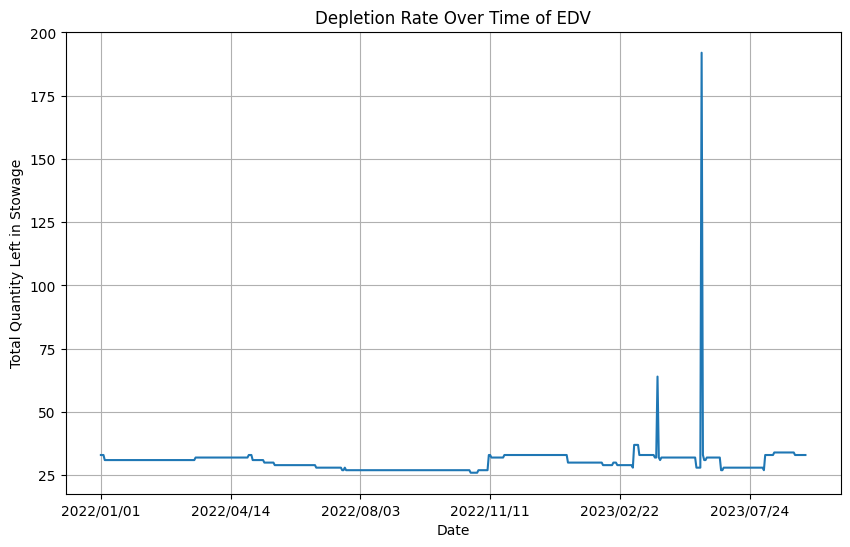

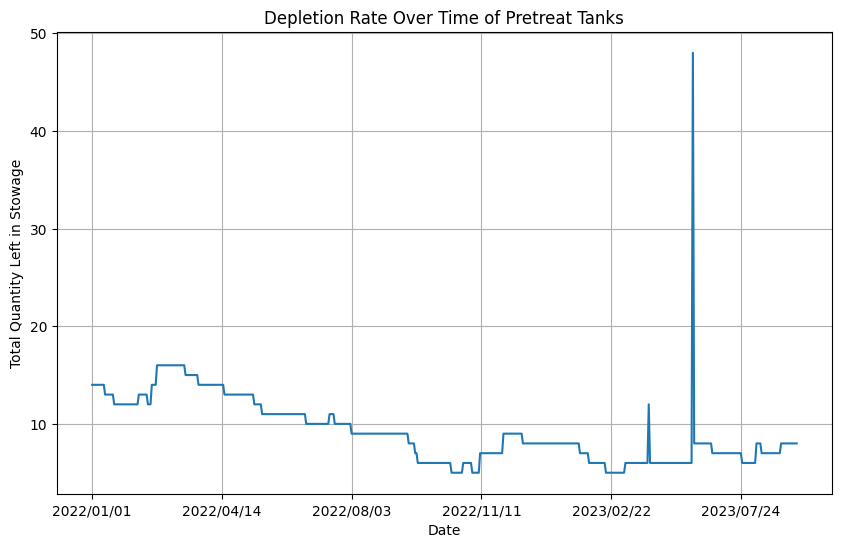

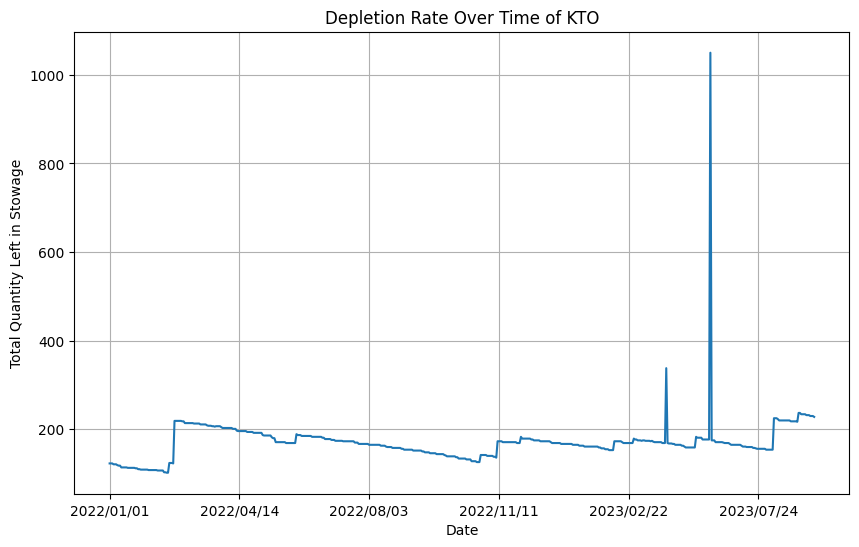

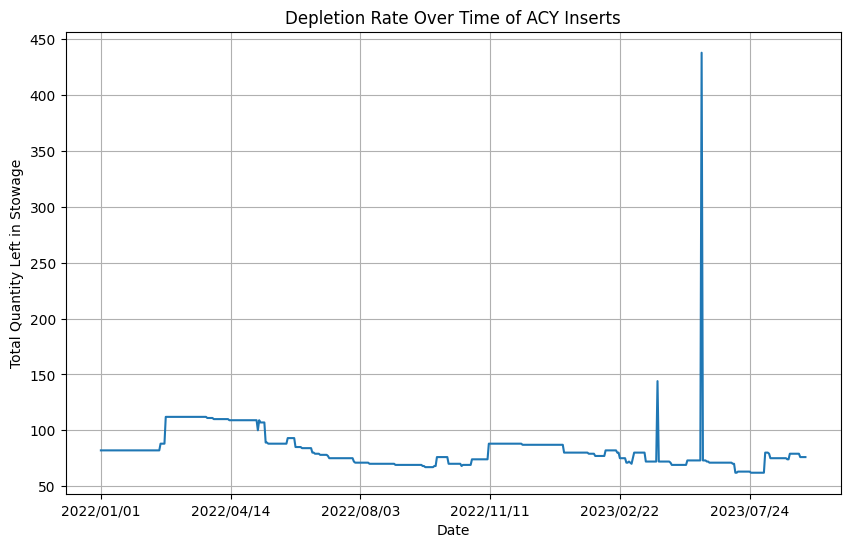

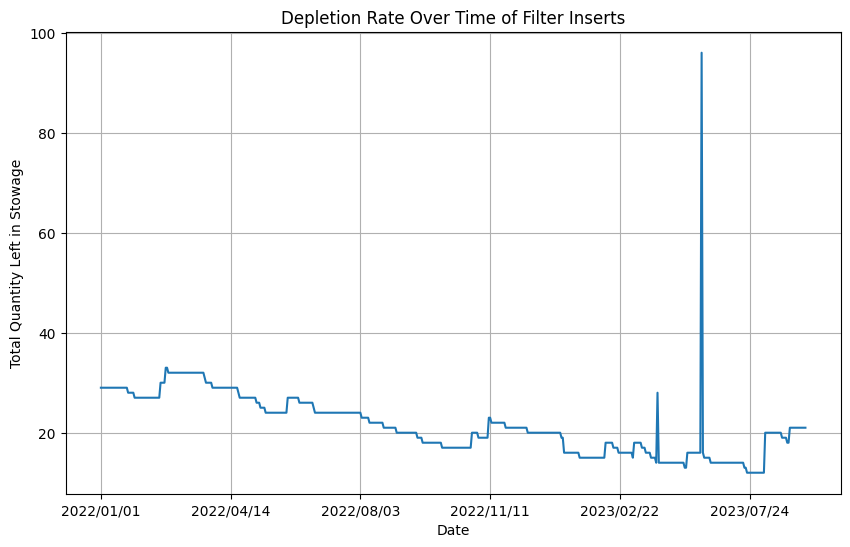

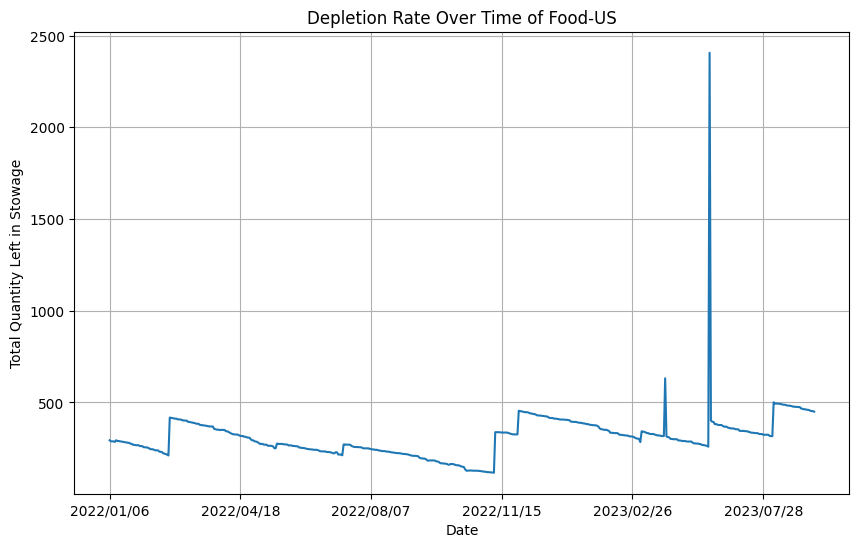

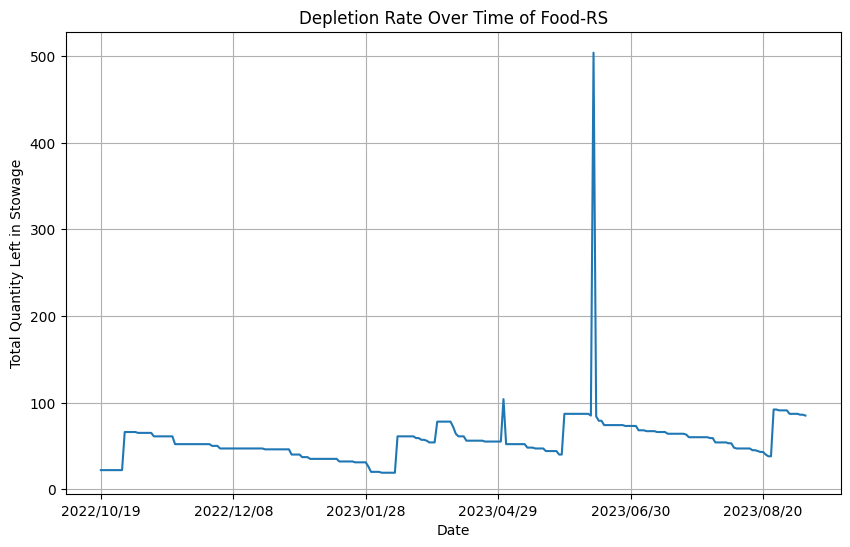

In [ ]:
for catIdx in range(1,8):
  categoryCount = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)].groupby('date').count()['status']
  categoryCount.plot(kind='line', figsize=(10, 6))
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']
  plt.title('Depletion Rate Over Time of ' + categoryName)
  plt.xlabel('Date')
  plt.ylabel('Total Quantity Left in Stowage')
  plt.grid(True)
  plt.show()
  print()

Here the loop displays the neighbors of the anomalous spikes found at the dates
2023/05/01 and 2023/06/09

In [ ]:
for catIdx in range(1,8):
  categoryCount = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)].groupby('date').count()['status']
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']
  print('Here nearby values for the anomalous spikes in ' + categoryName)
  print(categoryCount.loc['2023/04/27':'2023/05/05'])
  print()
  print(categoryCount.loc['2023/06/01':'2023/06/16'])
  print('---------------------------------------------------------------')


Here nearby values for the anomalous spikes in EDV
date
2023/04/27    33
2023/04/28    33
2023/04/29    32
2023/04/30    32
2023/05/01    64
2023/05/02    32
2023/05/03    31
2023/05/04    32
2023/05/05    32
Name: status, dtype: int64

date
2023/06/01     28
2023/06/02     28
2023/06/03     28
2023/06/05     28
2023/06/09    192
2023/06/10     33
2023/06/13     31
2023/06/14     31
Name: status, dtype: int64
---------------------------------------------------------------
Here nearby values for the anomalous spikes in Pretreat Tanks
date
2023/04/27     6
2023/04/28     6
2023/04/29     6
2023/04/30     6
2023/05/01    12
2023/05/02     6
2023/05/03     6
2023/05/04     6
2023/05/05     6
Name: status, dtype: int64

date
2023/06/01     6
2023/06/02     6
2023/06/03     6
2023/06/05     6
2023/06/09    48
2023/06/10     8
2023/06/13     8
2023/06/14     8
Name: status, dtype: int64
---------------------------------------------------------------
Here nearby values for the anomalous spikes

Manual corrections to the consumption for all categories. Note the spikes are now gone.

Here are corrections for the anomalous spikes in EDV
date
2023/04/27    33
2023/04/28    33
2023/04/29    32
2023/04/30    32
2023/05/01    32
2023/05/02    32
2023/05/03    31
2023/05/04    32
2023/05/05    32
Name: status, dtype: int64

date
2023/06/01    28
2023/06/02    28
2023/06/03    28
2023/06/05    28
2023/06/09    30
2023/06/10    33
2023/06/13    31
2023/06/14    31
Name: status, dtype: int64

---------------------------------------------------------------

Here are corrections for the anomalous spikes in Pretreat Tanks
date
2023/04/27    6
2023/04/28    6
2023/04/29    6
2023/04/30    6
2023/05/01    6
2023/05/02    6
2023/05/03    6
2023/05/04    6
2023/05/05    6
Name: status, dtype: int64

date
2023/06/01    6
2023/06/02    6
2023/06/03    6
2023/06/05    6
2023/06/09    7
2023/06/10    8
2023/06/13    8
2023/06/14    8
Name: status, dtype: int64

---------------------------------------------------------------

Here are corrections for the anomalous spikes in KTO
date
20

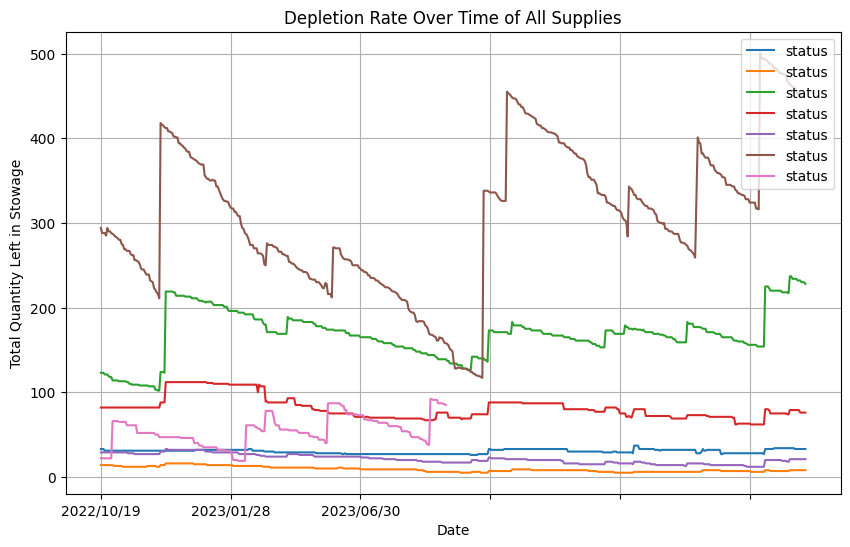

In [ ]:
for catIdx in range(1,8):
  categoryCount = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)].groupby('date').count()['status']
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

  for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = categoryCount.index.get_loc(targetDate)
    correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
    categoryCount[targetIdx] = correctedValue

  print('Here are corrections for the anomalous spikes in ' + categoryName)
  print(categoryCount.loc['2023/04/27':'2023/05/05'])
  print()
  print(categoryCount.loc['2023/06/01':'2023/06/16'])
  print()
  print('---------------------------------------------------------------')
  print()

  categoryCount.plot(kind='line', figsize=(10, 6), legend = categoryName)

plt.title('Depletion Rate Over Time of All Supplies')
plt.xlabel('Date')
plt.ylabel('Total Quantity Left in Stowage')
plt.grid(True)
plt.legend(loc='upper right')
plt.show()

In [ ]:
'''
for catIdx in range(1,8):
  categoryCount = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)].groupby('date').count()['status']
  diffCategoryCount = categoryCount.diff()

  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

  for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = diffCategoryCount.index.get_loc(targetDate)
    correctedValue = (diffCategoryCount[targetIdx+1] + diffCategoryCount[targetIdx-1]) // 2
    diffCategoryCount[targetIdx] = correctedValue

  print('Here are corrections for the anomalous spikes in ' + categoryName)
  print(diffCategoryCount.loc['2023/04/27':'2023/05/05'])
  print()
  print(diffCategoryCount.loc['2023/06/01':'2023/06/16'])
  print()
  print('---------------------------------------------------------------')
  print()

  diffCategoryCount.plot(kind='line', figsize=(10, 6))
  plt.title('Depletion Rate Over Time of ' + categoryName)
  plt.xlabel('Date')
  plt.ylabel('Total Quantity Left in Stowage')
  plt.grid(True)
  plt.show()
'''

'\nfor catIdx in range(1,8):\n  categoryCount = stowables[(stowables[\'status\'] == "Stowed") & (stowables[\'categoryID\'] == catIdx)].groupby(\'date\').count()[\'status\']\n  diffCategoryCount = categoryCount.diff()\n\n  categoryName = stowables[stowables[\'categoryID\'] == catIdx].iloc[0][\'category_name\']\n\n  for targetDate in [\'2023/05/01\',\'2023/06/09\']:\n    targetIdx = diffCategoryCount.index.get_loc(targetDate)\n    correctedValue = (diffCategoryCount[targetIdx+1] + diffCategoryCount[targetIdx-1]) // 2\n    diffCategoryCount[targetIdx] = correctedValue\n\n  print(\'Here are corrections for the anomalous spikes in \' + categoryName)\n  print(diffCategoryCount.loc[\'2023/04/27\':\'2023/05/05\'])\n  print()\n  print(diffCategoryCount.loc[\'2023/06/01\':\'2023/06/16\'])\n  print()\n  print(\'---------------------------------------------------------------\')\n  print()\n\n  diffCategoryCount.plot(kind=\'line\', figsize=(10, 6))\n  plt.title(\'Depletion Rate Over Time of \' + ca

Here are corrections for the anomalous spikes in Food-US
date
2023/04/27    320
2023/04/28    317
2023/04/29    317
2023/04/30    317
2023/05/01    316
2023/05/02    315
2023/05/03    311
2023/05/04    310
2023/05/05    302
Name: status, dtype: int64

date
2023/06/01    267
2023/06/02    265
2023/06/03    263
2023/06/05    259
2023/06/09    330
2023/06/10    401
2023/06/13    395
2023/06/14    394
Name: status, dtype: int64

---------------------------------------------------------------

printing categoryCount:
date
2022/01/06    294
2022/01/07    288
2022/01/08    288
2022/01/09    288
2022/01/10    285
             ... 
2023/09/01    459
2023/09/02    455
2023/09/03    453
2023/09/04    453
2023/09/05    450
Name: status, Length: 540, dtype: int64


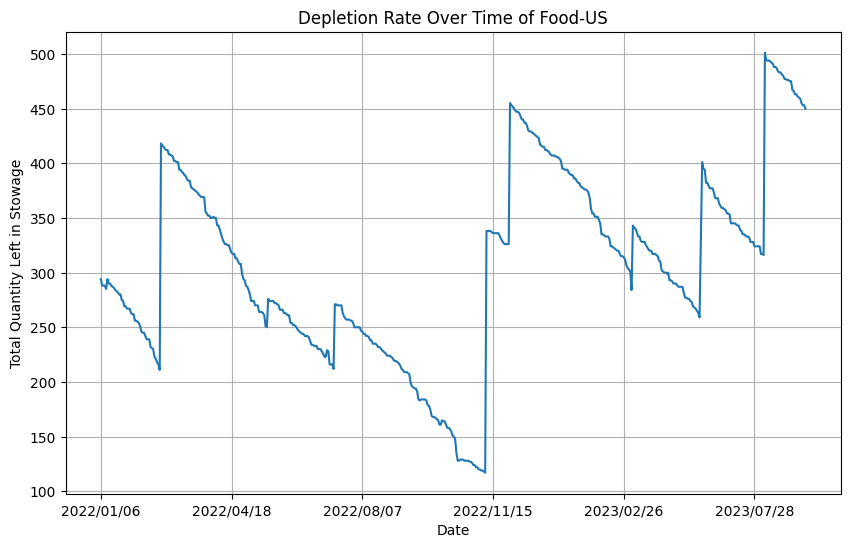

In [ ]:
catIdx = 6
categoryCount = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)].groupby('date').count()['status']
categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

for targetDate in ['2023/05/01','2023/06/09']:
  targetIdx = categoryCount.index.get_loc(targetDate)
  correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
  categoryCount[targetIdx] = correctedValue

print('Here are corrections for the anomalous spikes in ' + categoryName)
print(categoryCount.loc['2023/04/27':'2023/05/05'])
print()
print(categoryCount.loc['2023/06/01':'2023/06/16'])
print()
print('---------------------------------------------------------------')
print()

print ('printing categoryCount:')
print(categoryCount)

categoryCount.plot(kind='line', figsize=(10, 6))
plt.title('Depletion Rate Over Time of ' + categoryName)
plt.xlabel('Date')
plt.ylabel('Total Quantity Left in Stowage')
plt.grid(True)
plt.show()

Attempted to find how to extend series with missing data for the given dateRangeIdx.

In [ ]:
categoryCount.index = pd.to_datetime(categoryCount.index)

print(categoryCount.index)
dateRangeIdx = pd.date_range('2022/01/06', '2023/09/05')
categoryCountExtended = categoryCount.reindex(dateRangeIdx, method='ffill')
print(categoryCountExtended.index)

print(categoryCountExtended)
print(categoryCount['2023/02/26':'2023/03/15'])
print(categoryCountExtended['2023/02/26':'2023/03/15'])
print(categoryCountExtended['2023/03/04'])

categoryCountGapped = categoryCount
categoryCountGapped.index = pd.to_datetime(categoryCount.index)
categoryCountGapped = categoryCountGapped.reindex(dateRangeIdx, method='ffill')

print(categoryCountGapped['2023/03/01':'2023/03/15'])

print(categoryCount.values)

DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=540, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    294
2022-01-07    288
2022-01-08    288
2022-01-09    288
2022-01-10    

In [ ]:
for i in categoryCountGapped:
  if categoryCountGapped[i] == 0:
      print(categoryCountGapped[i])

In [ ]:
foodDataFrame = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 6)]
foodDataFrame

,datedim,date,time,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,current_ip_owner,operational_nomenclature,russian_name,english_name,barcode,quantity,width,height,length,diameter,calculated_volume,stwg_ovrrd_vol,children_volume,stwg_ovrrd_chldrn_vol,ovrrd_notes,volume_notes,expire_date,launch,type,hazard,state,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
1630,1/6/2022 15:11,2022/01/06,15:11,429582,206333,/0/101/276/277/298/206333/429582/,6,Storage Location,SEG48102042-901,S086,ФГБ1ПГО_1_112,NASA,RSA00,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F66CS086J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,NaN,NaN,12/13/2021 22:58,10/4/2021 10:08,NaN,6,Food-US
1631,1/6/2022 15:11,2022/01/06,15:11,429583,206333,/0/101/276/277/298/206333/429583/,6,Storage Location,SEG48102042-901,S088,ФГБ1ПГО_1_112,Russian Space Agency,RSA00,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F66CS088J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,NaN,NaN,12/13/2021 22:58,10/4/2021 10:08,NaN,6,Food-US
1632,1/6/2022 15:11,2022/01/06,15:11,429585,206333,/0/101/276/277/298/206333/429585/,6,Storage Location,SEG48102042-901,S078,ФГБ1ПГО_1_112,NASA,RSA00,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F66CS078J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,NaN,NaN,12/13/2021 22:58,10/4/2021 10:08,NaN,6,Food-US
1633,1/6/2022 15:11,2022/01/06,15:11,422087,224740,/0/103/282/570/219811/224740/422087/,6,Storage Location,SEG48102042-901,D2388,NOD1P4_Behind Panel - 02,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXD2388J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,12/13/2021 22:56,11/29/2021 11:32,NaN,6,Food-US
1634,1/6/2022 15:11,2022/01/06,15:11,422092,224740,/0/103/282/570/219811/224740/422092/,6,Storage Location,SEG48102042-901,D2364,NOD1P4_Behind Panel - 02,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXD2364J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,12/13/2021 22:56,11/29/2021 11:32,NaN,6,Food-US
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533957,9/5/2023 15:20,2023/09/05,15:20,496164,496152,/0/8028/38142/496152/496164/,4,Storage Location,SEG48102042-901,H0882,A/L1_Deployed,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXH0882J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG19,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,8/4/2023 18:43,8/3/2023 22:08,NaN,6,Food-US
533958,9/5/2023 15:20,2023/09/05,15:20,496168,496152,/0/8028/38142/496152/496168/,4,Storage Location,SEG48102042-901,H0892,A/L1_Deployed,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXH0892J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG19,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,8/4/2023 18:43,8/3/2023 22:08,NaN,6,Food-US
533959,9/5/2023 15:20,2023/09/05,15:20,496169,496152,/0/8028/38142/496152/496169/,4,Storage Location,SEG48102042-901,H0898,A/L1_Deployed,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXH0898J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG19,Item,NaN,Functional,Stowed,1

In [ ]:
foodUnique = foodDataFrame.drop_duplicates(subset=['id','date'])

In [ ]:
foodUnique

,datedim,date,time,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,current_ip_owner,operational_nomenclature,russian_name,english_name,barcode,quantity,width,height,length,diameter,calculated_volume,stwg_ovrrd_vol,children_volume,stwg_ovrrd_chldrn_vol,ovrrd_notes,volume_notes,expire_date,launch,type,hazard,state,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
1630,1/6/2022 15:11,2022/01/06,15:11,429582,206333,/0/101/276/277/298/206333/429582/,6,Storage Location,SEG48102042-901,S086,ФГБ1ПГО_1_112,NASA,RSA00,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F66CS086J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,NaN,NaN,12/13/2021 22:58,10/4/2021 10:08,NaN,6,Food-US
1631,1/6/2022 15:11,2022/01/06,15:11,429583,206333,/0/101/276/277/298/206333/429583/,6,Storage Location,SEG48102042-901,S088,ФГБ1ПГО_1_112,Russian Space Agency,RSA00,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F66CS088J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,NaN,NaN,12/13/2021 22:58,10/4/2021 10:08,NaN,6,Food-US
1632,1/6/2022 15:11,2022/01/06,15:11,429585,206333,/0/101/276/277/298/206333/429585/,6,Storage Location,SEG48102042-901,S078,ФГБ1ПГО_1_112,NASA,RSA00,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,F66CS078J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,NaN,NaN,12/13/2021 22:58,10/4/2021 10:08,NaN,6,Food-US
1633,1/6/2022 15:11,2022/01/06,15:11,422087,224740,/0/103/282/570/219811/224740/422087/,6,Storage Location,SEG48102042-901,D2388,NOD1P4_Behind Panel - 02,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXD2388J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,12/13/2021 22:56,11/29/2021 11:32,NaN,6,Food-US
1634,1/6/2022 15:11,2022/01/06,15:11,422092,224740,/0/103/282/570/219811/224740/422092/,6,Storage Location,SEG48102042-901,D2364,NOD1P4_Behind Panel - 02,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXD2364J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,NaN,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,12/13/2021 22:56,11/29/2021 11:32,NaN,6,Food-US
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533957,9/5/2023 15:20,2023/09/05,15:20,496164,496152,/0/8028/38142/496152/496164/,4,Storage Location,SEG48102042-901,H0882,A/L1_Deployed,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXH0882J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG19,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,8/4/2023 18:43,8/3/2023 22:08,NaN,6,Food-US
533958,9/5/2023 15:20,2023/09/05,15:20,496168,496152,/0/8028/38142/496152/496168/,4,Storage Location,SEG48102042-901,H0892,A/L1_Deployed,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXH0892J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG19,Item,NaN,Functional,Stowed,1,1,Food Supply,NaN,8/4/2023 18:43,8/3/2023 22:08,NaN,6,Food-US
533959,9/5/2023 15:20,2023/09/05,15:20,496169,496152,/0/8028/38142/496152/496169/,4,Storage Location,SEG48102042-901,H0898,A/L1_Deployed,NASA,NASA,Food BOB,Внешний мешок для хранения пищевых контейнеров,BULK OVERWRAP BAG,FEXH0898J,1,304.8,123.83,377.83,NaN,0.2698,NaN,NaN,NaN,NaN,Rectangular Prism; Assume volume = L*W*H,NaN,CYG19,Item,NaN,Functional,Stowed,1

In [ ]:
foodDataFrame.groupby('date').count()

,datedim,time,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,current_ip_owner,operational_nomenclature,russian_name,english_name,barcode,quantity,width,height,length,diameter,calculated_volume,stwg_ovrrd_vol,children_volume,stwg_ovrrd_chldrn_vol,ovrrd_notes,volume_notes,expire_date,launch,type,hazard,state,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022/01/06,294,294,294,294,294,294,294,294,294,294,294,294,294,290,294,294,294,294,294,294,4,294,0,0,0,0,294,0,55,288,0,294,294,294,294,291,2,294,294,3,294,294
2022/01/07,288,288,288,288,288,288,288,288,288,288,288,288,288,284,288,288,288,288,288,288,4,288,0,0,0,0,288,0,54,282,0,288,288,288,288,285,2,288,288,3,288,288
2022/01/08,288,288,288,288,288,288,288,288,288,288,288,288,288,284,288,288,288,288,288,288,4,288,0,0,0,0,288,0,54,282,0,288,288,288,288,285,2,288,288,3,288,288
2022/01/09,288,288,288,288,288,288,288,288,288,288,288,288,288,284,288,288,288,288,288,288,4,288,0,0,0,0,288,0,54,282,0,288,288,288,288,285,2,288,288,3,288,288
2022/01/10,285,285,285,285,285,285,285,285,285,285,285,285,285,281,285,285,285,285,285,285,4,285,0,0,0,0,285,0,54,279,0,285,285,285,285,282,2,285,285,3,285,285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023/09/01,459,459,459,459,459,459,459,459,459,459,459,459,459,459,459,459,459,459,459,459,0,459,0,0,0,0,459,0,459,459,0,459,459,459,459,453,7,459,459,0,459,459
2023/09/02,455,455,455,455,455,455,455,455,455,455,455,455,455,455,455,455,455,455,455,455,0,455,0,0,0,0,455,0,455,455,0,455,455,455,455,449,7,455,455,0,455,455
2023/09/03,453,453,453,453,453,453,453,453,453,453,453,453,453,453,453,453,453,453,453,453,0,453,0,0,0,0,453,0,453,453,0,453,453,453,453,447,7,453,453,0,453,453


In [ ]:
testcategoryCount = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 6)].groupby('date').count()['status']
for idx in testcategoryCount.index:
  print(idx, testcategoryCount[idx])

2022/01/06 294
2022/01/07 288
2022/01/08 288
2022/01/09 288
2022/01/10 285
2022/01/11 294
2022/01/12 290
2022/01/13 290
2022/01/14 288
2022/01/15 287
2022/01/16 286
2022/01/17 284
2022/01/18 283
2022/01/19 282
2022/01/20 280
2022/01/21 280
2022/01/22 275
2022/01/23 274
2022/01/24 269
2022/01/25 269
2022/01/26 267
2022/01/27 267
2022/01/28 267
2022/01/29 263
2022/01/30 262
2022/01/31 262
2022/02/02 256
2022/02/03 256
2022/02/04 255
2022/02/05 254
2022/02/06 251
2022/02/07 246
2022/02/08 245
2022/02/09 245
2022/02/10 242
2022/02/11 239
2022/02/12 239
2022/02/13 239
2022/02/14 232
2022/02/15 231
2022/02/16 230
2022/02/17 223
2022/02/18 221
2022/02/19 218
2022/02/20 216
2022/02/21 211
2022/02/22 418
2022/02/23 416
2022/02/24 415
2022/02/25 413
2022/02/26 412
2022/02/27 412
2022/02/28 408
2022/03/01 408
2022/03/02 407
2022/03/03 406
2022/03/04 402
2022/03/05 402
2022/03/06 401
2022/03/07 401
2022/03/08 394
2022/03/09 394
2022/03/10 392
2022/03/11 391
2022/03/12 389
2022/03/13 388
2022/03/14

This shows the maximum and minimum values of the Category 6: Food US Series. The spikes in the second graph represent the resupply date.

In [ ]:
# Anything above the spike values (indexed by category) indicates a significant resupply event
significantSpikeValues = [1,0.5,5,1,2,5,5]

In [ ]:
endDate = pd.Timestamp(month=12,year=2024,day=31)
print(endDate)
All_Docking_Happened = All_Docking['datedim'][:23] # All_Docking['datedim'][:endDate]
type(All_Docking_Happened)
print(All_Docking_Happened)

2024-12-31 00:00:00
1    2022-02-17
2    2022-02-21
4    2022-03-18
6    2022-04-09
8    2022-04-27
10   2022-05-21
11   2022-06-03
12   2022-07-16
16   2022-09-21
17   2022-10-06
18   2022-10-28
19   2022-11-09
22   2022-11-27
27   2023-02-11
28   2023-02-26
29   2023-03-03
30   2023-03-16
35   2023-05-22
36   2023-05-24
37   2023-06-06
41   2023-08-04
43   2023-08-25
44   2023-08-27
Name: datedim, dtype: datetime64[ns]


In [ ]:
thresholds = pd.read_csv(dir + flist[9])

In [ ]:
thresholds

,threshold_category,threshold_value,threshold_owner,units
0,ACY Insert,800.0,USOS,ACY Inserts
1,KTO,22.0,USOS,KTO
2,Pretreat Tanks,4.0,USOS,Pretreat Tanks
3,Filter Inserts,4.0,USOS,Filter Inserts
4,Urine Receptacle,4.0,USOS,Urine Receptacles
5,EDVs,21.0,USOS,EDVs
6,ACY Insert,239.0,RSOS,ACY Inserts
7,KTO,6.0,RSOS,KTO
8,Pretreat Tanks,1.0,RSOS,Pretreat Tanks
9,Filter Inserts,4.0,RSOS,Filter Inserts


In [ ]:
categoryThresholdIdx = [5,8,7,0,3,15,16]

In [ ]:
thresholds.iloc[categoryThresholdIdx,[0,1]]

,threshold_category,threshold_value
5,EDVs,21.0
8,Pretreat Tanks,1.0
7,KTO,6.0
0,ACY Insert,800.0
3,Filter Inserts,4.0
15,Food,160.0
16,Food,21.6


In [ ]:
thresholds.iloc[5,0]

'EDVs'

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    31
2022-01-07    31
2022-01-08    31
2022-01-09    31
2022-01-10    31
 

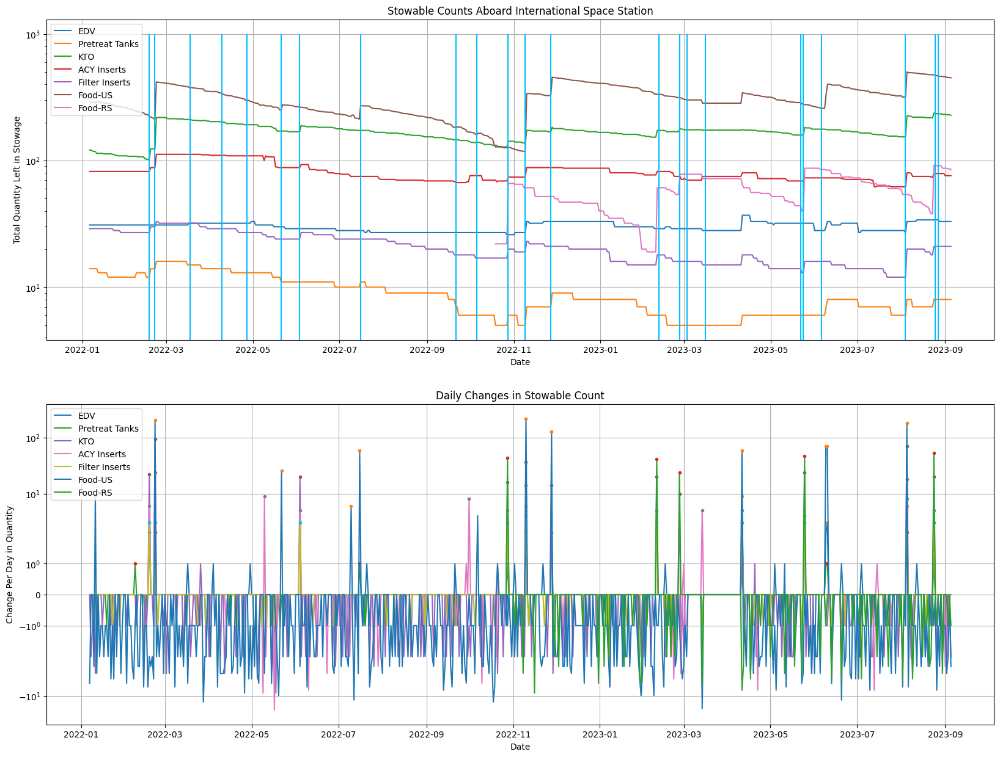

In [ ]:
fig, axs = plt.subplots(2, figsize=(20, 15)) # let the first plot show stowables over time, second show changes in stowables over time
countDataFrame = pd.DataFrame(columns=['Date','Count', 'CategoryName'])

for catIdx in range(1,8):
  # catIdx = 6
  categoryDataFrame = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)]
  categoryDataFrame = categoryDataFrame.drop_duplicates(subset=['id','date'])
  categoryCount = categoryDataFrame.groupby('date').count()['status']
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

  countDataFrame['Count'] = pd.Series(categoryCount)

  for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = categoryCount.index.get_loc(targetDate)
    correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
    categoryCount[targetIdx] = correctedValue

  categoryCount.index = pd.to_datetime(categoryCount.index)

  print(categoryCount.index)
  dateRangeIdx = pd.date_range('2022/01/06', '2023/09/05')
  categoryCountExtended = categoryCount.reindex(dateRangeIdx, method='ffill')
  print(categoryCountExtended.index)

  print(categoryCountExtended)
  print(categoryCount['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/03/04'])

  categoryCountGapped = categoryCount
  categoryCountGapped.index = pd.to_datetime(categoryCount.index)
  categoryCountGapped = categoryCountGapped.reindex(dateRangeIdx, method='ffill')

  print(categoryCountGapped['2023/03/01':'2023/03/15'])

  print(categoryCount.values)

  maxIndices = argrelmax(categoryCountExtended.values)
  maxSeries = categoryCountExtended.iloc[maxIndices]
  minIndices = argrelmin(categoryCountExtended.values)
  minSeries = categoryCountExtended.iloc[minIndices]

  print('Here is the maxSeries data:')
  print(maxSeries)

  maxSeriesExtended = maxSeries.reindex_like(categoryCount)

  print('Here is the minSeries data:')
  print(minSeries)

  minSeriesExtended = minSeries.reindex_like(categoryCount)
  print(maxSeries.index)

  print(minSeries.index)

  print(categoryCount.index)

  # categoryCountExtended.plot(kind='line', figsize=(10, 6))
  axs[0].plot(categoryCountExtended.index, categoryCountExtended.values, '-', label = categoryName)
  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)


  diffCategoryCountExtended = categoryCountExtended.diff()

  # To get rid of the resupply spikes, uncomment the for loop below
  #for i in diffCategoryCountExtended.index:
    #diffCategoryCountExtended[i] = diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0

  '''
  print()
  resupplyList = []
  for i in diffCategoryCountExtended.index:
    if diffCategoryCountExtended[i] > 1:
      resupplyList.append(diffCategoryCountExtended[i])
  '''
  resupplyList = argrelextrema(diffCategoryCountExtended.values, np.greater_equal)[0];

  significant_resupplyList = [i for i in resupplyList if diffCategoryCountExtended[i] > significantSpikeValues[catIdx-1]]
  resupplySeries = diffCategoryCountExtended.iloc[significant_resupplyList]

  for idx in resupplySeries.index:
    print(idx, resupplySeries[idx])

  #diffCategoryCountExtended.plot(kind='line', figsize=(10, 6))
  axs[1].plot(diffCategoryCountExtended.index, diffCategoryCountExtended.values, '-', label=categoryName)


  try:
    axs[1].plot(resupplySeries.index, resupplySeries.values, '.')
  except ValueError:
    pass

  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)


axs[0].set_title('Stowable Counts Aboard International Space Station')
axs[0].set_xlabel('Date')
axs[0].set_ylabel('Total Quantity Left in Stowage')
axs[0].set_yscale('log')
axs[0].grid(True)
axs[0].legend(loc='upper left')


axs[0].vlines(x=All_Docking_Happened.values, ymin=0, ymax=1000, color='deepskyblue', label='Dock')


#.show(axs[0])
# plt.show()

axs[1].set_title('Daily Changes in Stowable Count')
axs[1].set_xlabel('Date')
axs[1].set_ylabel('Change Per Day in Quantity')
axs[1].set_yscale('symlog')
axs[1].grid(True)
axs[1].legend()
#plt.show(axs[1])
plt.show()

In [ ]:
resupplySeries

2022-10-28    44.0
2023-02-10    42.0
2023-02-26    24.0
2023-05-25    47.0
2023-08-24    54.0
Name: status, dtype: float64

In [ ]:
print(categoryThresholdIdx)

[5, 8, 7, 0, 3, 15, 16]


In [ ]:
for catIdx in range(1,8):
  print(catIdx)
  print(categoryThresholdIdx[catIdx-1],1)

1
5 1
2
8 1
3
7 1
4
0 1
5
3 1
6
15 1
7
16 1


DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    31
2022-01-07    31
2022-01-08    31
2022-01-09    31
2022-01-10    31
 

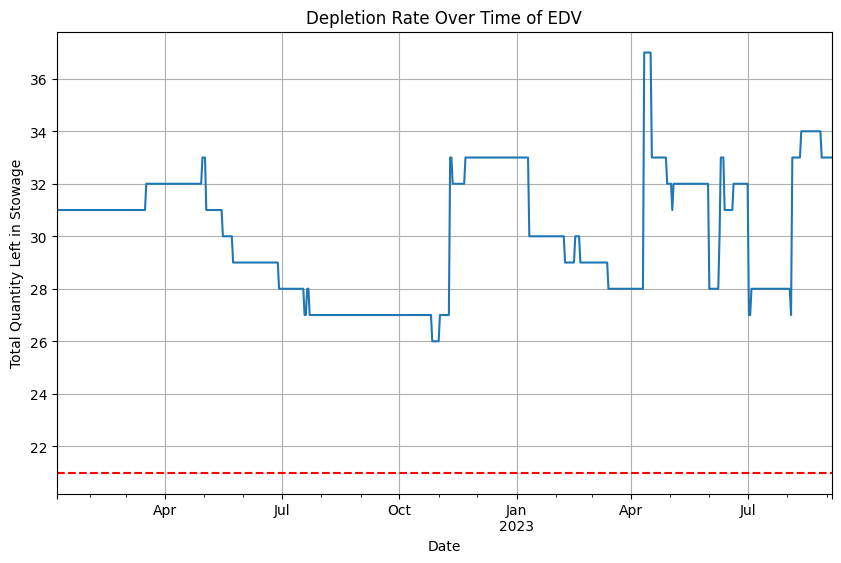

2022-11-10 00:00:00 6.0
2023-04-11 00:00:00 9.0
2023-06-10 00:00:00 3.0
2023-08-05 00:00:00 6.0


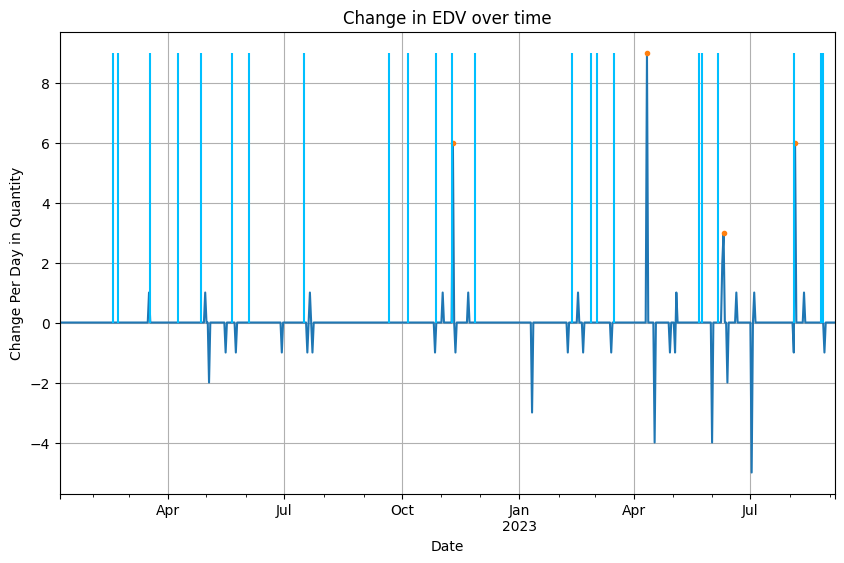

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    14
2022-01-07    14
2022-01-08    14
2022-01-09    14
2022-01-10    14
 

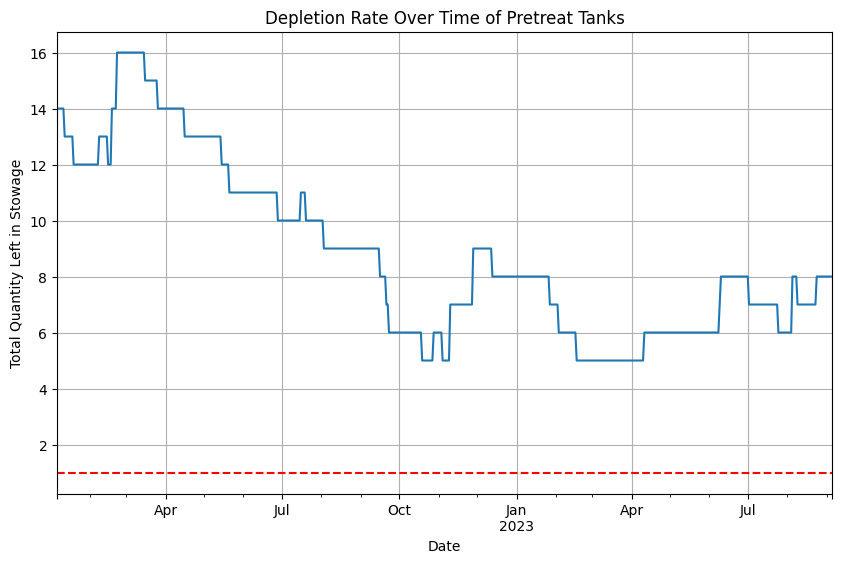

2022-02-08 00:00:00 1.0
2022-02-18 00:00:00 2.0
2022-02-22 00:00:00 2.0
2022-07-16 00:00:00 1.0
2022-10-28 00:00:00 1.0
2022-11-10 00:00:00 2.0
2022-11-28 00:00:00 2.0
2023-04-11 00:00:00 1.0
2023-06-09 00:00:00 1.0
2023-06-10 00:00:00 1.0
2023-08-05 00:00:00 2.0
2023-08-24 00:00:00 1.0


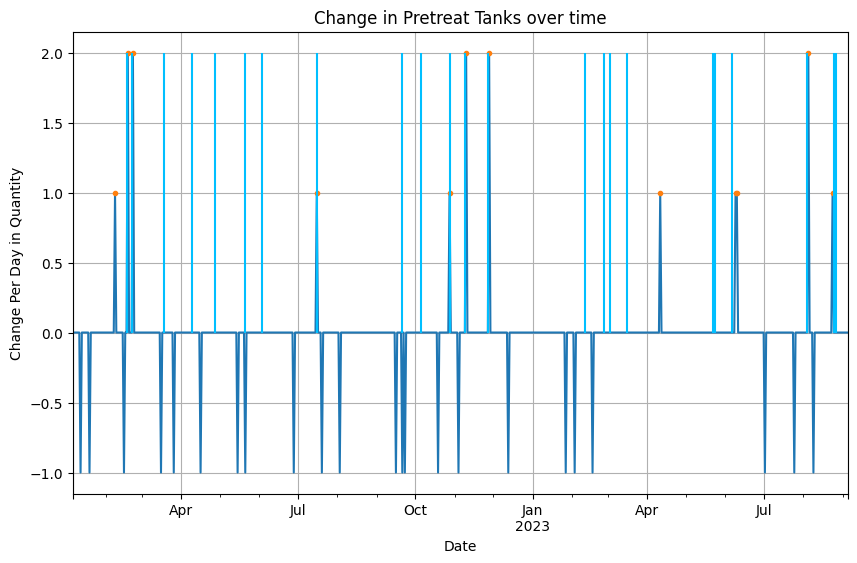

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    121
2022-01-07    121
2022-01-08    119
2022-01-09    118
2022-01-10    

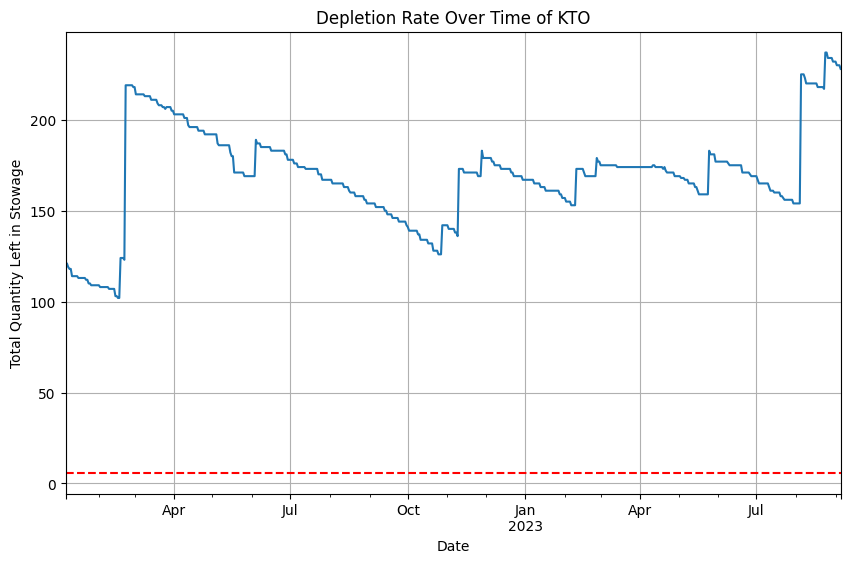

2022-02-18 00:00:00 22.0
2022-02-22 00:00:00 96.0
2022-06-04 00:00:00 20.0
2022-10-28 00:00:00 16.0
2022-11-10 00:00:00 37.0
2022-11-28 00:00:00 14.0
2023-02-10 00:00:00 20.0
2023-02-26 00:00:00 10.0
2023-05-25 00:00:00 24.0
2023-08-05 00:00:00 71.0
2023-08-24 00:00:00 20.0


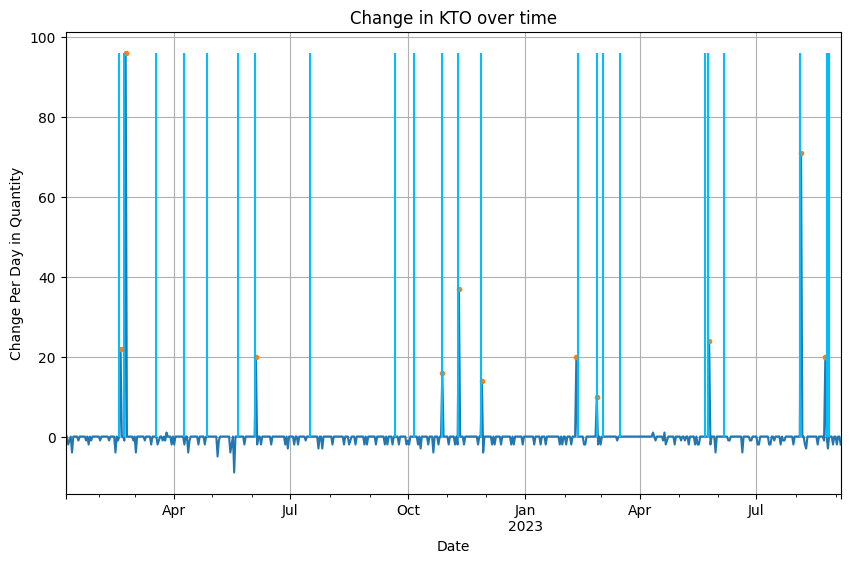

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    82
2022-01-07    82
2022-01-08    82
2022-01-09    82
2022-01-10    82
 

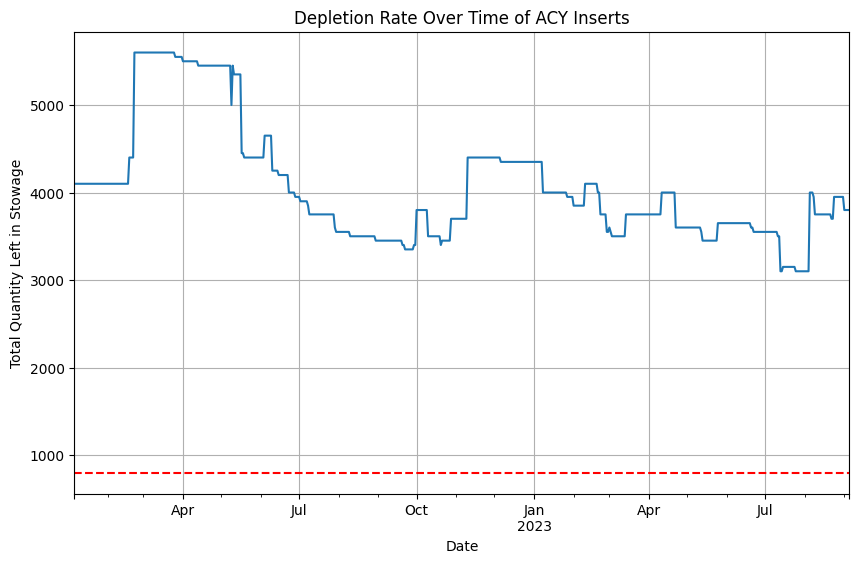

2022-02-18 00:00:00 300.0
2022-02-22 00:00:00 1200.0
2022-05-10 00:00:00 450.0
2022-06-04 00:00:00 250.0
2022-09-29 00:00:00 50.0
2022-10-01 00:00:00 400.0
2022-10-21 00:00:00 50.0
2022-10-28 00:00:00 250.0
2022-11-10 00:00:00 700.0
2023-02-10 00:00:00 250.0
2023-03-01 00:00:00 50.0
2023-03-14 00:00:00 250.0
2023-04-11 00:00:00 250.0
2023-05-25 00:00:00 200.0
2023-07-15 00:00:00 50.0
2023-08-05 00:00:00 900.0
2023-08-24 00:00:00 250.0


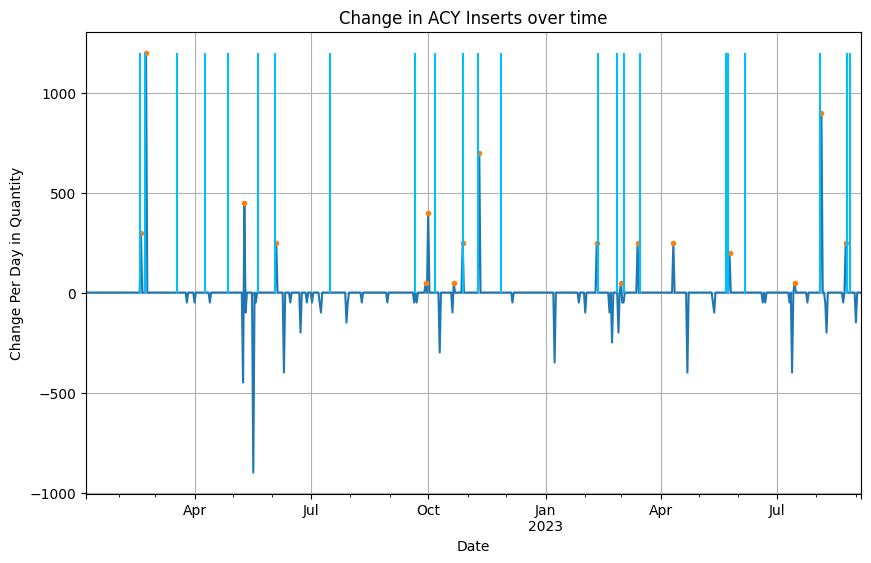

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    29
2022-01-07    29
2022-01-08    29
2022-01-09    29
2022-01-10    29
 

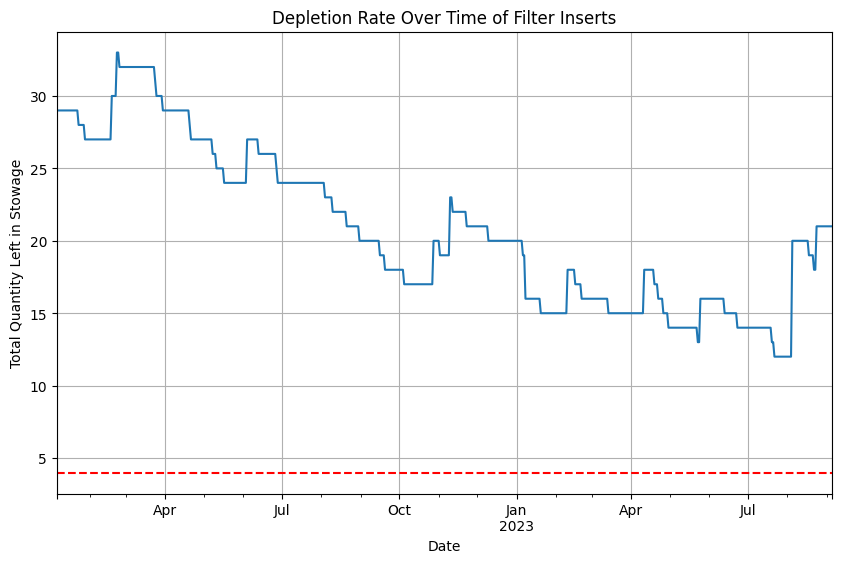

2022-02-18 00:00:00 3.0
2022-02-22 00:00:00 3.0
2022-06-04 00:00:00 3.0
2022-10-28 00:00:00 3.0
2022-11-10 00:00:00 4.0
2023-02-10 00:00:00 3.0
2023-04-11 00:00:00 3.0
2023-05-25 00:00:00 3.0
2023-08-05 00:00:00 8.0
2023-08-24 00:00:00 3.0


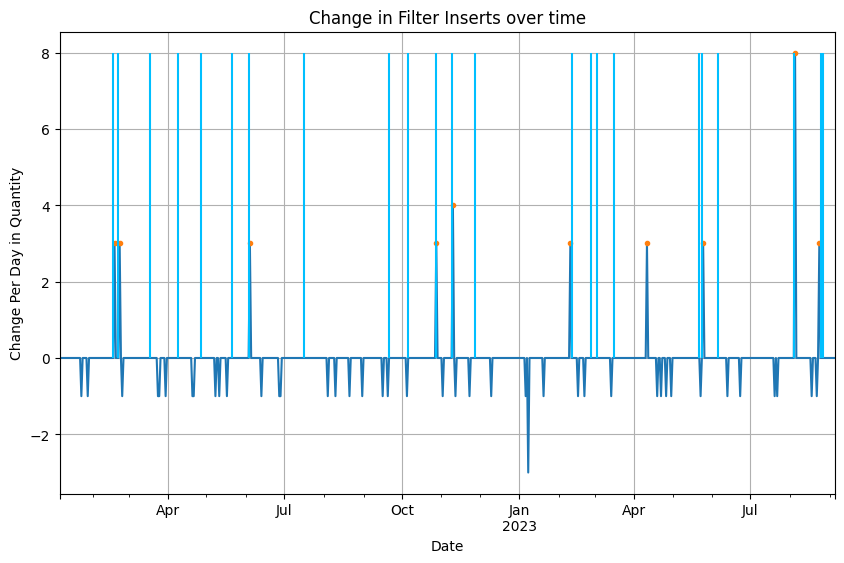

DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=540, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    294
2022-01-07    288
2022-01-08    288
2022-01-09    288
2022-01-10    

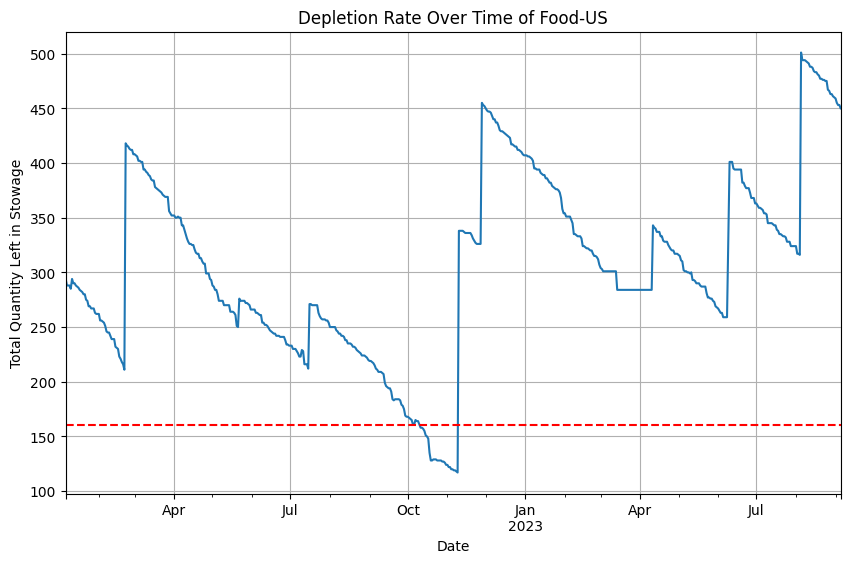

2022-01-11 00:00:00 9.0
2022-02-22 00:00:00 207.0
2022-05-22 00:00:00 26.0
2022-07-10 00:00:00 6.0
2022-07-16 00:00:00 59.0
2022-11-10 00:00:00 221.0
2022-11-28 00:00:00 129.0
2023-04-11 00:00:00 59.0
2023-06-09 00:00:00 71.0
2023-06-10 00:00:00 71.0
2023-08-05 00:00:00 185.0


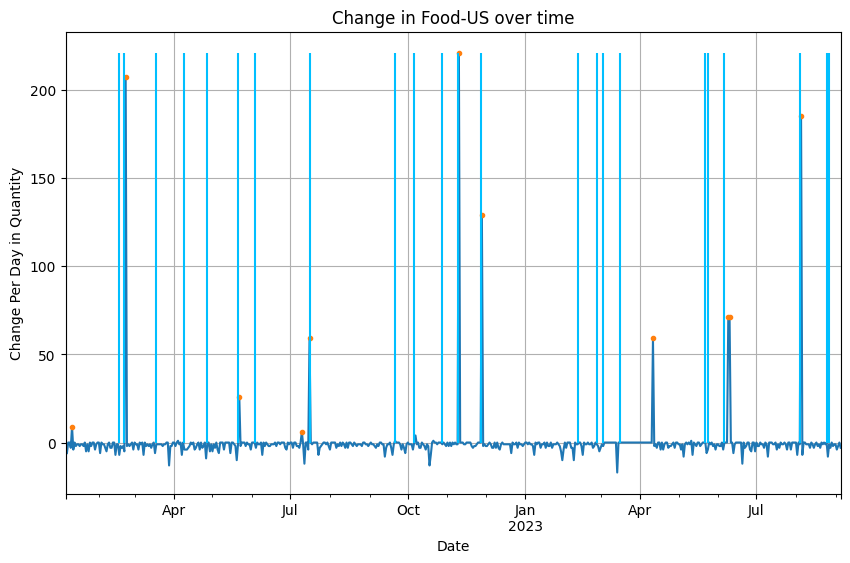

DatetimeIndex(['2022-10-19', '2022-10-20', '2022-10-21', '2022-10-22',
               '2022-10-23', '2022-10-24', '2022-10-25', '2022-10-26',
               '2022-10-27', '2022-10-28',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=267, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06     NaN
2022-01-07     NaN
2022-01-08     NaN
2022-01-09     NaN
2022-01-10

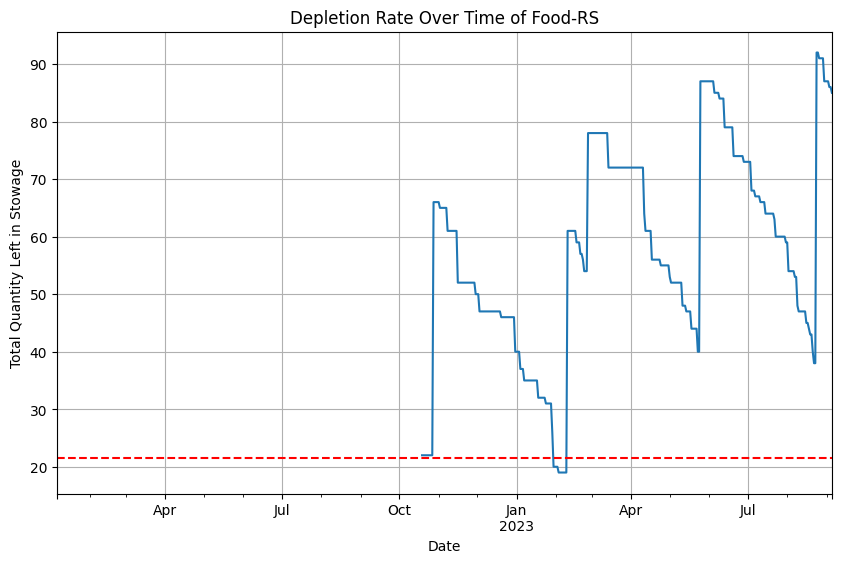

2022-10-28 00:00:00 44.0
2023-02-10 00:00:00 42.0
2023-02-26 00:00:00 24.0
2023-05-25 00:00:00 47.0
2023-08-24 00:00:00 54.0


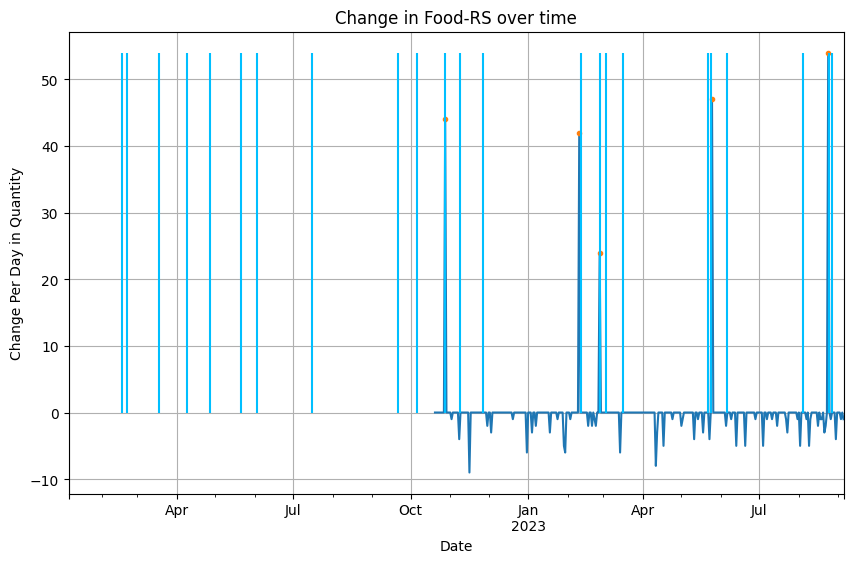

In [ ]:
# fig, axs = plt.subplots(2) # let the first plot show stowables over time, second show changes in stowables over time

for catIdx in range(1,8):
  # catIdx = 6
  categoryDataFrame = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)]
  categoryDataFrame = categoryDataFrame.drop_duplicates(subset=['id','date'])
  categoryCount = categoryDataFrame.groupby('date').count()['status']
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

  for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = categoryCount.index.get_loc(targetDate)
    correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
    categoryCount[targetIdx] = correctedValue

  categoryCount.index = pd.to_datetime(categoryCount.index)

  print(categoryCount.index)
  dateRangeIdx = pd.date_range('2022/01/06', '2023/09/05')
  categoryCountExtended = categoryCount.reindex(dateRangeIdx, method='ffill')
  print(categoryCountExtended.index)

  print(categoryCountExtended)
  print(categoryCount['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/03/04'])

  categoryCountGapped = categoryCount
  categoryCountGapped.index = pd.to_datetime(categoryCount.index)
  categoryCountGapped = categoryCountGapped.reindex(dateRangeIdx, method='ffill')

  print(categoryCountGapped['2023/03/01':'2023/03/15'])

  print(categoryCount.values)

  maxIndices = argrelmax(categoryCountExtended.values)
  maxSeries = categoryCountExtended.iloc[maxIndices]
  minIndices = argrelmin(categoryCountExtended.values)
  minSeries = categoryCountExtended.iloc[minIndices]

  print('Here is the maxSeries data:')
  print(maxSeries)

  maxSeriesExtended = maxSeries.reindex_like(categoryCount)

  print('Here is the minSeries data:')
  print(minSeries)

  minSeriesExtended = minSeries.reindex_like(categoryCount)
  print(maxSeries.index)

  print(minSeries.index)

  print(categoryCount.index)

  # categoryCountExtended.plot(kind='line', figsize=(10, 6))
  if catIdx == 4:
    categoryCountExtended *= 50
  categoryCountExtended.plot(kind = 'line', figsize=(10,6))
  #plt.vlines(x=All_Docking_Happened.values, ymin=0, ymax=categoryCountExtended.max(), color='deepskyblue', label='Dock')
  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.axhline(y=thresholds.iloc[categoryThresholdIdx[catIdx-1],1], color='red', linestyle='--', label=thresholds.iloc[categoryThresholdIdx[catIdx-1],0])
  plt.title('Depletion Rate Over Time of ' + categoryName)
  plt.xlabel('Date')
  plt.ylabel('Total Quantity Left in Stowage')
  plt.grid(True)
  plt.show()

  diffCategoryCountExtended = categoryCountExtended.diff()

  # To get rid of the resupply spikes, uncomment the for loop below
  #for i in diffCategoryCountExtended.index:
    #diffCategoryCountExtended[i] = diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0

  '''
print( )
resupplyList = []
for i in diffCategoryCountExtended.index:
  if diffCategoryCountExtended[i] > 1:
    resupplyList.append(diffCategoryCountExtended[i])
  '''
  resupplyList = argrelextrema(diffCategoryCountExtended.values, np.greater_equal)[0];

  significant_resupplyList = [i for i in resupplyList if diffCategoryCountExtended[i] > significantSpikeValues[catIdx-1]]
  resupplySeries = diffCategoryCountExtended.iloc[significant_resupplyList]

  for idx in resupplySeries.index:
    print(idx, resupplySeries[idx])

  diffCategoryCountExtended.plot(kind='line', figsize=(10, 6))
  try:
    resupplySeries.plot(style='.')
  except ValueError:
    pass

  plt.vlines(x=All_Docking_Happened.values, ymin=0, ymax=diffCategoryCountExtended.max(), color='deepskyblue', label='Dock')

  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.title('Change in ' + categoryName + ' over time')
  plt.xlabel('Date')
  plt.ylabel('Change Per Day in Quantity')
  plt.grid(True)
  plt.show()


Here are linear regressions for the different resupply sections of the Category 6 Data. Although there are some anomalies, the R^2 values are generally close to 1.

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    31
2022-01-07    31
2022-01-08    31
2022-01-09    31
2022-01-10    31
 

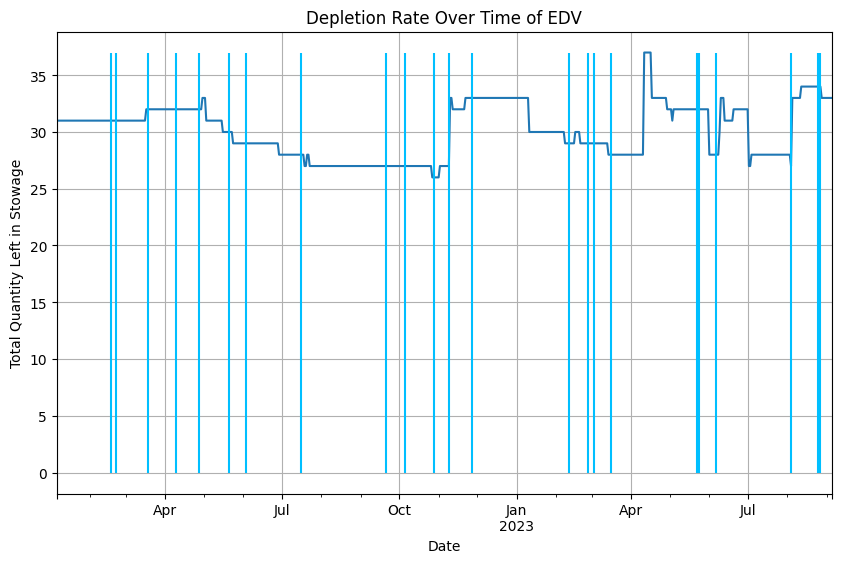

2022-11-10 00:00:00 6.0
2023-04-11 00:00:00 9.0
2023-06-10 00:00:00 3.0
2023-08-05 00:00:00 6.0


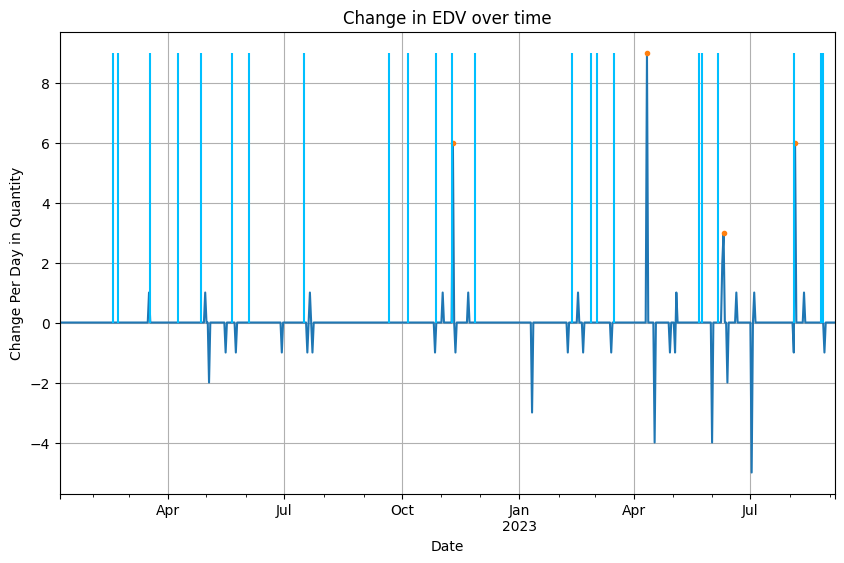

From:  2022-11-10 00:00:00 To:  2023-04-11 00:00:00
Slope:  -0.041382185498807386
R2 Score:  0.8398348014483235


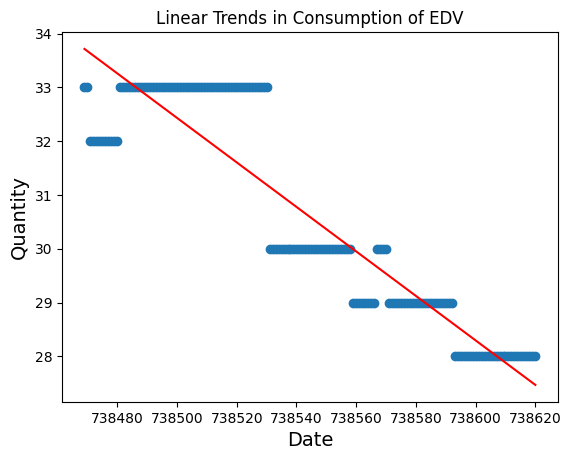


From:  2023-04-11 00:00:00 To:  2023-06-10 00:00:00
Slope:  -0.10433453737149209
R2 Score:  0.6658708081641377


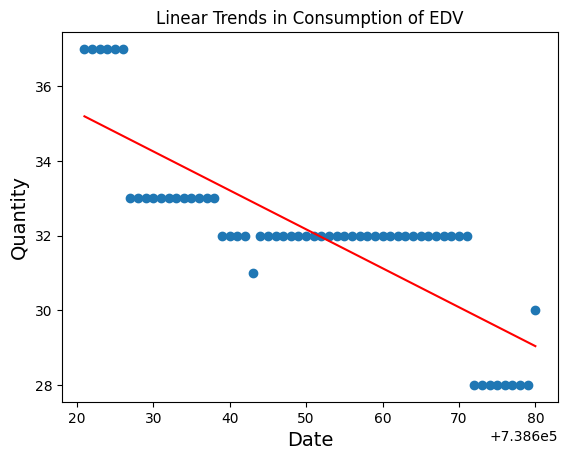


From:  2023-06-10 00:00:00 To:  2023-08-05 00:00:00
Slope:  -0.09859876965140121
R2 Score:  0.6589566155738444


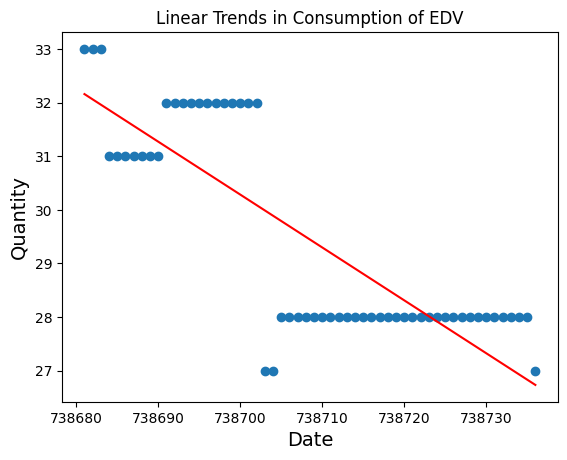

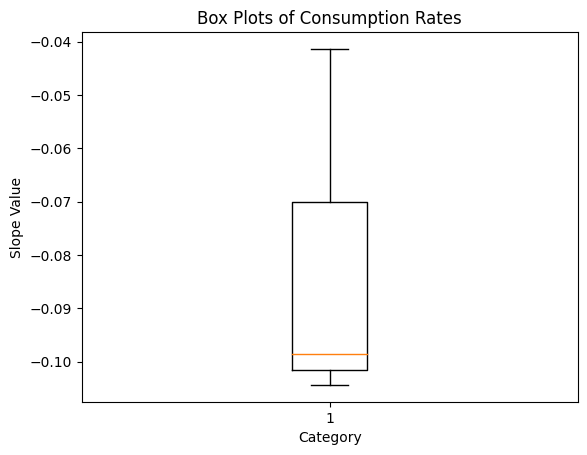

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    14
2022-01-07    14
2022-01-08    14
2022-01-09    14
2022-01-10    14
 

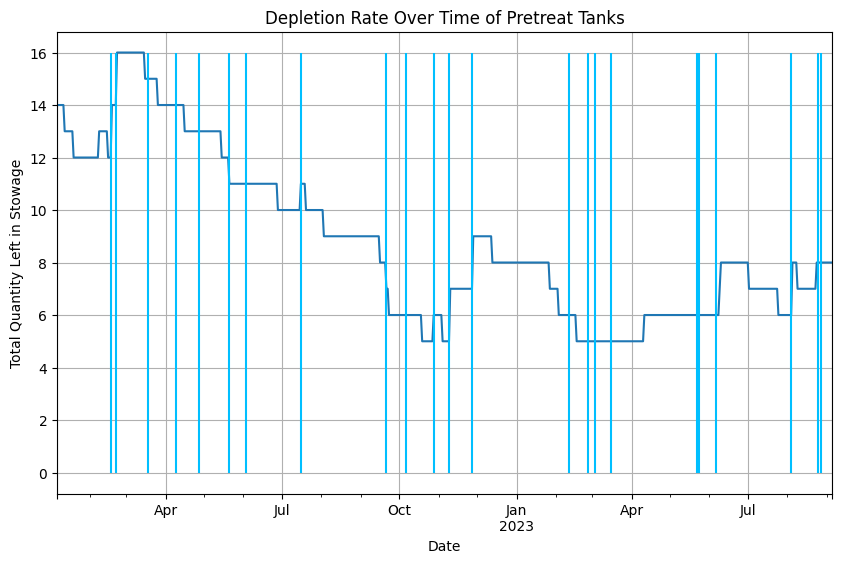

2022-02-08 00:00:00 1.0
2022-02-18 00:00:00 2.0
2022-02-22 00:00:00 2.0
2022-07-16 00:00:00 1.0
2022-10-28 00:00:00 1.0
2022-11-10 00:00:00 2.0
2022-11-28 00:00:00 2.0
2023-04-11 00:00:00 1.0
2023-06-09 00:00:00 1.0
2023-06-10 00:00:00 1.0
2023-08-05 00:00:00 2.0
2023-08-24 00:00:00 1.0


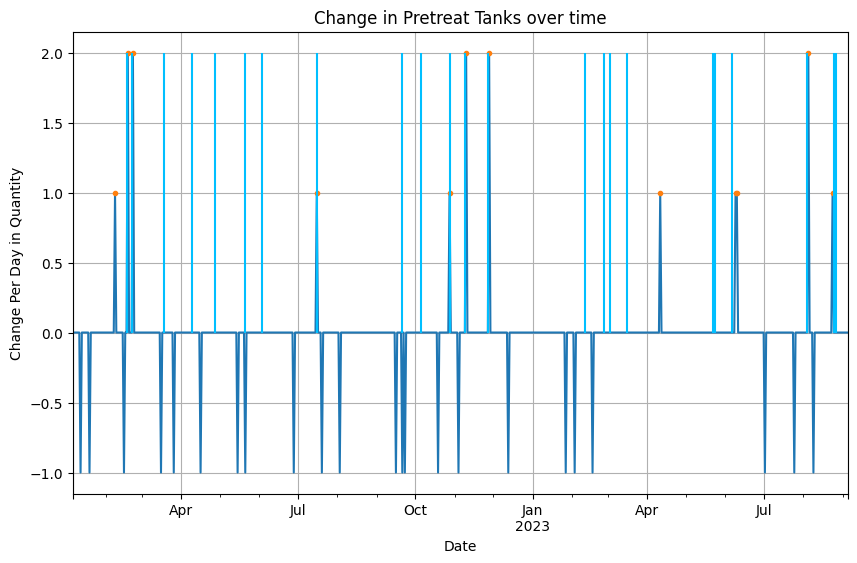

From:  2022-02-08 00:00:00 To:  2022-02-18 00:00:00
Slope:  -0.1272727272727273
R2 Score:  0.6363636363696838


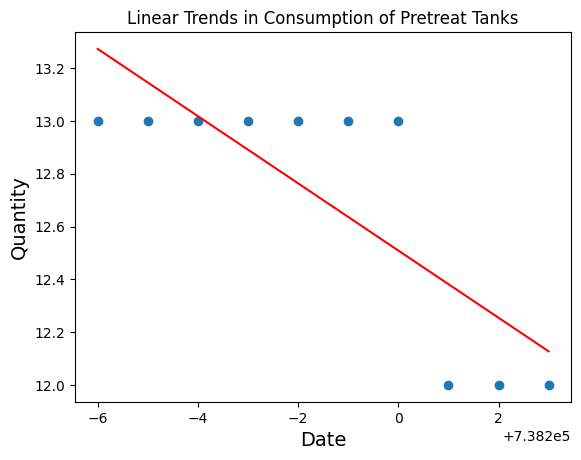


From:  2022-02-18 00:00:00 To:  2022-02-22 00:00:00
Slope:  0.0
R2 Score:  1.0


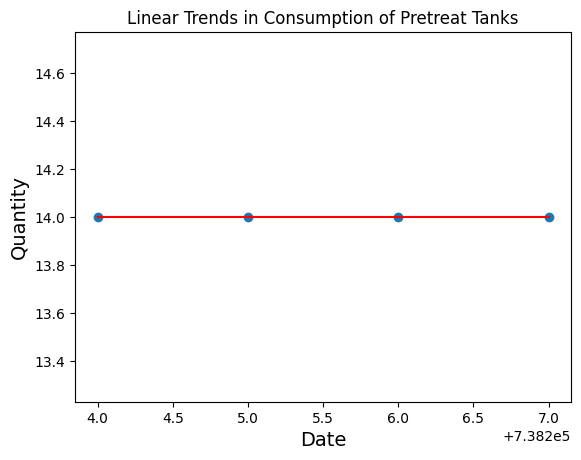


From:  2022-02-22 00:00:00 To:  2022-07-16 00:00:00
Slope:  -0.04696366851539266
R2 Score:  0.9574886844959125


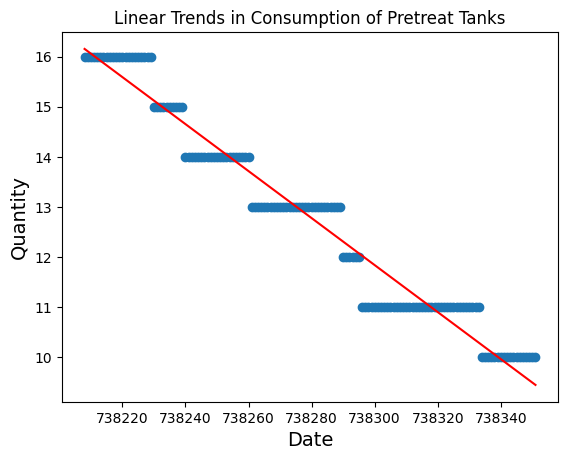


From:  2022-07-16 00:00:00 To:  2022-10-28 00:00:00
Slope:  -0.05495038941640883
R2 Score:  0.8764638653985246


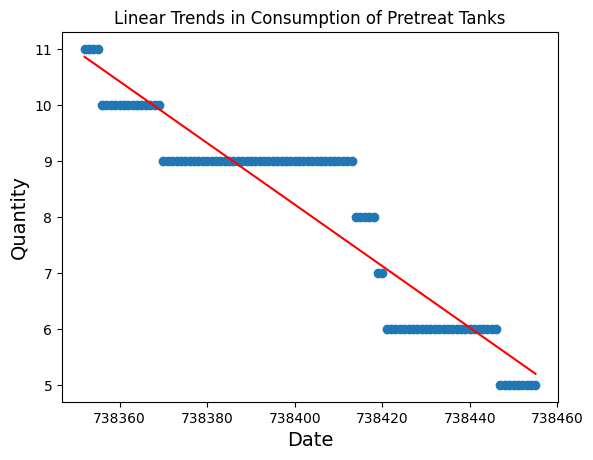


From:  2022-10-28 00:00:00 To:  2022-11-10 00:00:00
Slope:  -0.11538461538461539
R2 Score:  0.7500000000017324


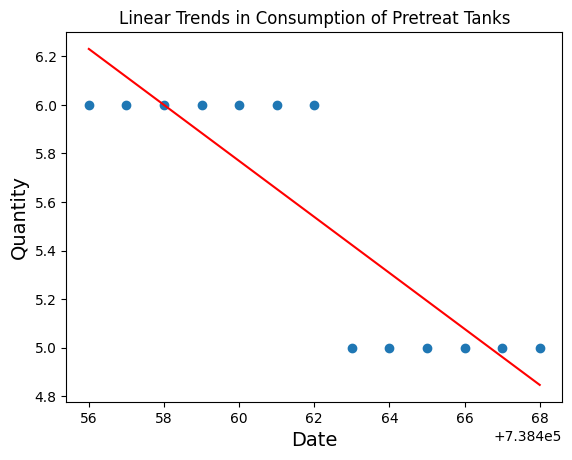


From:  2022-11-10 00:00:00 To:  2022-11-28 00:00:00
Slope:  0.0
R2 Score:  1.0


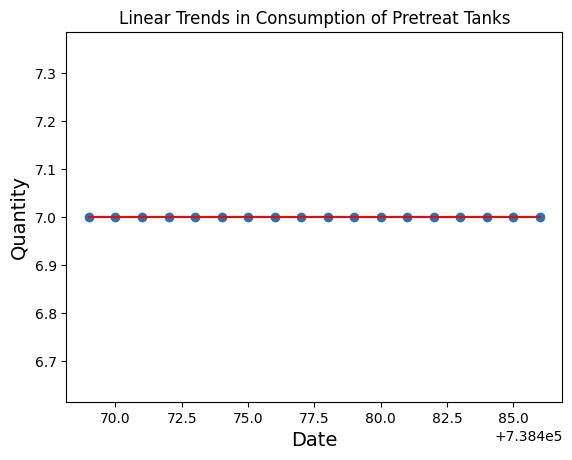


From:  2022-11-28 00:00:00 To:  2023-04-11 00:00:00
Slope:  -0.03742440678811455
R2 Score:  0.8889669226496897


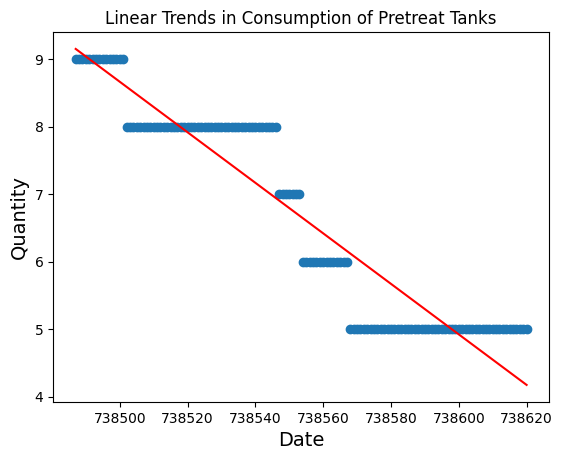


From:  2023-04-11 00:00:00 To:  2023-06-09 00:00:00
Slope:  0.0
R2 Score:  1.0


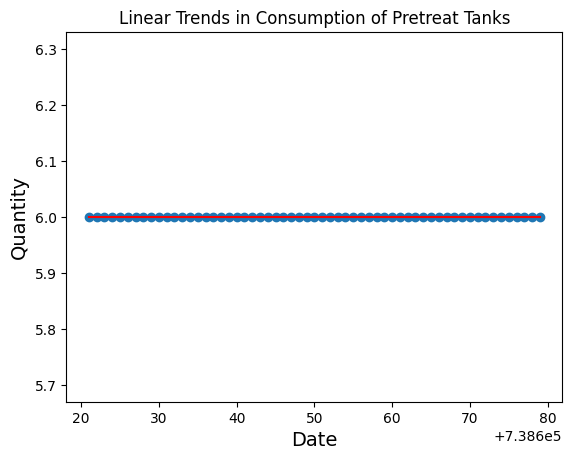


From:  2023-06-09 00:00:00 To:  2023-06-10 00:00:00
Slope:  0.0
R2 Score:  nan


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


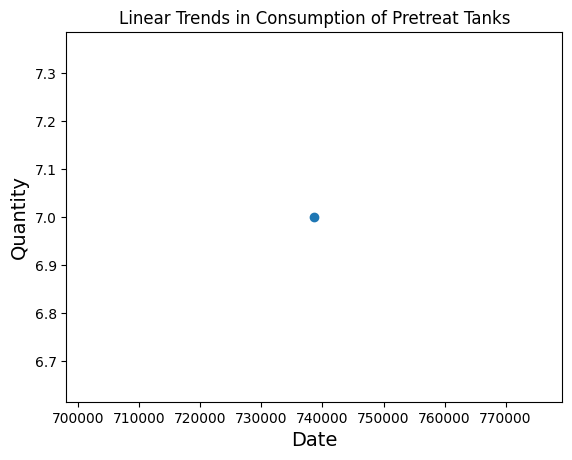


From:  2023-06-10 00:00:00 To:  2023-08-05 00:00:00
Slope:  -0.04248120300751879
R2 Score:  0.8561180020112235


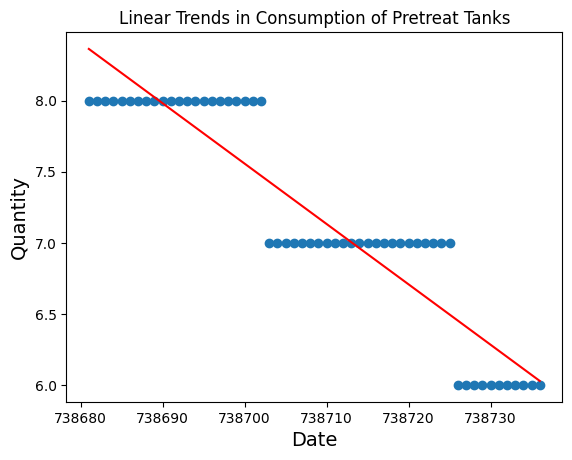


From:  2023-08-05 00:00:00 To:  2023-08-24 00:00:00
Slope:  -0.052631578947368425
R2 Score:  0.5000000000014553


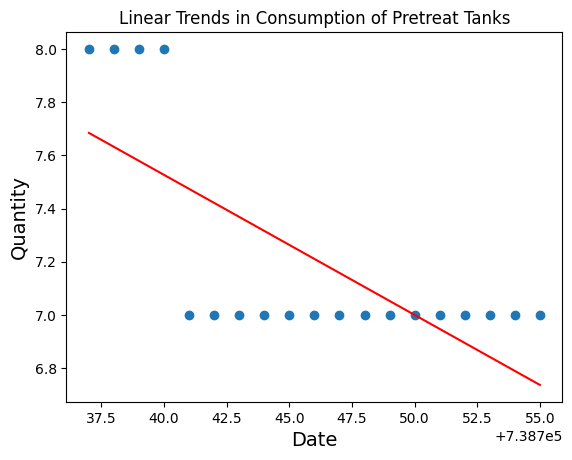

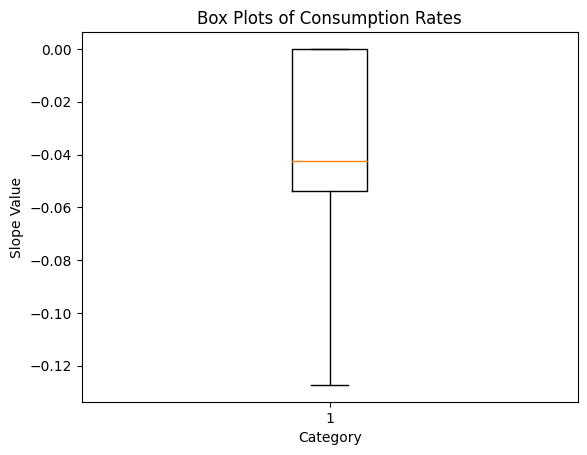

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    121
2022-01-07    121
2022-01-08    119
2022-01-09    118
2022-01-10    

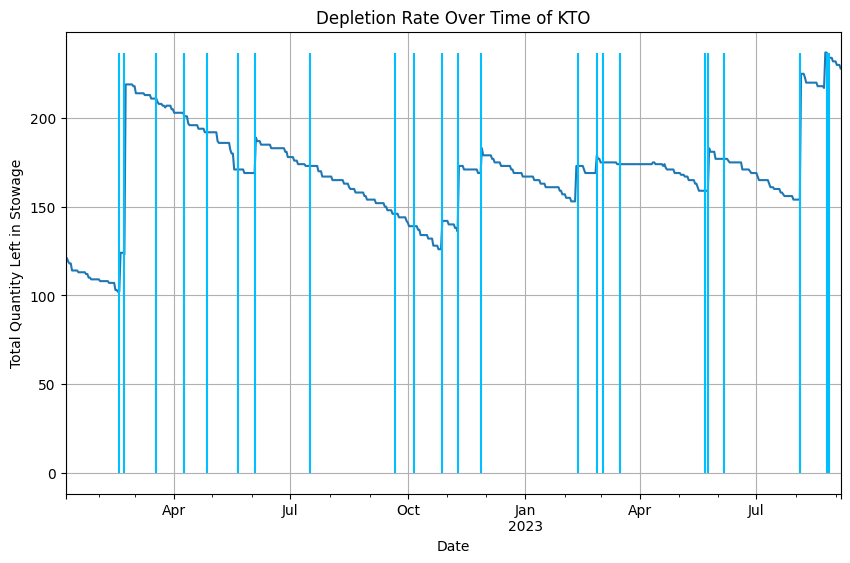

2022-02-18 00:00:00 22.0
2022-02-22 00:00:00 96.0
2022-06-04 00:00:00 20.0
2022-10-28 00:00:00 16.0
2022-11-10 00:00:00 37.0
2022-11-28 00:00:00 14.0
2023-02-10 00:00:00 20.0
2023-02-26 00:00:00 10.0
2023-05-25 00:00:00 24.0
2023-08-05 00:00:00 71.0
2023-08-24 00:00:00 20.0


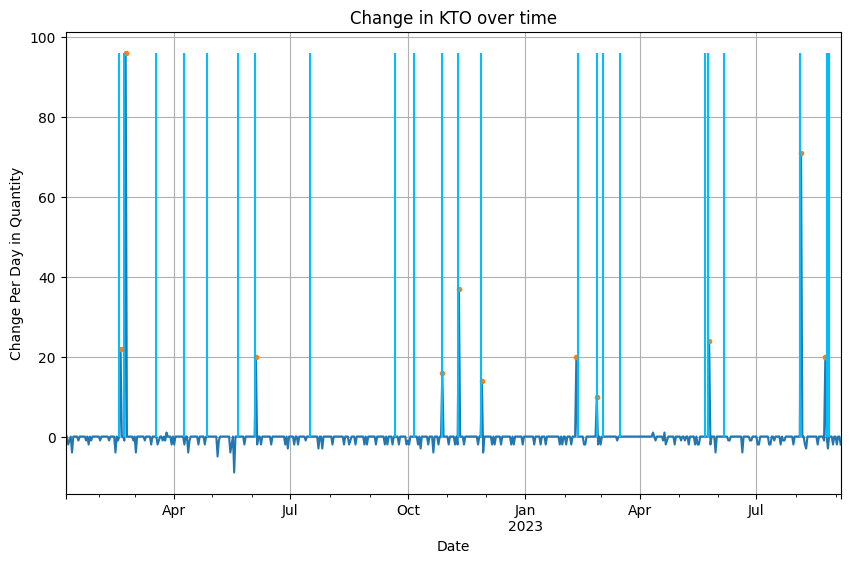

From:  2022-02-18 00:00:00 To:  2022-02-22 00:00:00
Slope:  -0.29999999999999993
R2 Score:  0.599999999992239


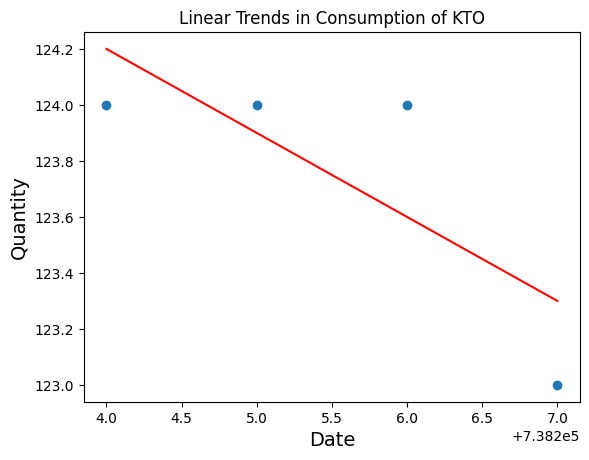


From:  2022-02-22 00:00:00 To:  2022-06-04 00:00:00
Slope:  -0.515852327665662
R2 Score:  0.9624986483571165


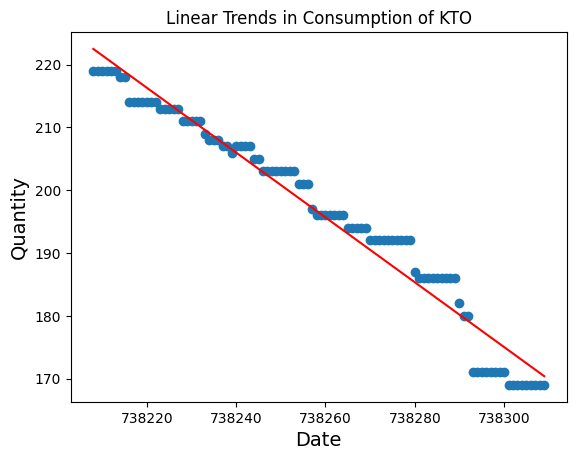


From:  2022-06-04 00:00:00 To:  2022-10-28 00:00:00
Slope:  -0.4124762611705051
R2 Score:  0.9898915210656992


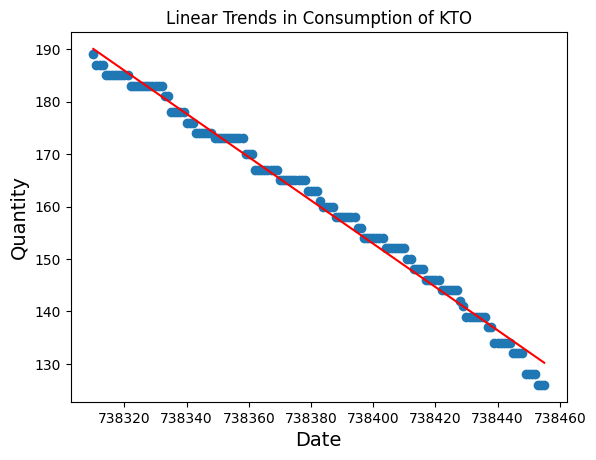


From:  2022-10-28 00:00:00 To:  2022-11-10 00:00:00
Slope:  -0.45054945054945056
R2 Score:  0.8455734406440388


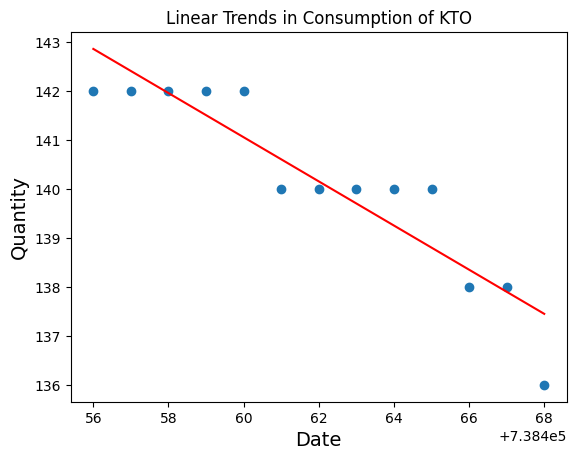


From:  2022-11-10 00:00:00 To:  2022-11-28 00:00:00
Slope:  -0.20846233230134156
R2 Score:  0.7579690402499314


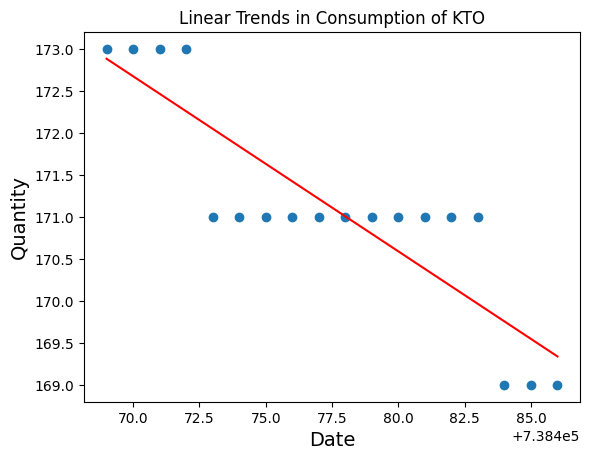


From:  2022-11-28 00:00:00 To:  2023-02-10 00:00:00
Slope:  -0.3576749352091818
R2 Score:  0.9820894569508739


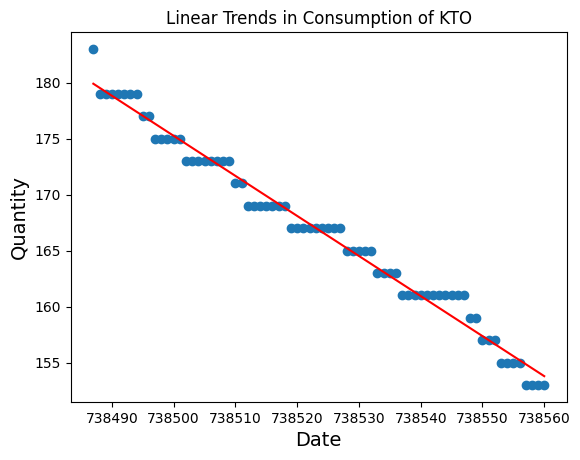


From:  2023-02-10 00:00:00 To:  2023-02-26 00:00:00
Slope:  -0.3617647058823528
R2 Score:  0.7705118411017247


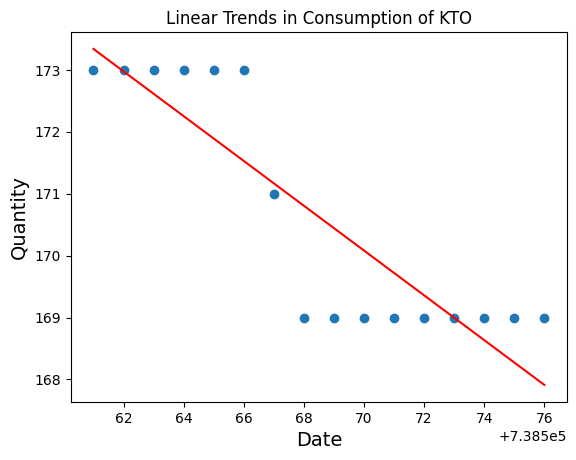


From:  2023-02-26 00:00:00 To:  2023-05-25 00:00:00
Slope:  -0.17693106970518824
R2 Score:  0.7561687845471659


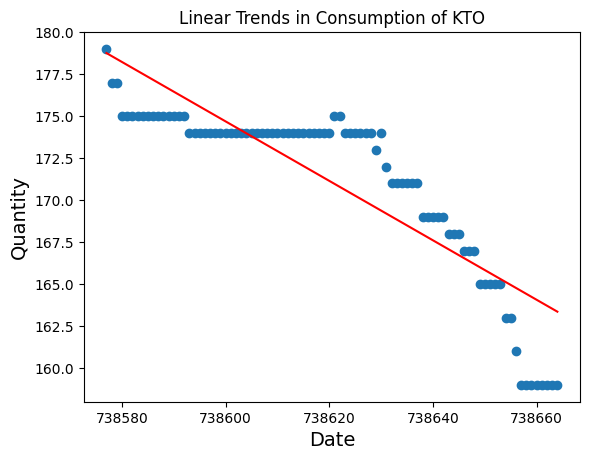


From:  2023-05-25 00:00:00 To:  2023-08-05 00:00:00
Slope:  -0.41208437841661844
R2 Score:  0.980570292342271


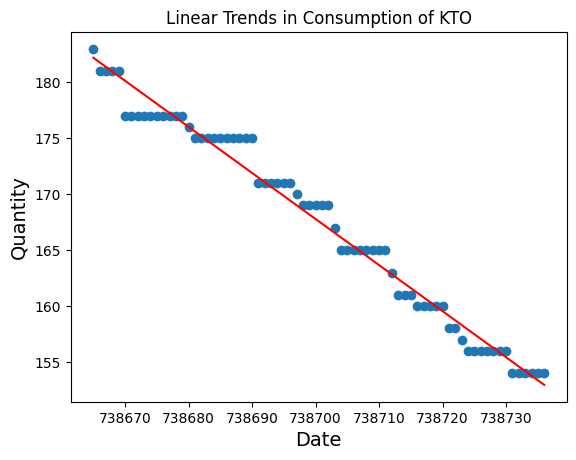


From:  2023-08-05 00:00:00 To:  2023-08-24 00:00:00
Slope:  -0.394736842105263
R2 Score:  0.7952403393023527


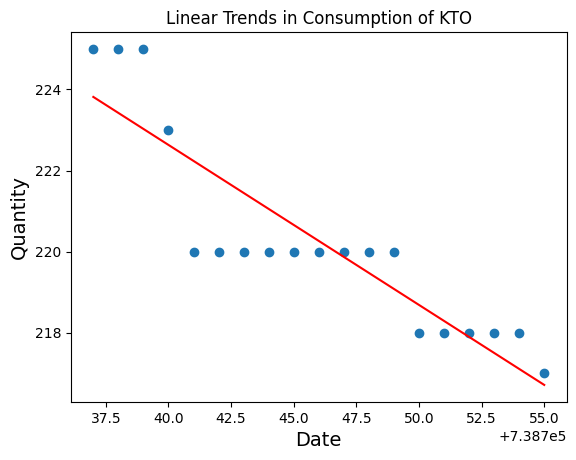

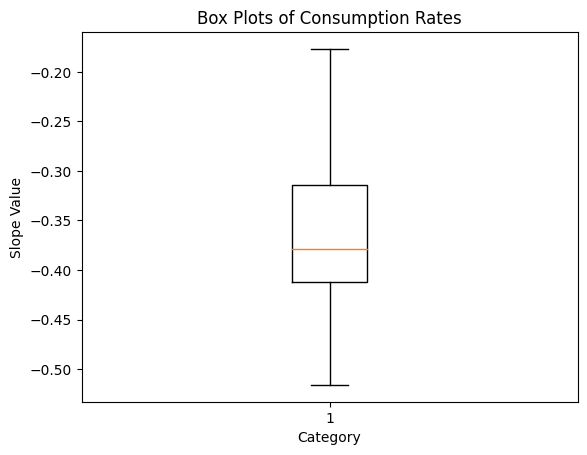

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    82
2022-01-07    82
2022-01-08    82
2022-01-09    82
2022-01-10    82
 

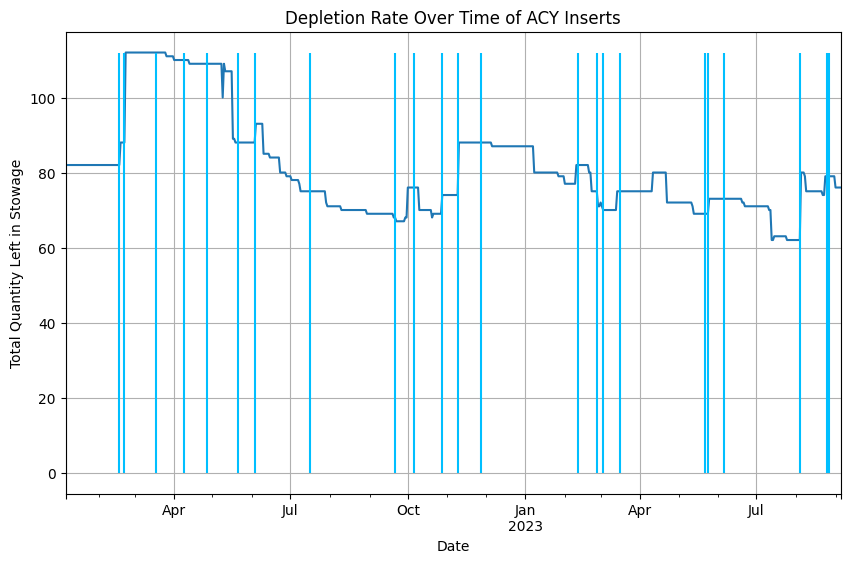

2022-02-18 00:00:00 6.0
2022-02-22 00:00:00 24.0
2022-05-10 00:00:00 9.0
2022-06-04 00:00:00 5.0
2022-10-01 00:00:00 8.0
2022-10-28 00:00:00 5.0
2022-11-10 00:00:00 14.0
2023-02-10 00:00:00 5.0
2023-03-14 00:00:00 5.0
2023-04-11 00:00:00 5.0
2023-05-25 00:00:00 4.0
2023-08-05 00:00:00 18.0
2023-08-24 00:00:00 5.0


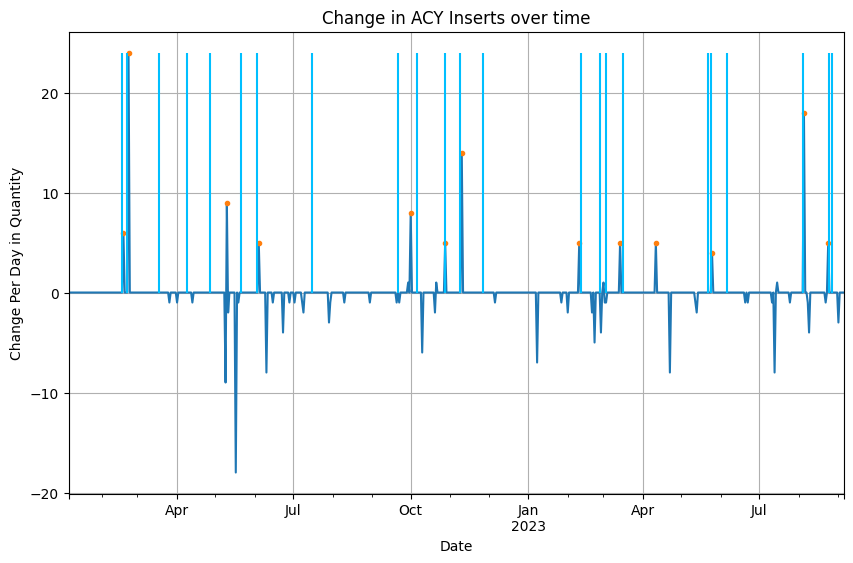

From:  2022-02-18 00:00:00 To:  2022-02-22 00:00:00
Slope:  0.0
R2 Score:  1.0


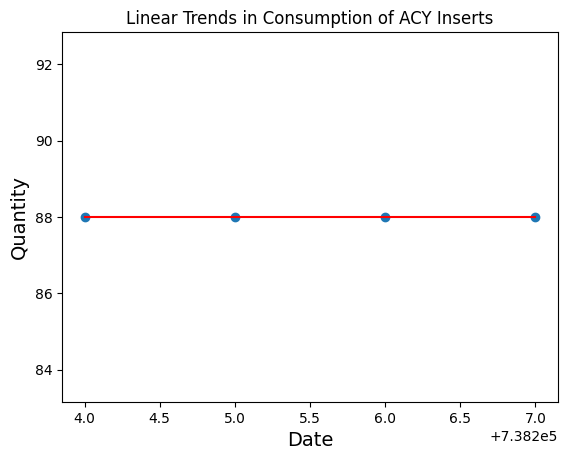


From:  2022-02-22 00:00:00 To:  2022-05-10 00:00:00
Slope:  -0.06514538093485463
R2 Score:  0.6589339246530884


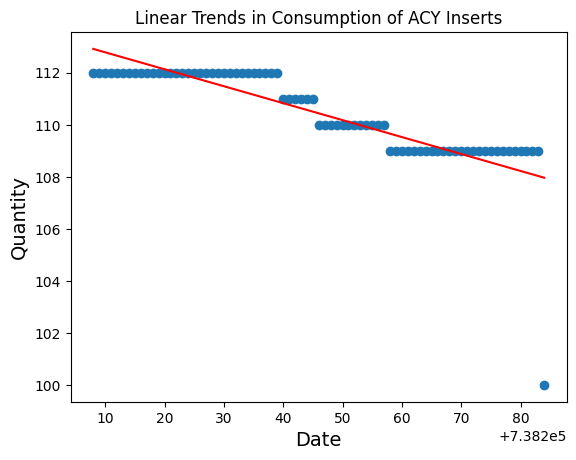


From:  2022-05-10 00:00:00 To:  2022-06-04 00:00:00
Slope:  -0.946153846153846
R2 Score:  0.6262749864224135


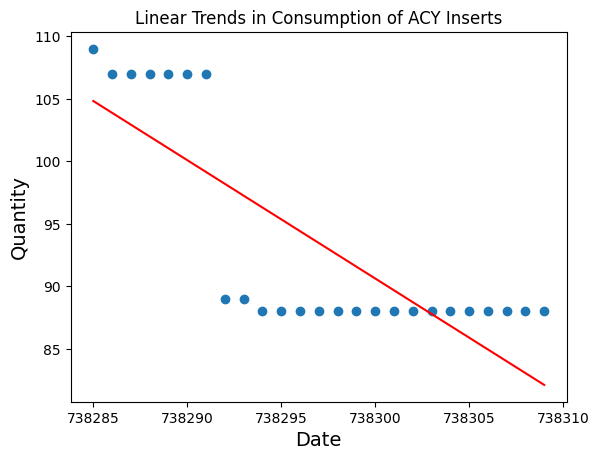


From:  2022-06-04 00:00:00 To:  2022-10-01 00:00:00
Slope:  -0.17842899871813137
R2 Score:  0.8298145203292527


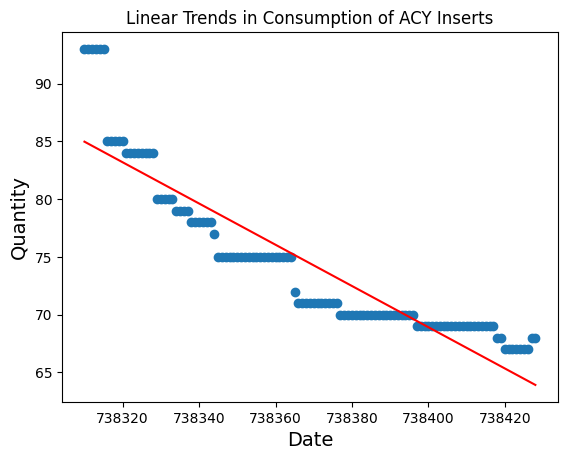


From:  2022-10-01 00:00:00 To:  2022-10-28 00:00:00
Slope:  -0.34676434676434686
R2 Score:  0.7575467267784451


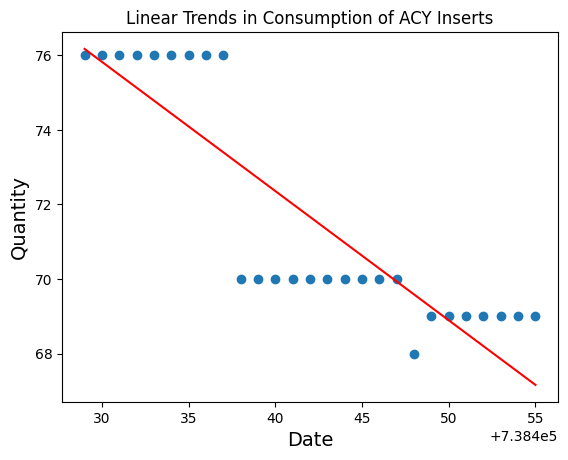


From:  2022-10-28 00:00:00 To:  2022-11-10 00:00:00
Slope:  0.0
R2 Score:  1.0


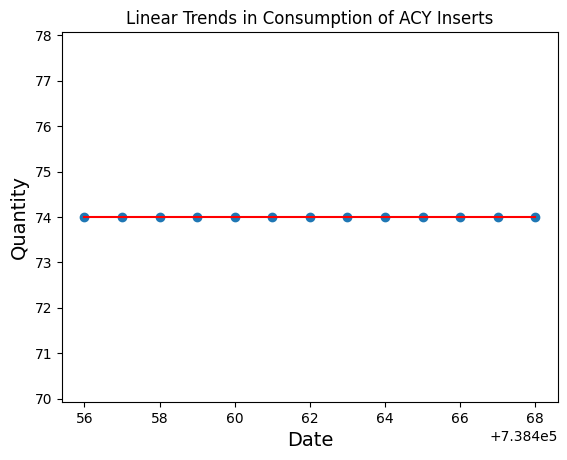


From:  2022-11-10 00:00:00 To:  2023-02-10 00:00:00
Slope:  -0.1381794923169397
R2 Score:  0.7908547890907673


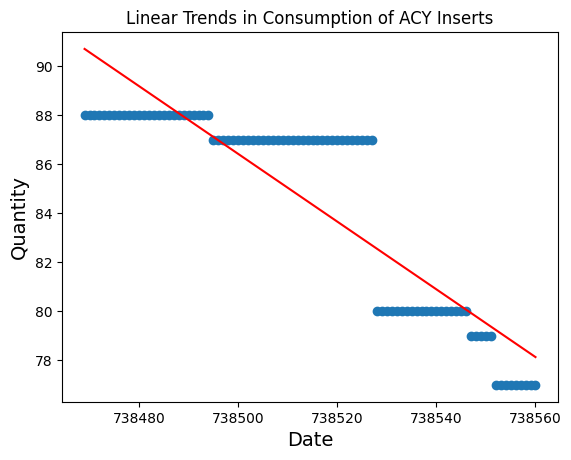


From:  2023-02-10 00:00:00 To:  2023-03-14 00:00:00
Slope:  -0.5285923753665691
R2 Score:  0.8772610620383304


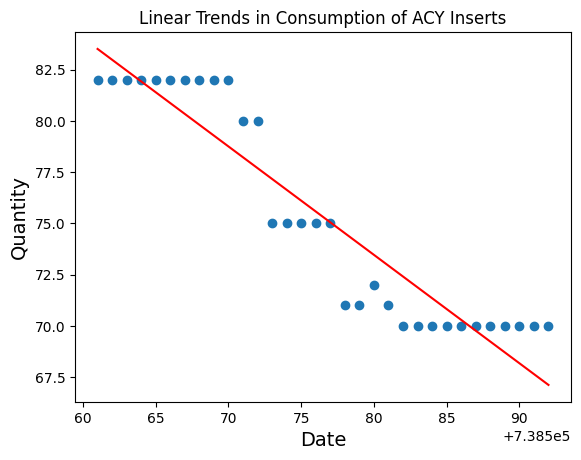


From:  2023-03-14 00:00:00 To:  2023-04-11 00:00:00
Slope:  0.0
R2 Score:  1.0


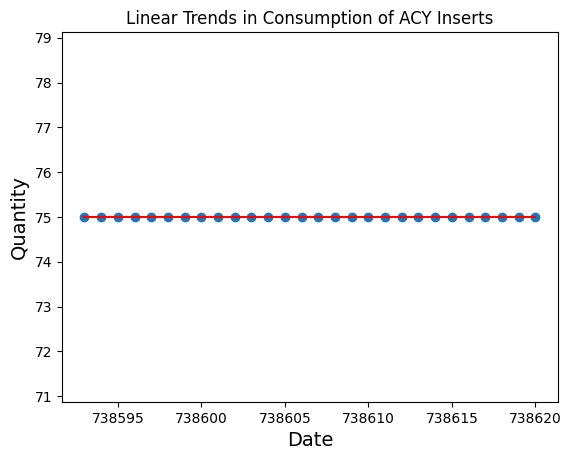


From:  2023-04-11 00:00:00 To:  2023-05-25 00:00:00
Slope:  -0.2871740662438337
R2 Score:  0.7761344258162364


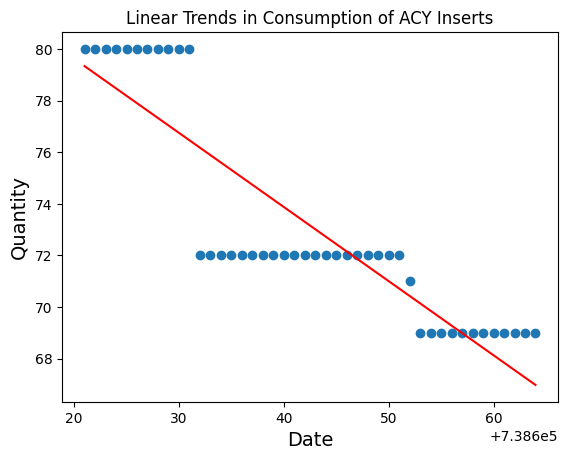


From:  2023-05-25 00:00:00 To:  2023-08-05 00:00:00
Slope:  -0.19645957939417324
R2 Score:  0.7954147433636735


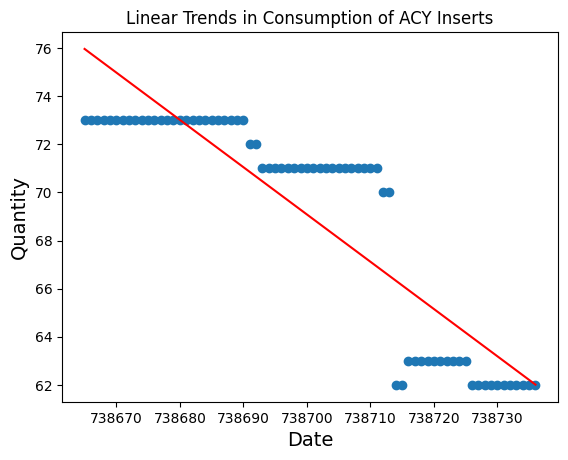


From:  2023-08-05 00:00:00 To:  2023-08-24 00:00:00
Slope:  -0.28245614035087707
R2 Score:  0.5845963013082827


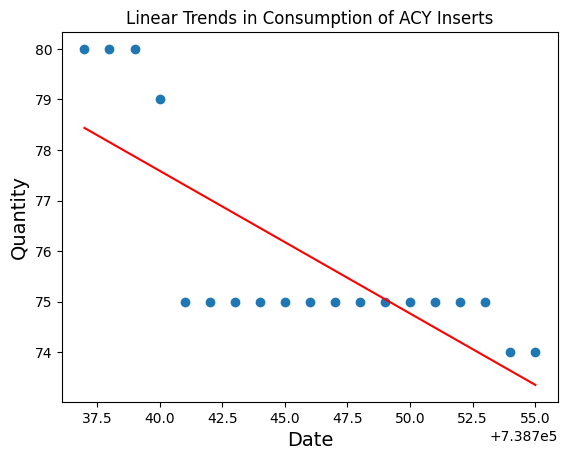

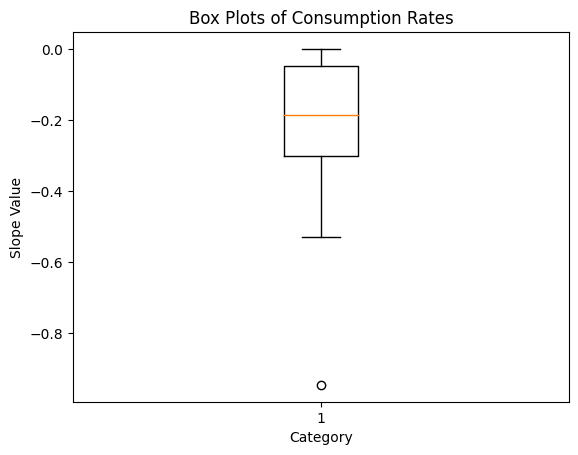

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    29
2022-01-07    29
2022-01-08    29
2022-01-09    29
2022-01-10    29
 

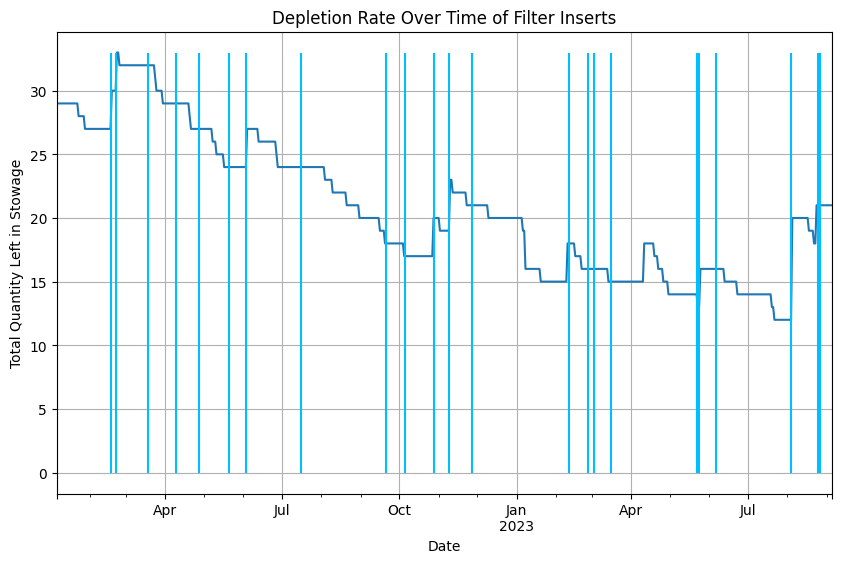

2022-02-18 00:00:00 3.0
2022-02-22 00:00:00 3.0
2022-06-04 00:00:00 3.0
2022-10-28 00:00:00 3.0
2022-11-10 00:00:00 4.0
2023-02-10 00:00:00 3.0
2023-04-11 00:00:00 3.0
2023-05-25 00:00:00 3.0
2023-08-05 00:00:00 8.0
2023-08-24 00:00:00 3.0


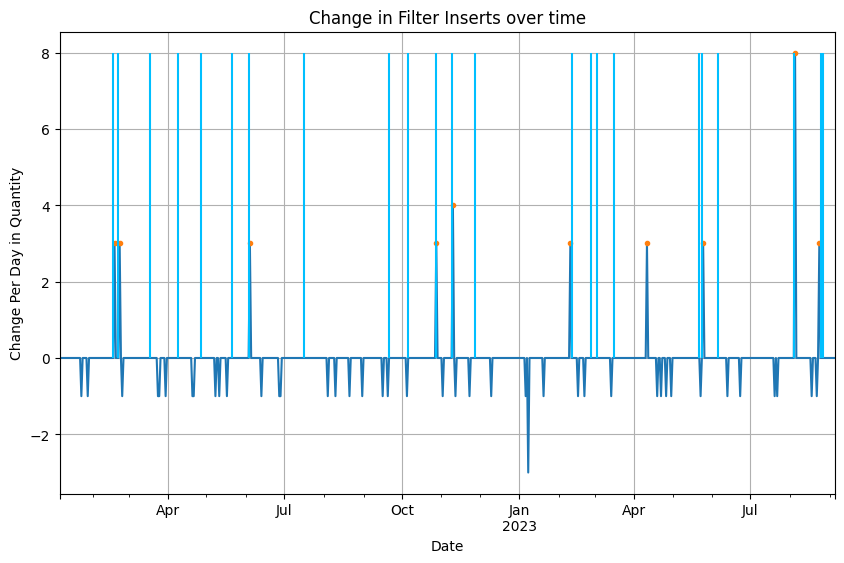

From:  2022-02-18 00:00:00 To:  2022-02-22 00:00:00
Slope:  0.0
R2 Score:  1.0


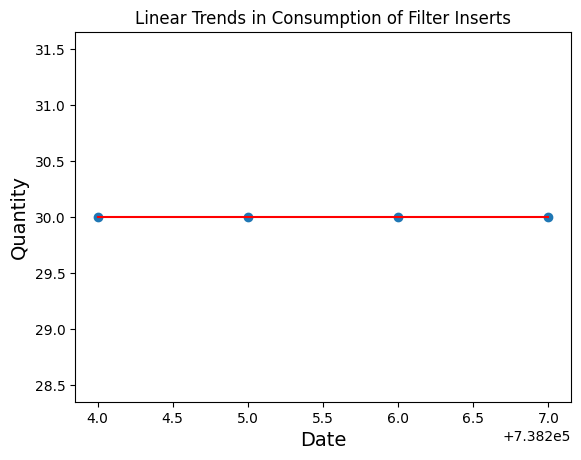


From:  2022-02-22 00:00:00 To:  2022-06-04 00:00:00
Slope:  -0.0987441405476927
R2 Score:  0.9570548732231093


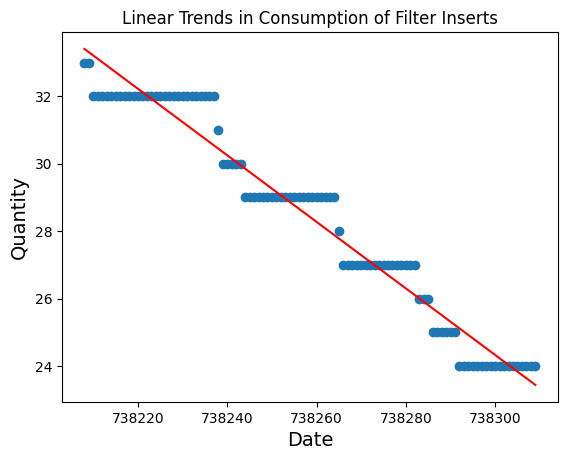


From:  2022-06-04 00:00:00 To:  2022-10-28 00:00:00
Slope:  -0.07553430441614528
R2 Score:  0.9714230492367931


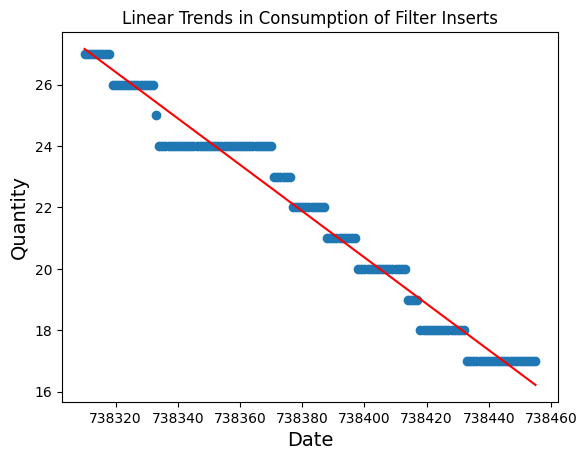


From:  2022-10-28 00:00:00 To:  2022-11-10 00:00:00
Slope:  -0.10989010989010985
R2 Score:  0.7142857142857142


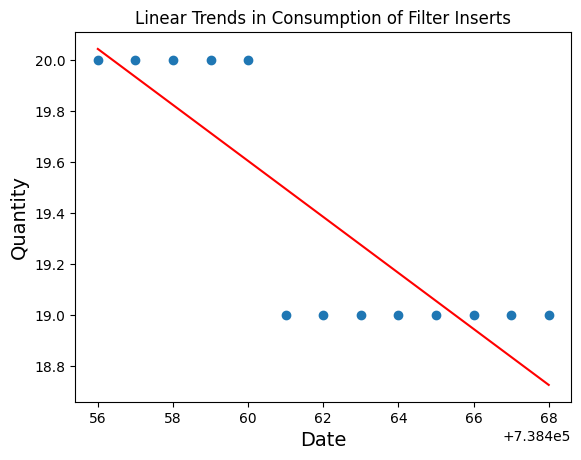


From:  2022-11-10 00:00:00 To:  2023-02-10 00:00:00
Slope:  -0.09551038022286269
R2 Score:  0.8880677150202897


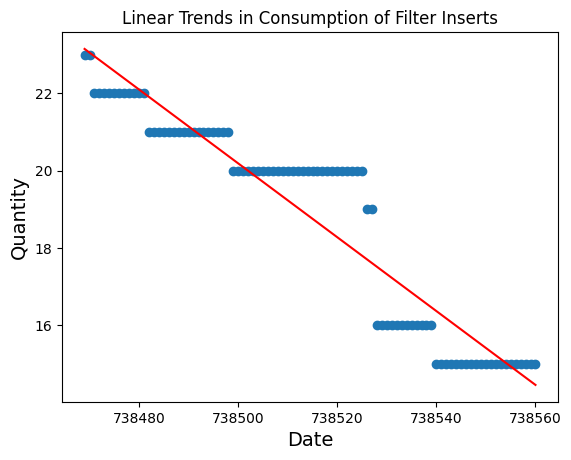


From:  2023-02-10 00:00:00 To:  2023-04-11 00:00:00
Slope:  -0.04887468741317033
R2 Score:  0.7817875886002335


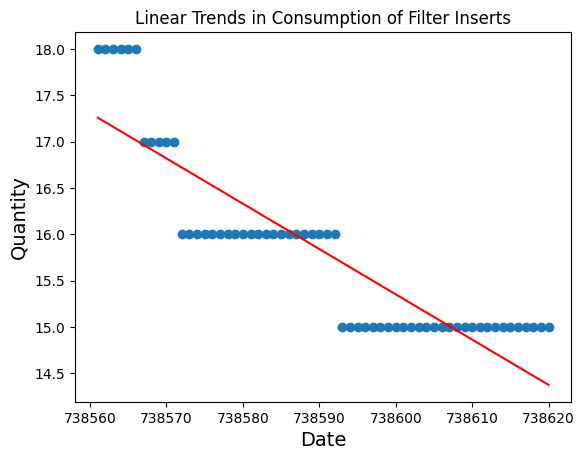


From:  2023-04-11 00:00:00 To:  2023-05-25 00:00:00
Slope:  -0.11592670894996476
R2 Score:  0.8088273755348494


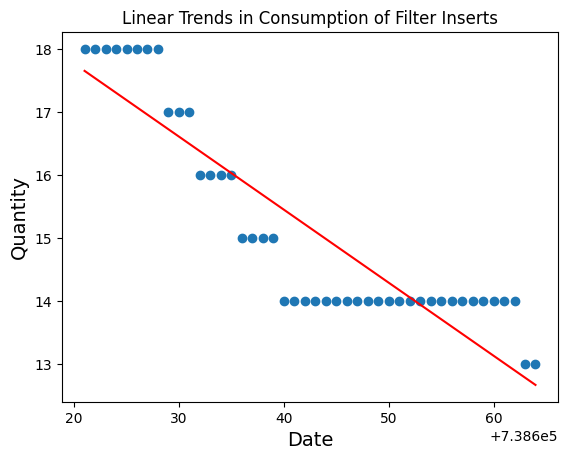


From:  2023-05-25 00:00:00 To:  2023-08-05 00:00:00
Slope:  -0.06370184577786352
R2 Score:  0.9046118744513958


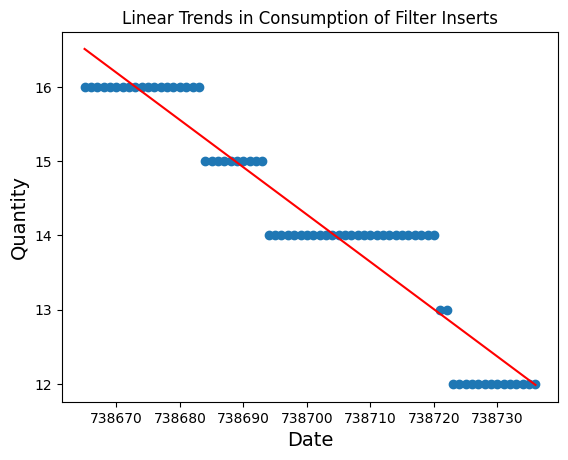


From:  2023-08-05 00:00:00 To:  2023-08-24 00:00:00
Slope:  -0.0982456140350877
R2 Score:  0.6373983739839884


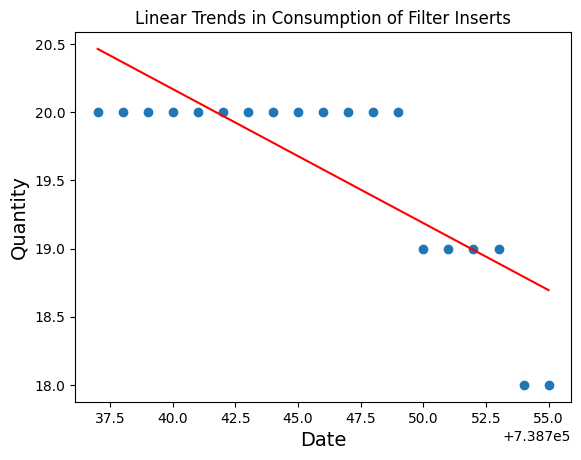

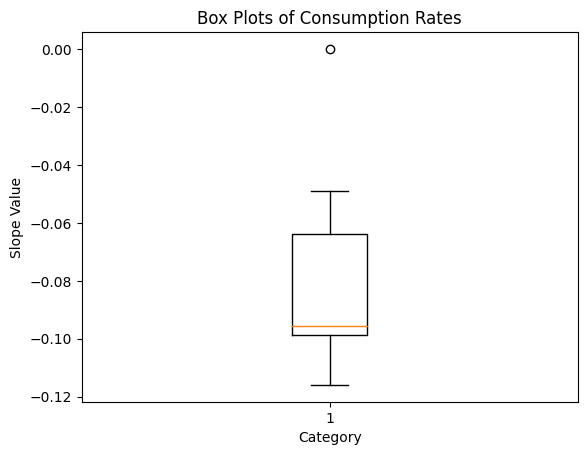

DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=540, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    294
2022-01-07    288
2022-01-08    288
2022-01-09    288
2022-01-10    

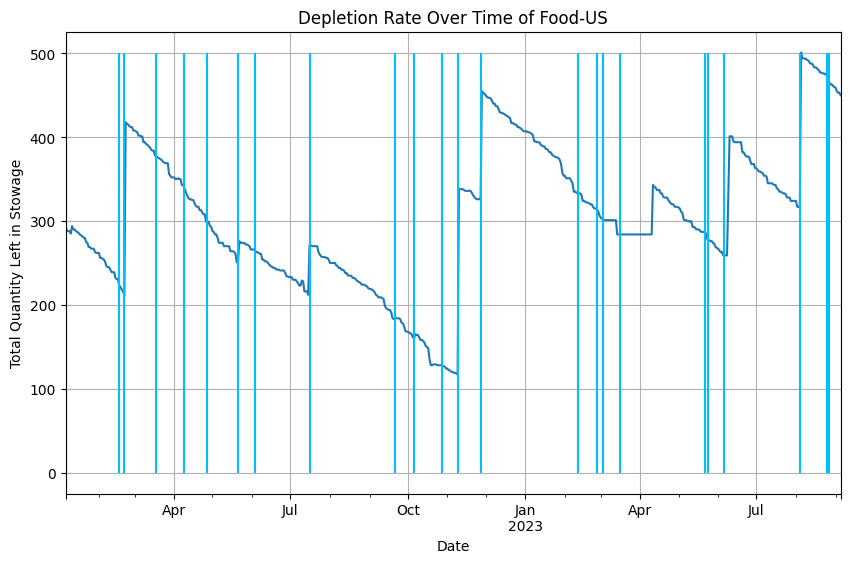

2022-01-11 00:00:00 9.0
2022-02-22 00:00:00 207.0
2022-05-22 00:00:00 26.0
2022-07-10 00:00:00 6.0
2022-07-16 00:00:00 59.0
2022-11-10 00:00:00 221.0
2022-11-28 00:00:00 129.0
2023-04-11 00:00:00 59.0
2023-06-09 00:00:00 71.0
2023-06-10 00:00:00 71.0
2023-08-05 00:00:00 185.0


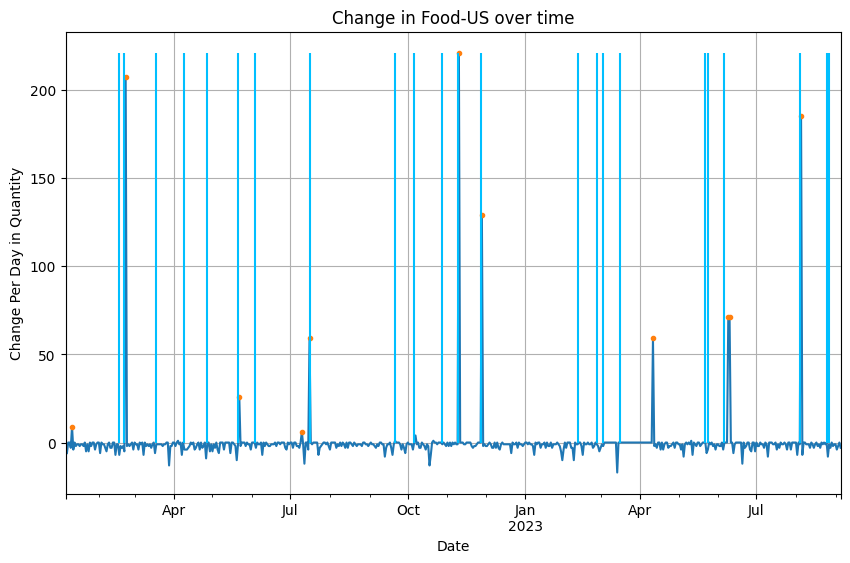

From:  2022-01-11 00:00:00 To:  2022-02-22 00:00:00
Slope:  -1.8756988898792641
R2 Score:  0.9834291488827107


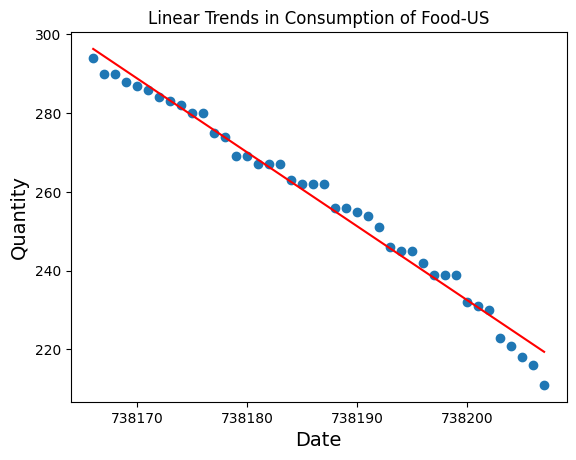


From:  2022-02-22 00:00:00 To:  2022-05-22 00:00:00
Slope:  -1.934763363976847
R2 Score:  0.9949119810331503


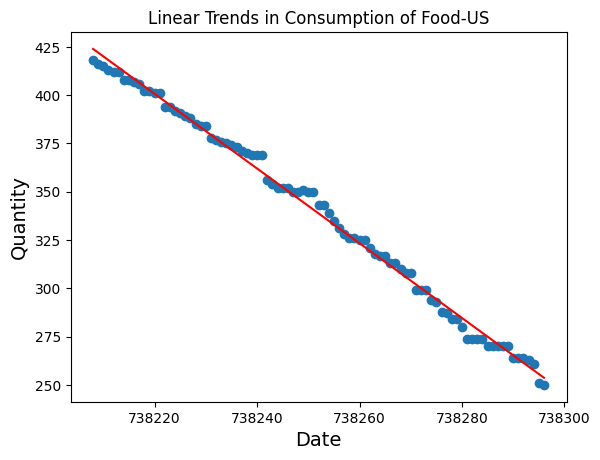


From:  2022-05-22 00:00:00 To:  2022-07-10 00:00:00
Slope:  -1.1205102040816326
R2 Score:  0.9876902441901443


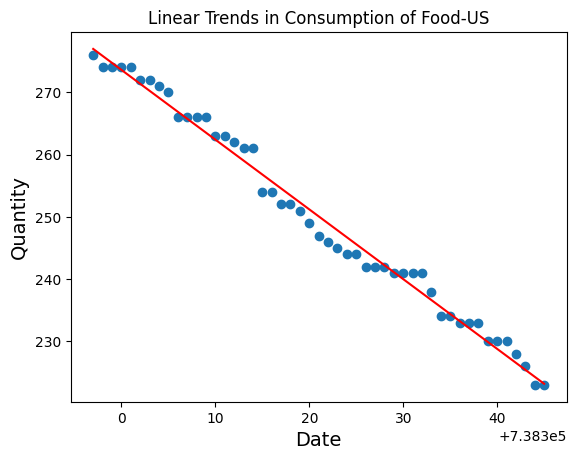


From:  2022-07-10 00:00:00 To:  2022-07-16 00:00:00
Slope:  -3.457142857142857
R2 Score:  0.8186189544261926


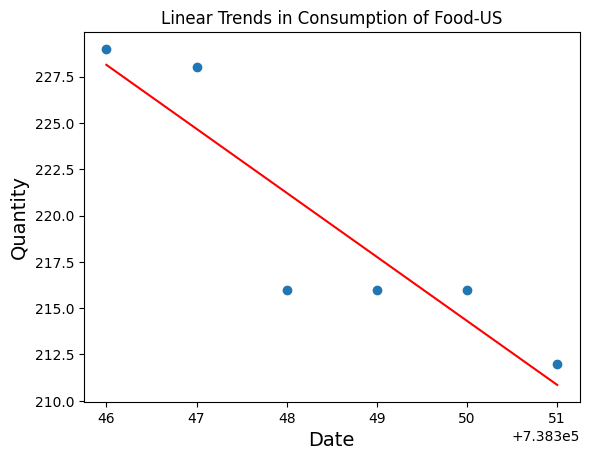


From:  2022-07-16 00:00:00 To:  2022-11-10 00:00:00
Slope:  -1.4172998246639394
R2 Score:  0.9880042835256658


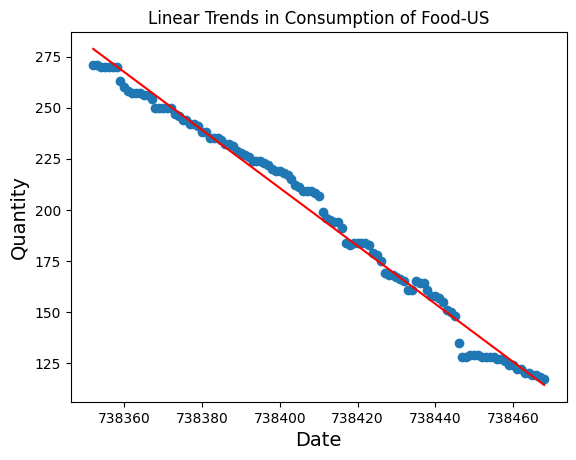


From:  2022-11-10 00:00:00 To:  2022-11-28 00:00:00
Slope:  -0.8689370485036116
R2 Score:  0.8836292208210013


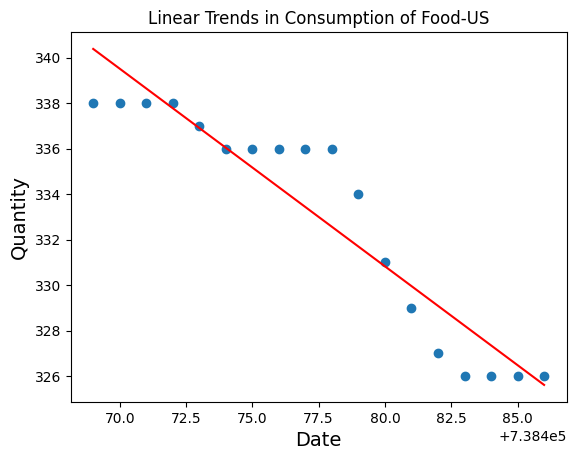


From:  2022-11-28 00:00:00 To:  2023-04-11 00:00:00
Slope:  -1.458649110338034
R2 Score:  0.9785692618928435


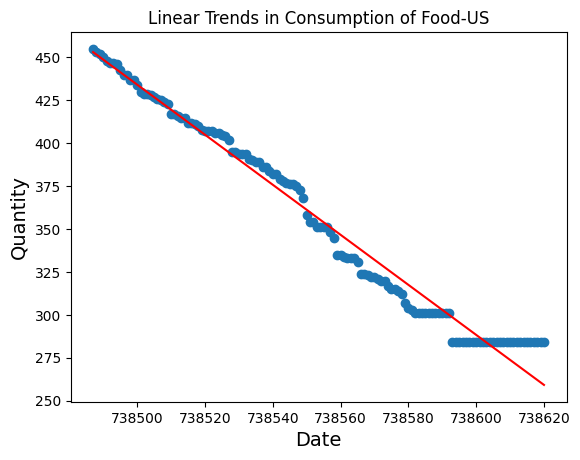


From:  2023-04-11 00:00:00 To:  2023-06-09 00:00:00
Slope:  -1.4780245470485096
R2 Score:  0.9943592714252322


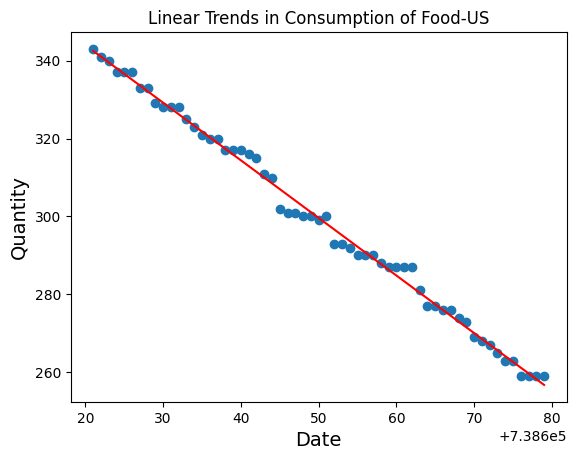


From:  2023-06-09 00:00:00 To:  2023-06-10 00:00:00
Slope:  0.0
R2 Score:  nan


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


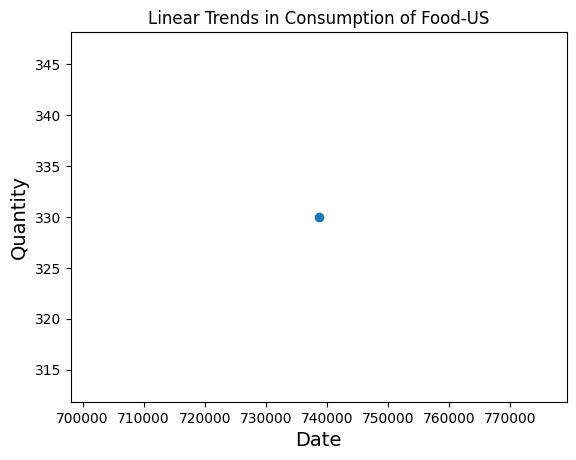


From:  2023-06-10 00:00:00 To:  2023-08-05 00:00:00
Slope:  -1.5783663704716335
R2 Score:  0.9839600608640602


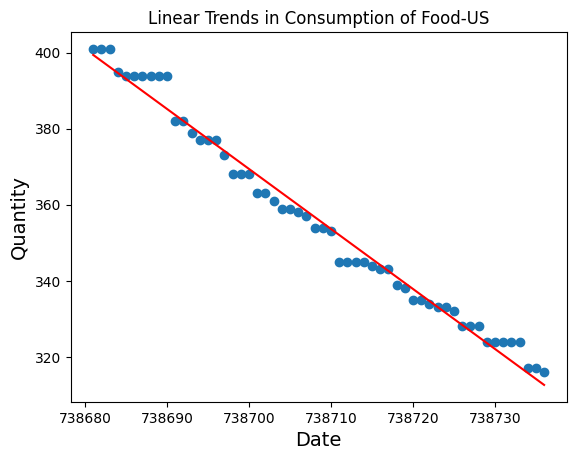

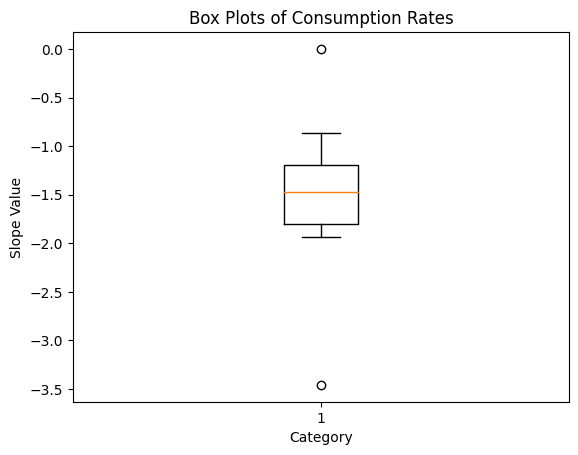

DatetimeIndex(['2022-10-19', '2022-10-20', '2022-10-21', '2022-10-22',
               '2022-10-23', '2022-10-24', '2022-10-25', '2022-10-26',
               '2022-10-27', '2022-10-28',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=267, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06     NaN
2022-01-07     NaN
2022-01-08     NaN
2022-01-09     NaN
2022-01-10

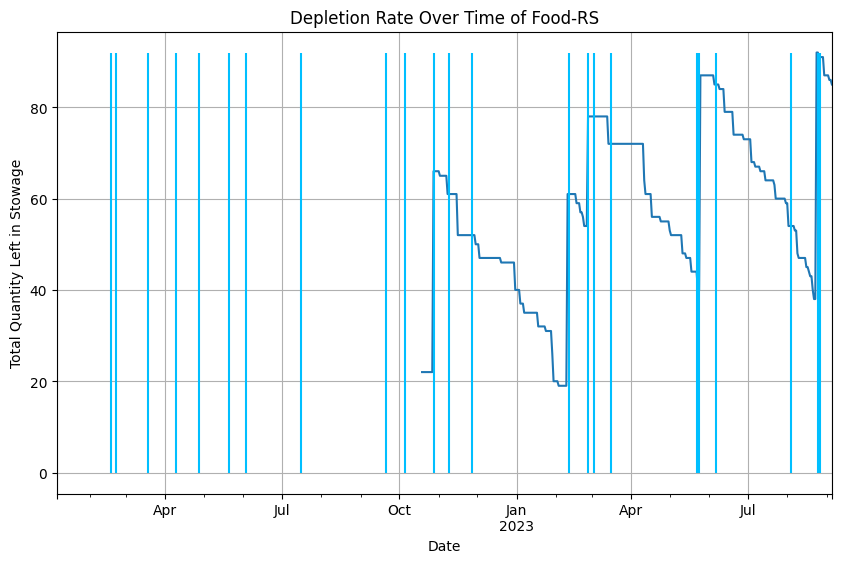

2022-10-28 00:00:00 44.0
2023-02-10 00:00:00 42.0
2023-02-26 00:00:00 24.0
2023-05-25 00:00:00 47.0
2023-08-24 00:00:00 54.0


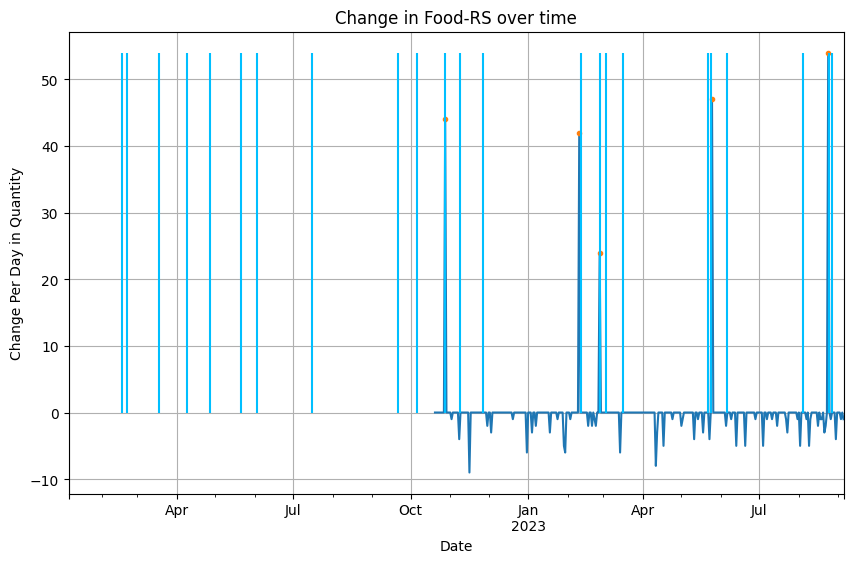

From:  2022-10-28 00:00:00 To:  2023-02-10 00:00:00
Slope:  -0.42528509226622435
R2 Score:  0.9486216043657503


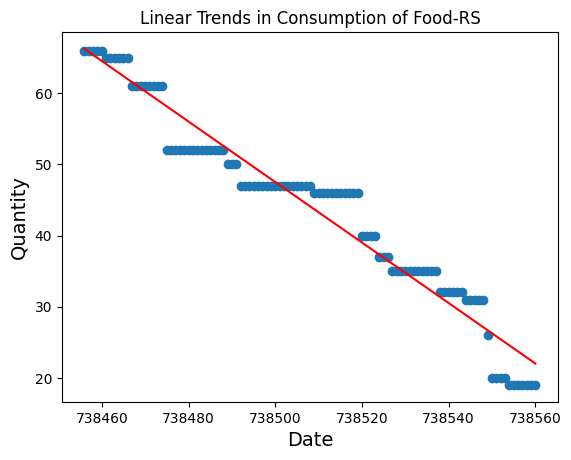


From:  2023-02-10 00:00:00 To:  2023-02-26 00:00:00
Slope:  -0.5470588235294115
R2 Score:  0.8771805273838099


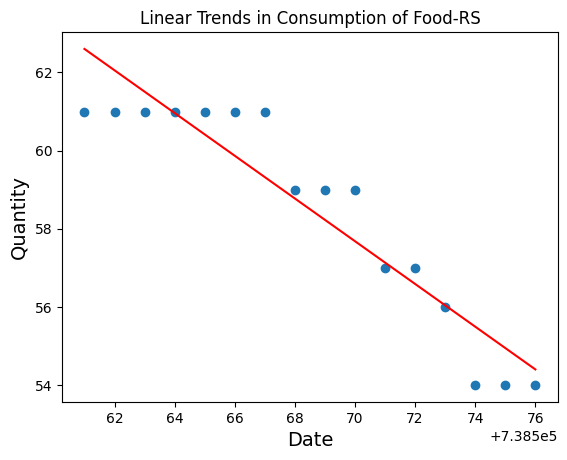


From:  2023-02-26 00:00:00 To:  2023-05-25 00:00:00
Slope:  -0.4527755274558838
R2 Score:  0.9367287539173753


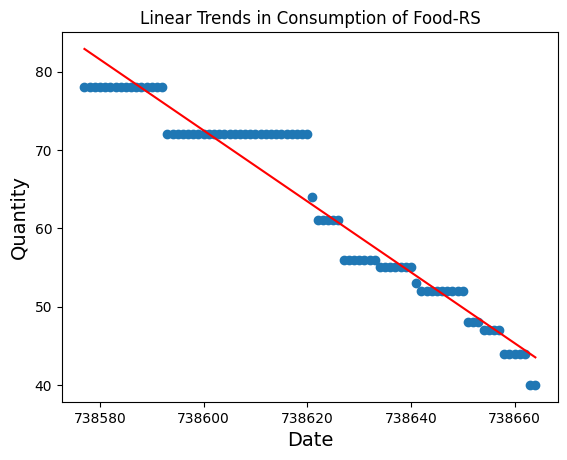


From:  2023-05-25 00:00:00 To:  2023-08-24 00:00:00
Slope:  -0.5316770186335404
R2 Score:  0.978926365411144


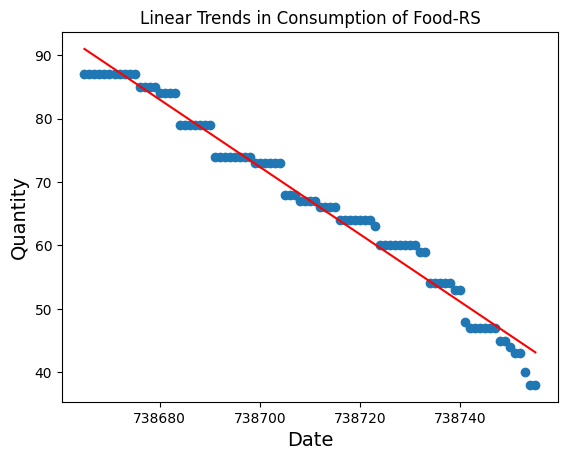

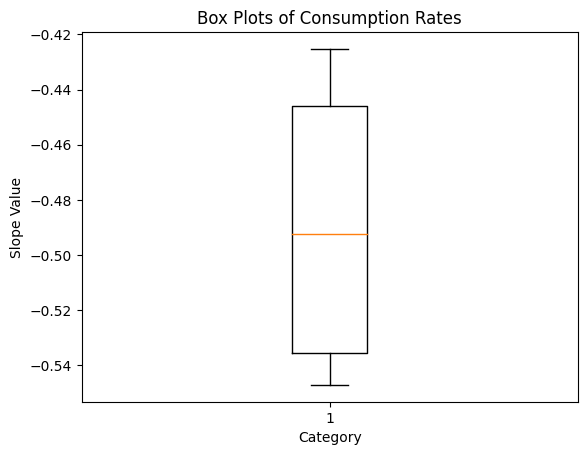

In [ ]:
# fig, axs = plt.subplots(3)

for catIdx in range(1,8):
  # catIdx = 6
  categoryDataFrame = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)]
  categoryDataFrame = categoryDataFrame.drop_duplicates(subset=['id','date'])
  categoryCount = categoryDataFrame.groupby('date').count()['status']
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

  for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = categoryCount.index.get_loc(targetDate)
    correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
    categoryCount[targetIdx] = correctedValue

  categoryCount.index = pd.to_datetime(categoryCount.index)

  print(categoryCount.index)
  dateRangeIdx = pd.date_range('2022/01/06', '2023/09/05')
  categoryCountExtended = categoryCount.reindex(dateRangeIdx, method='ffill')
  print(categoryCountExtended.index)

  print(categoryCountExtended)
  print(categoryCount['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/03/04'])

  categoryCountGapped = categoryCount
  categoryCountGapped.index = pd.to_datetime(categoryCount.index)
  categoryCountGapped = categoryCountGapped.reindex(dateRangeIdx, method='ffill')

  print(categoryCountGapped['2023/03/01':'2023/03/15'])

  print(categoryCount.values)

  maxIndices = argrelmax(categoryCountExtended.values)
  maxSeries = categoryCountExtended.iloc[maxIndices]
  minIndices = argrelmin(categoryCountExtended.values)
  minSeries = categoryCountExtended.iloc[minIndices]

  print('Here is the maxSeries data:')
  print(maxSeries)

  maxSeriesExtended = maxSeries.reindex_like(categoryCount)

  print('Here is the minSeries data:')
  print(minSeries)

  minSeriesExtended = minSeries.reindex_like(categoryCount)
  print(maxSeries.index)

  print(minSeries.index)

  print(categoryCount.index)

  # categoryCountExtended.plot(kind='line', figsize=(10, 6))
  categoryCountExtended.plot(kind = 'line', figsize=(10,6))
  plt.vlines(x=All_Docking_Happened.values, ymin=0, ymax=categoryCountExtended.max(), color='deepskyblue', label='Dock')
  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.title('Depletion Rate Over Time of ' + categoryName)
  plt.xlabel('Date')
  plt.ylabel('Total Quantity Left in Stowage')
  plt.grid(True)
  plt.show()

  diffCategoryCountExtended = categoryCountExtended.diff()

  # To get rid of the resupply spikes, uncomment the for loop below
  #for i in diffCategoryCountExtended.index:
    #diffCategoryCountExtended[i] = diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0

  '''
print( )
resupplyList = []
for i in diffCategoryCountExtended.index:
  if diffCategoryCountExtended[i] > 1:
    resupplyList.append(diffCategoryCountExtended[i])
  '''
  resupplyList = argrelextrema(diffCategoryCountExtended.values, np.greater_equal)[0];

  significant_resupplyList = [i for i in resupplyList if diffCategoryCountExtended[i] > significantSpikeValues[catIdx-1]]
  resupplySeries = diffCategoryCountExtended.iloc[significant_resupplyList]

  for idx in resupplySeries.index:
    print(idx, resupplySeries[idx])

  diffCategoryCountExtended.plot(kind='line', figsize=(10, 6))
  try:
    resupplySeries.plot(style='.')
  except ValueError:
    pass

  plt.vlines(x=All_Docking_Happened.values, ymin=0, ymax=diffCategoryCountExtended.max(), color='deepskyblue', label='Dock')

  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.title('Change in ' + categoryName + ' over time')
  plt.xlabel('Date')
  plt.ylabel('Change Per Day in Quantity')
  plt.grid(True)
  plt.show()

  resupplySeriesIdx = resupplySeries.index

  AllSlopeLists = []

  i = 0
  slopeList = []
  while i < resupplySeriesIdx.size - 1:
    firstDay = resupplySeriesIdx[i].to_pydatetime()
    secondDay = resupplySeriesIdx[i+1].to_pydatetime()

    print("From: ", firstDay, "To: ", secondDay)

    sliceCat = categoryCountExtended[firstDay : secondDay]

    #print(type(sliceCat6))
    #print(sliceCat6)


    #sliceCat6.plot(style = '.', figsize=(10, 6))
    #plt.show()

    X = []
    for idx in sliceCat.index:
      #print(idx)
      #print(idx.toordinal())
      # X.append(sliceCat6['index'][i].toordinal())
      X.append(idx.toordinal())

    X = np.reshape(X, (-1,1))
    X = X[:-1]

    y = sliceCat.values

    y = list(sliceCat.values)
    y = np.reshape(y, (-1,1))
    y = y[:-1]

    myModel = LinearRegression()

    myModel.fit(X,y)
    yPredicted = myModel.predict(X)

    # X = X.fromordinal

    plt.scatter(X,y)
    plt.plot(X,yPredicted, color= 'red')

    plt.title('Linear Trends in Consumption of ' + categoryName)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Quantity', fontsize=14)
    slope = myModel.coef_


    print('Slope: ', slope[0][0])

    print('R2 Score: ', r2_score(y,yPredicted))

    slopeList.append(slope[0][0])

    plt.show()

    i+=1
    print()
  # R2Array = np.array(R2List)

  plt.title('Box Plots of Consumption Rates')
  plt.ylabel('Slope Value')
  plt.xlabel('Category')
  plt.boxplot(np.array(slopeList))
  plt.show()
  # AllSlopeLists.append(slopeList)



# AllR2Df = pd.DataFrame(AllR2Lists, columns = [i for i in range(1,8)])


# Linear Regression

In this section, we attempted to run through some linear regression testing for the Food-RS category. The average quantities consumed were 0.485 per day. Assuming two Russian Crew were aboard, this is a

From:  2022-10-28 00:00:00 To:  2023-02-10 00:00:00
Slope:  -0.42528509226622435
R2 Score:  0.9486216043657503


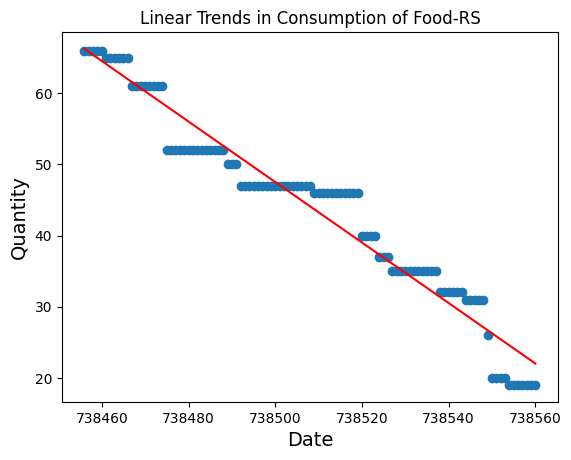


From:  2023-02-10 00:00:00 To:  2023-02-26 00:00:00
Slope:  -0.5470588235294115
R2 Score:  0.8771805273838099


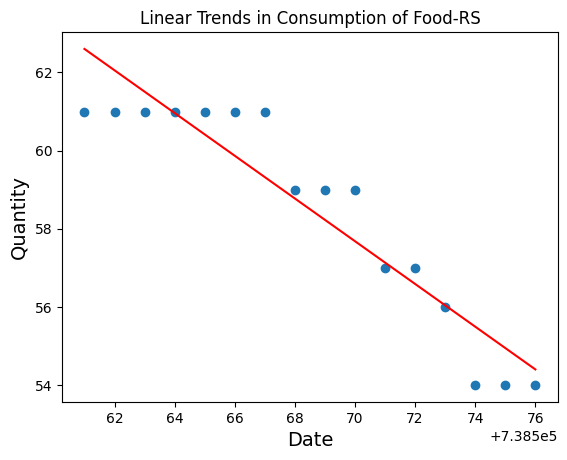


From:  2023-02-26 00:00:00 To:  2023-05-25 00:00:00
Slope:  -0.4527755274558838
R2 Score:  0.9367287539173753


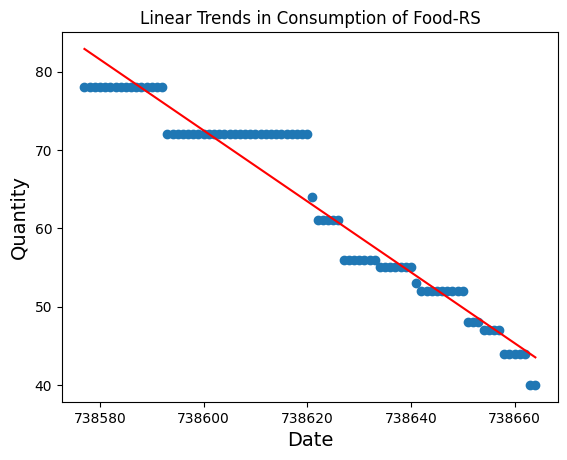


From:  2023-05-25 00:00:00 To:  2023-08-24 00:00:00
Slope:  -0.5316770186335404
R2 Score:  0.978926365411144


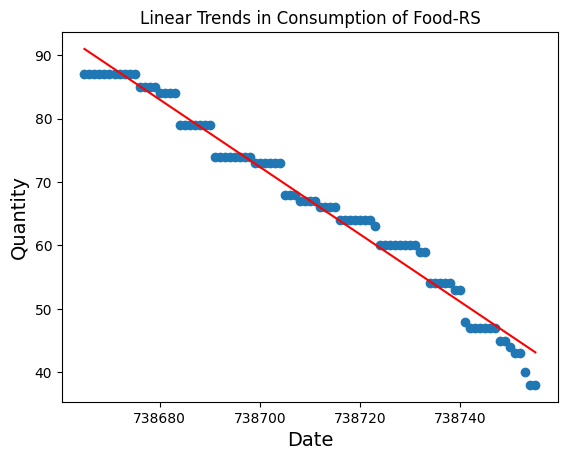

In [ ]:
# resupplySeriesIdx.size

i = 0
while i < resupplySeriesIdx.size - 1:
  firstDay = resupplySeriesIdx[i].to_pydatetime()
  secondDay = resupplySeriesIdx[i+1].to_pydatetime()

  print("From: ", firstDay, "To: ", secondDay)

  sliceCat6 = categoryCountExtended[firstDay : secondDay]

  #print(type(sliceCat6))
  #print(sliceCat6)


  #sliceCat6.plot(style = '.', figsize=(10, 6))
  #plt.show()

  X = []
  for idx in sliceCat6.index:
    #print(idx)
    #print(idx.toordinal())
    # X.append(sliceCat6['index'][i].toordinal())
    X.append(idx.toordinal())

  X = np.reshape(X, (-1,1))
  X = X[:-1]

  y = sliceCat6.values

  y = list(sliceCat6.values)
  y = np.reshape(y, (-1,1))
  y = y[:-1]

  myModel = LinearRegression()

  myModel.fit(X,y)
  yPredicted = myModel.predict(X)

  # X = X.fromordinal

  plt.scatter(X,y)
  plt.plot(X,yPredicted, color= 'red')

  plt.title('Linear Trends in Consumption of Food-RS')
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Quantity', fontsize=14)
  slope = myModel.coef_
  print('Slope: ', slope[0][0])

  print('R2 Score: ', r2_score(y,yPredicted))

  plt.show()

  i+=1
  print()

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    31
2022-01-07    31
2022-01-08    31
2022-01-09    31
2022-01-10    31
 

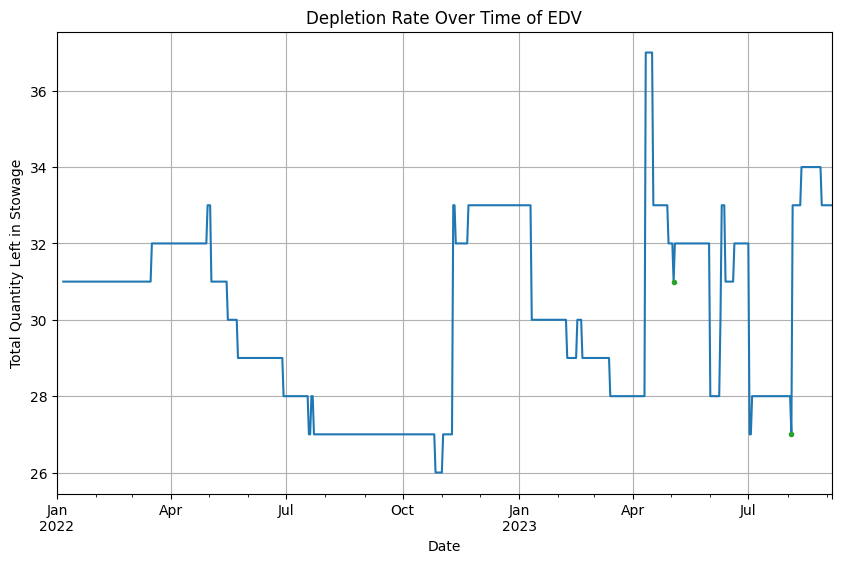

2022-11-10 00:00:00 6.0
2023-04-11 00:00:00 9.0
2023-08-05 00:00:00 6.0


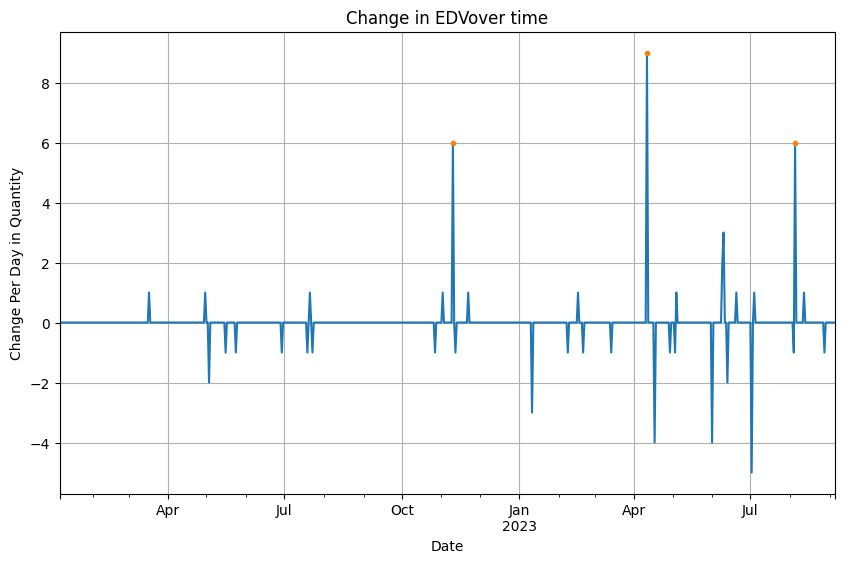

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    14
2022-01-07    14
2022-01-08    14
2022-01-09    14
2022-01-10    14
 

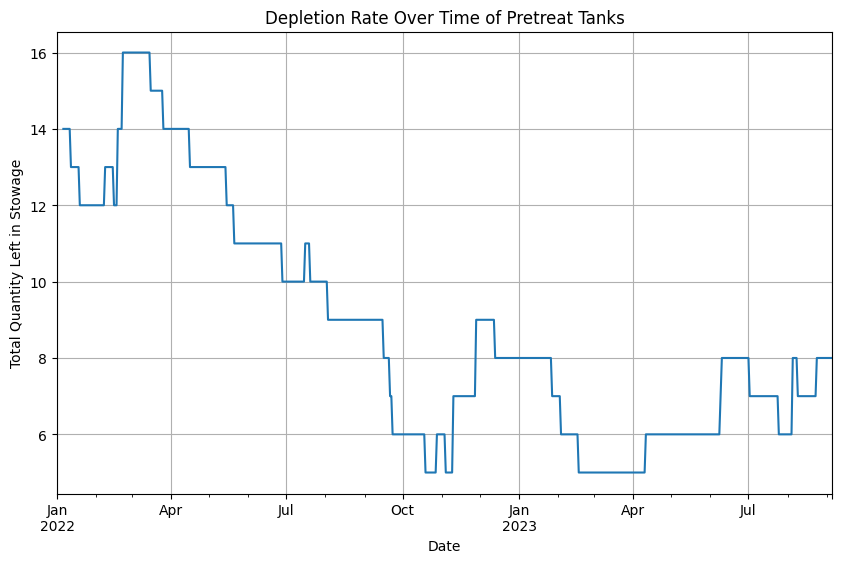

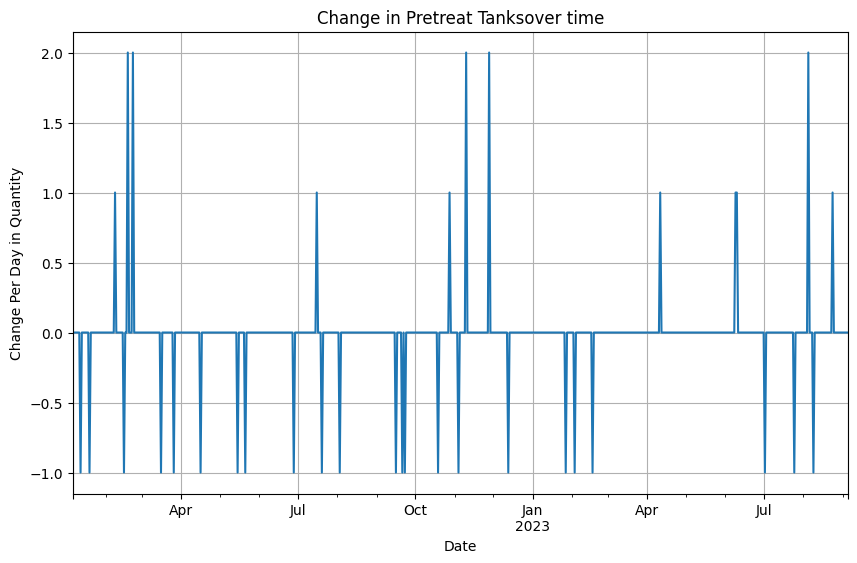

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    121
2022-01-07    121
2022-01-08    119
2022-01-09    118
2022-01-10    

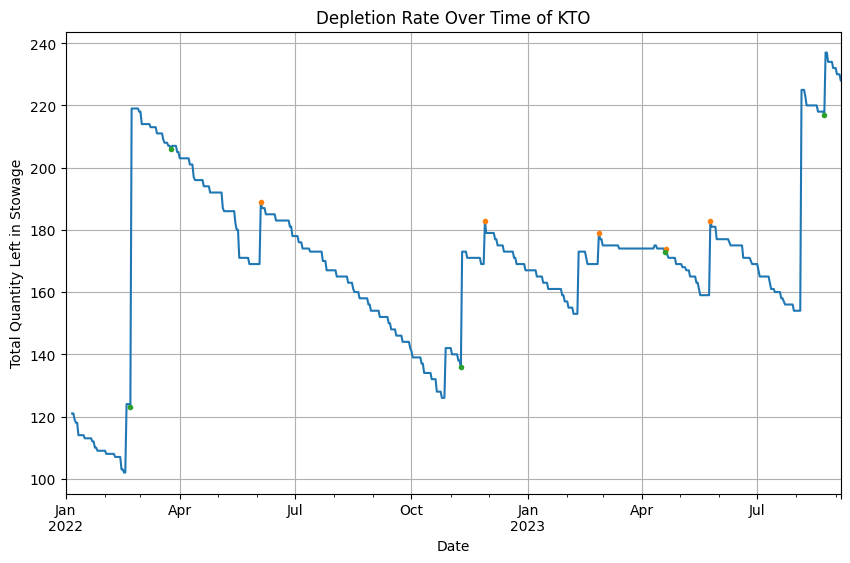

2022-02-18 00:00:00 22.0
2022-02-22 00:00:00 96.0
2022-06-04 00:00:00 20.0
2022-10-28 00:00:00 16.0
2022-11-10 00:00:00 37.0
2022-11-28 00:00:00 14.0
2023-02-10 00:00:00 20.0
2023-02-26 00:00:00 10.0
2023-05-25 00:00:00 24.0
2023-08-05 00:00:00 71.0
2023-08-24 00:00:00 20.0


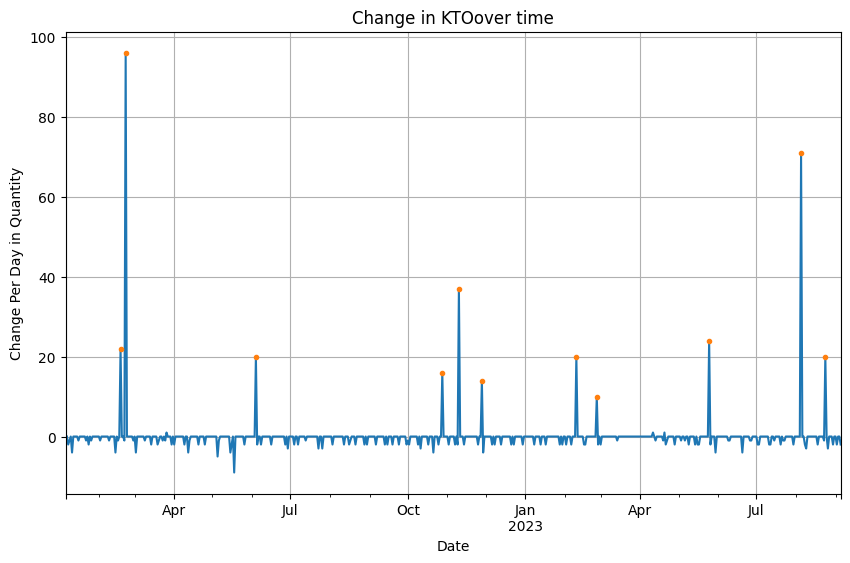

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    82
2022-01-07    82
2022-01-08    82
2022-01-09    82
2022-01-10    82
 

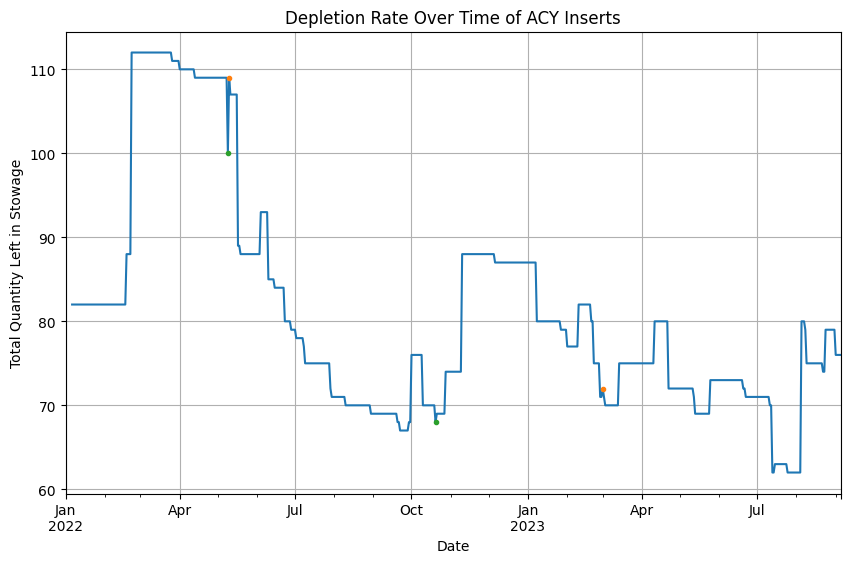

2022-02-18 00:00:00 6.0
2022-02-22 00:00:00 24.0
2022-05-10 00:00:00 9.0
2022-10-01 00:00:00 8.0
2022-11-10 00:00:00 14.0
2023-08-05 00:00:00 18.0


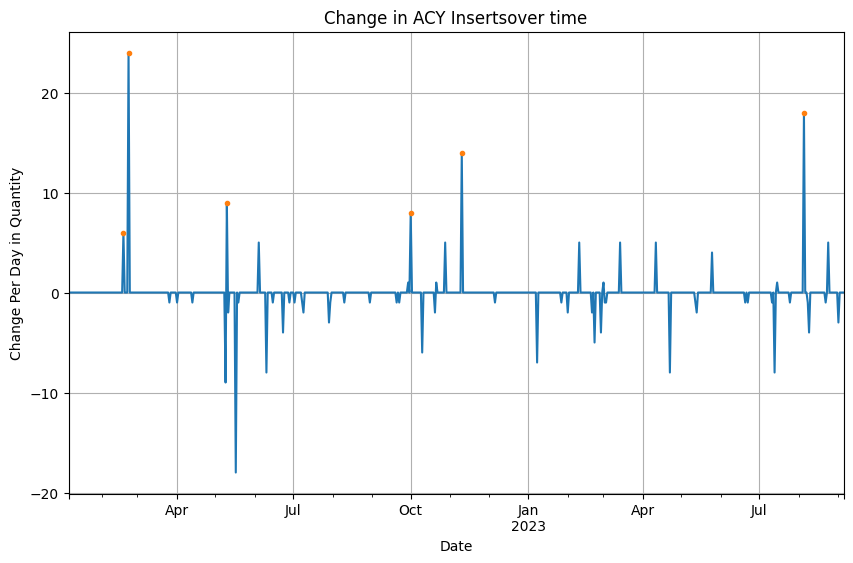

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    29
2022-01-07    29
2022-01-08    29
2022-01-09    29
2022-01-10    29
 

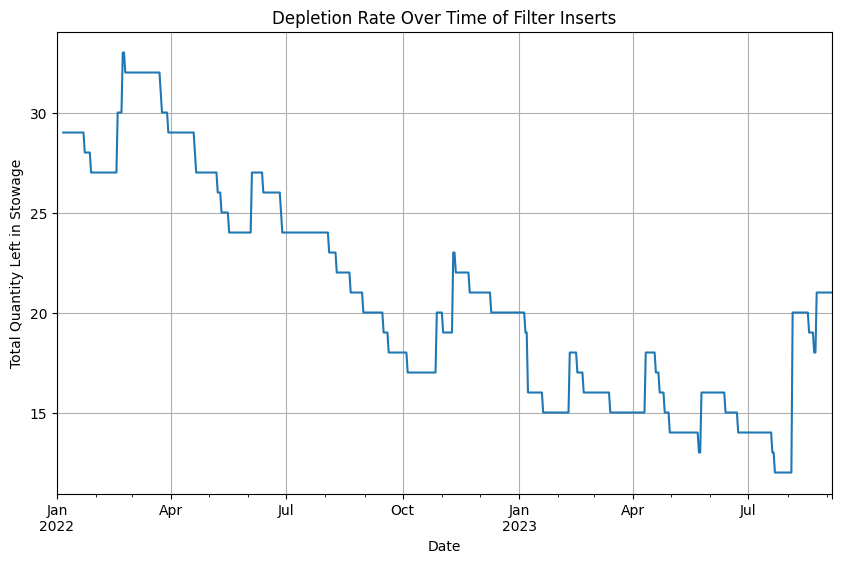

2023-08-05 00:00:00 8.0


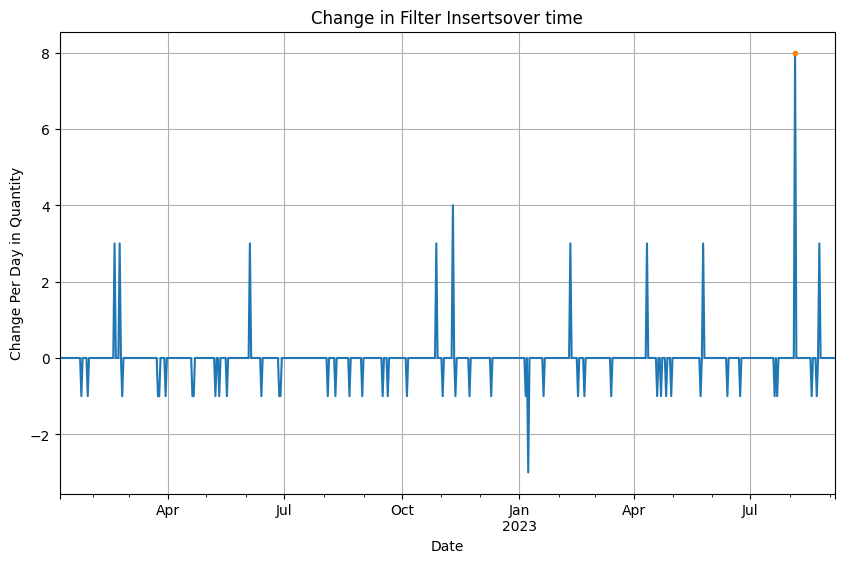

DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=540, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    294
2022-01-07    288
2022-01-08    288
2022-01-09    288
2022-01-10    

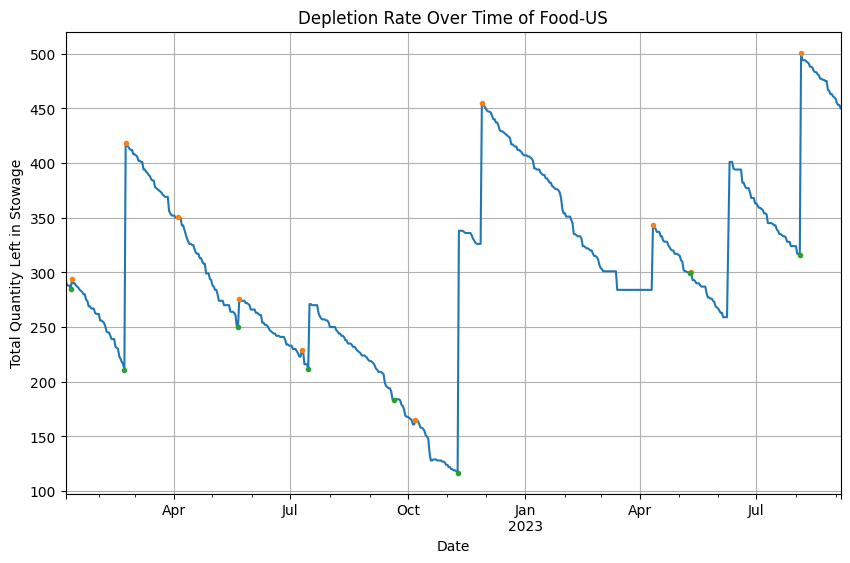

2022-01-11 00:00:00 9.0
2022-02-22 00:00:00 207.0
2022-05-22 00:00:00 26.0
2022-07-10 00:00:00 6.0
2022-07-16 00:00:00 59.0
2022-11-10 00:00:00 221.0
2022-11-28 00:00:00 129.0
2023-04-11 00:00:00 59.0
2023-06-09 00:00:00 71.0
2023-06-10 00:00:00 71.0
2023-08-05 00:00:00 185.0


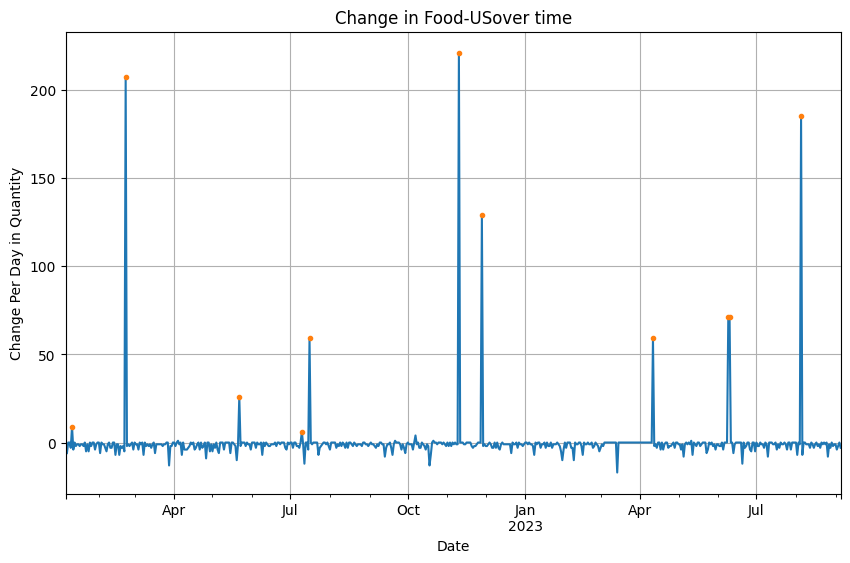

DatetimeIndex(['2022-10-19', '2022-10-20', '2022-10-21', '2022-10-22',
               '2022-10-23', '2022-10-24', '2022-10-25', '2022-10-26',
               '2022-10-27', '2022-10-28',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=267, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06     NaN
2022-01-07     NaN
2022-01-08     NaN
2022-01-09     NaN
2022-01-10

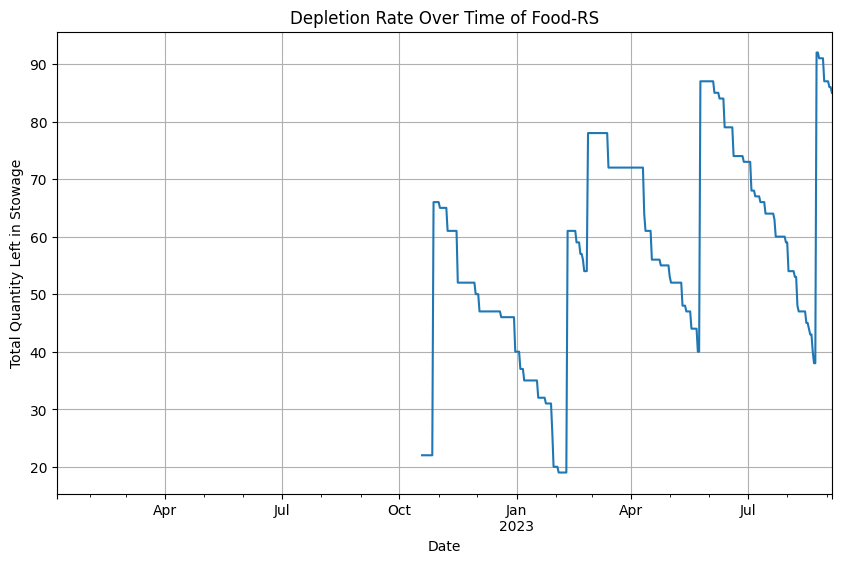

2022-10-28 00:00:00 44.0
2023-02-10 00:00:00 42.0
2023-02-26 00:00:00 24.0
2023-05-25 00:00:00 47.0
2023-08-24 00:00:00 54.0


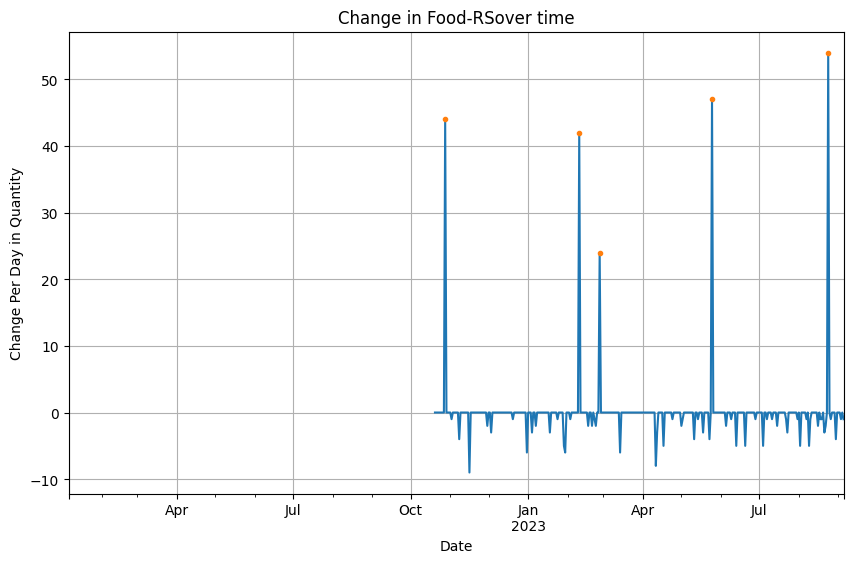

In [ ]:
for catIdx in range(1,8):
  categoryDataFrame = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)]
  categoryDataFrame = categoryDataFrame.drop_duplicates(subset=['id','date'])
  categoryCount = categoryDataFrame.groupby('date').count()['status']
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

  for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = categoryCount.index.get_loc(targetDate)
    correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
    categoryCount[targetIdx] = correctedValue

  categoryCount.index = pd.to_datetime(categoryCount.index)

  print(categoryCount.index)
  dateRangeIdx = pd.date_range('2022/01/06', '2023/09/05')
  categoryCountExtended = categoryCount.reindex(dateRangeIdx, method='ffill')
  print(categoryCountExtended.index)

  print(categoryCountExtended)
  print(categoryCount['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/03/04'])

  categoryCountGapped = categoryCount
  categoryCountGapped.index = pd.to_datetime(categoryCount.index)
  categoryCountGapped = categoryCountGapped.reindex(dateRangeIdx, method='ffill')

  print(categoryCountGapped['2023/03/01':'2023/03/15'])

  print(categoryCount.values)

  maxIndices = argrelmax(categoryCountExtended.values)
  maxSeries = categoryCountExtended.iloc[maxIndices]
  minIndices = argrelmin(categoryCountExtended.values)
  minSeries = categoryCountExtended.iloc[minIndices]

  print('Here is the maxSeries data:')
  print(maxSeries)

  maxSeriesExtended = maxSeries.reindex_like(categoryCount)

  print('Here is the minSeries data:')
  print(minSeries)

  minSeriesExtended = minSeries.reindex_like(categoryCount)
  print(maxSeries.index)

  print(minSeries.index)

  print(categoryCount.index)

  categoryCountExtended.plot(kind='line', figsize=(10, 6))
  maxSeriesExtended.plot(style='.')
  minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.title('Depletion Rate Over Time of ' + categoryName)
  plt.xlabel('Date')
  plt.ylabel('Total Quantity Left in Stowage')
  plt.grid(True)
  plt.show()

  diffCategoryCountExtended = categoryCountExtended.diff()

  # To get rid of the resupply spikes, uncomment the for loop below
  #for i in diffCategoryCountExtended.index:
    #diffCategoryCountExtended[i] = diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0

  '''
  print()
  resupplyList = []
  for i in diffCategoryCountExtended.index:
    if diffCategoryCountExtended[i] > 1:
      resupplyList.append(diffCategoryCountExtended[i])
  '''
  resupplyList = argrelextrema(diffCategoryCountExtended.values, np.greater_equal)[0];

  significant_resupplyList = [i for i in resupplyList if diffCategoryCountExtended[i] > 5]
  resupplySeries = diffCategoryCountExtended.iloc[significant_resupplyList]

  for idx in resupplySeries.index:
    print(idx, resupplySeries[idx])

  diffCategoryCountExtended.plot(kind='line', figsize=(10, 6))
  try:
    resupplySeries.plot(style='.')
  except ValueError:
    pass

  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.title('Change in ' + categoryName + 'over time')
  plt.xlabel('Date')
  plt.ylabel('Change Per Day in Quantity')
  plt.grid(True)
  plt.show()

Graphs of all categories' stowage counts over the given time frame, as well as the incremental changes in quantity over time. Positive spikes indicate resupplies, while negative spikes indicate consumption of units.

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    31
2022-01-07    31
2022-01-08    31
2022-01-09    31
2022-01-10    31
 

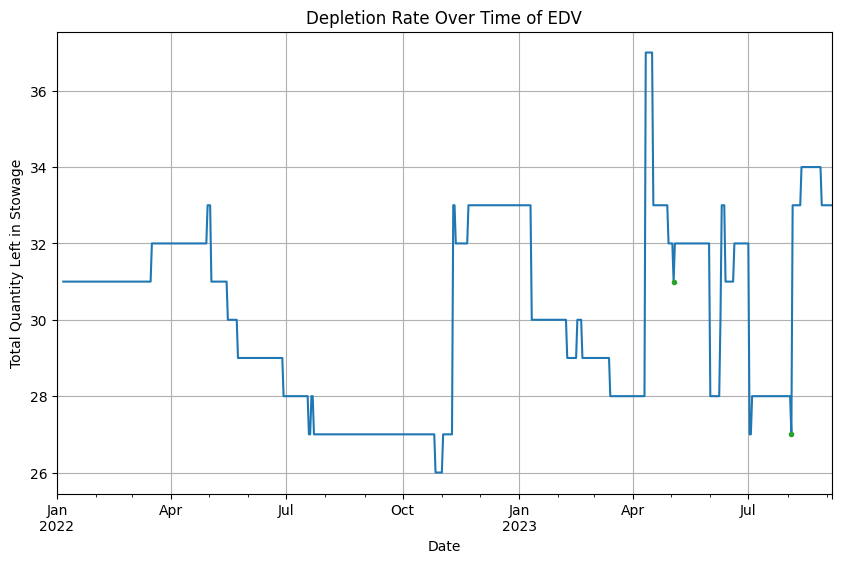

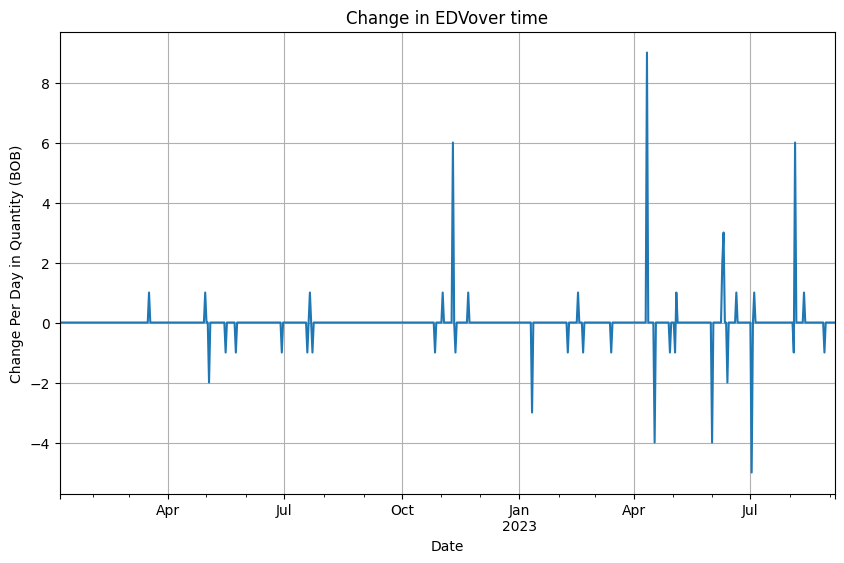

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    14
2022-01-07    14
2022-01-08    14
2022-01-09    14
2022-01-10    14
 

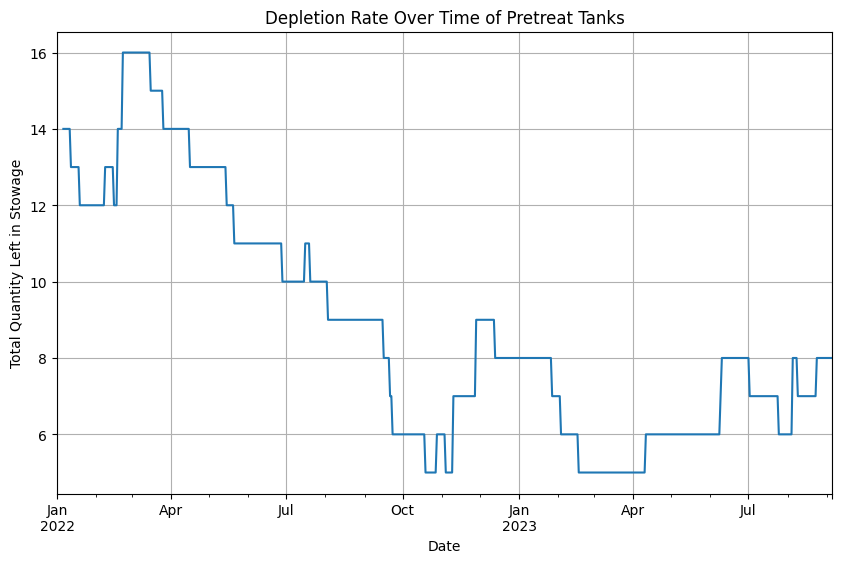

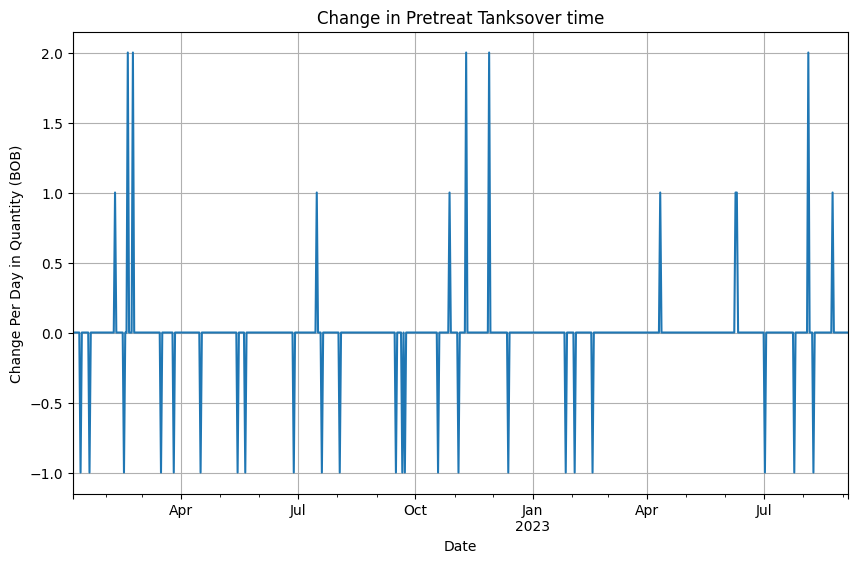

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    121
2022-01-07    121
2022-01-08    119
2022-01-09    118
2022-01-10    

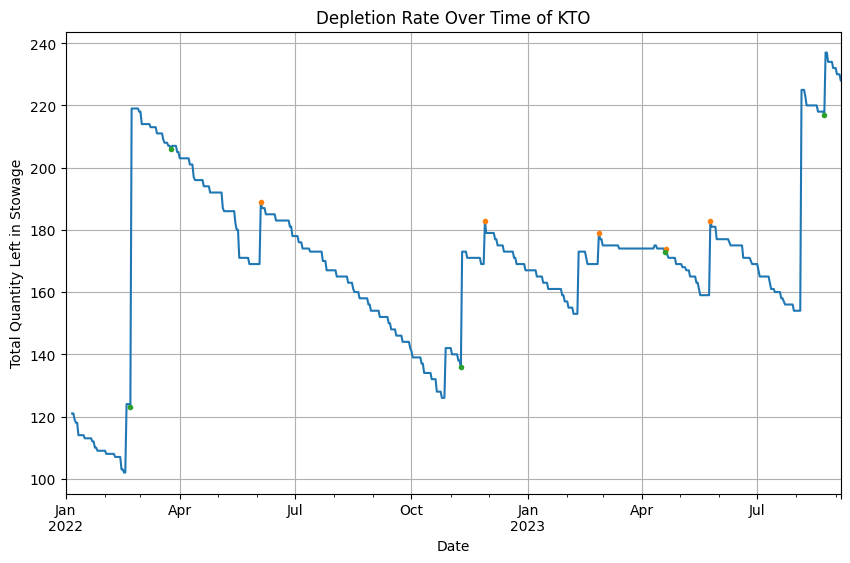

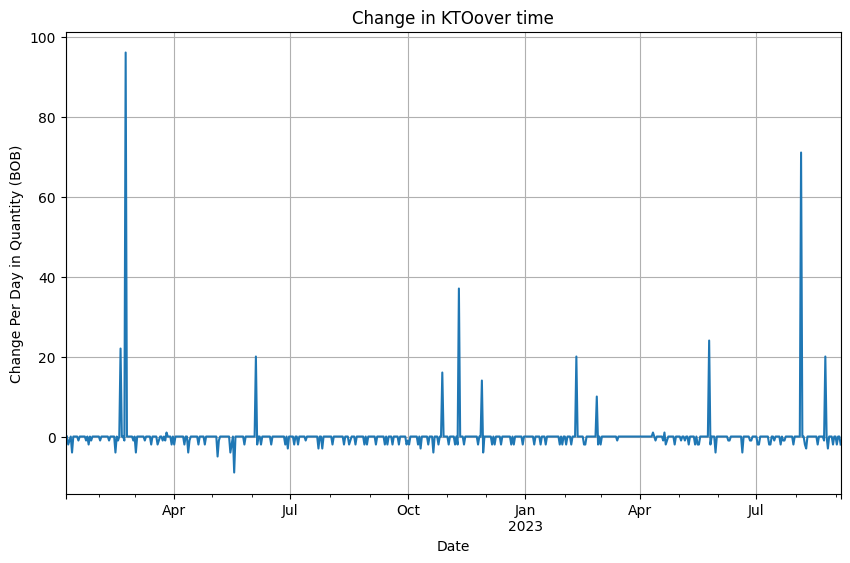

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    82
2022-01-07    82
2022-01-08    82
2022-01-09    82
2022-01-10    82
 

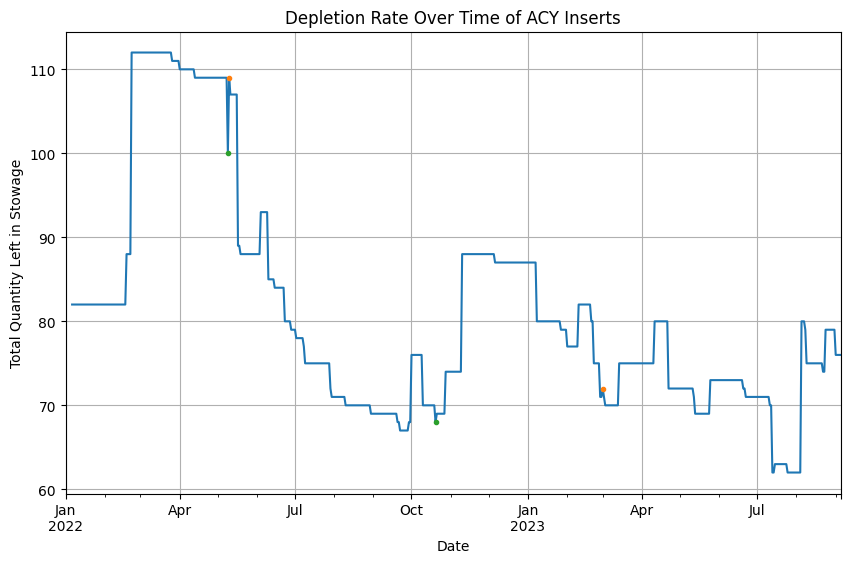

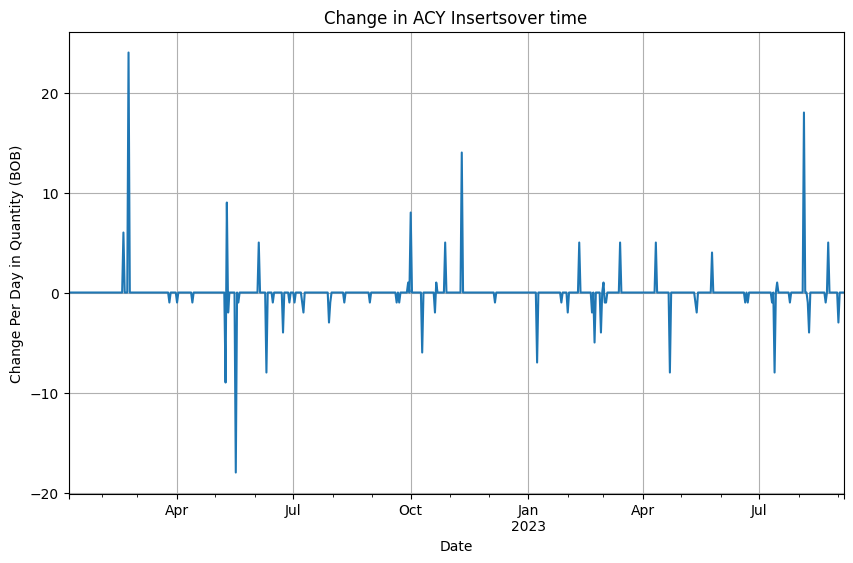

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-05',
               '2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=544, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    29
2022-01-07    29
2022-01-08    29
2022-01-09    29
2022-01-10    29
 

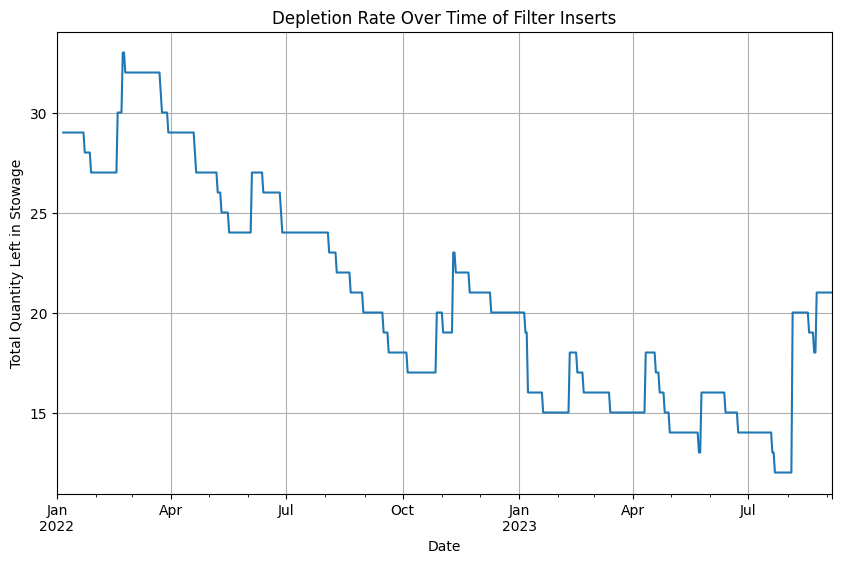

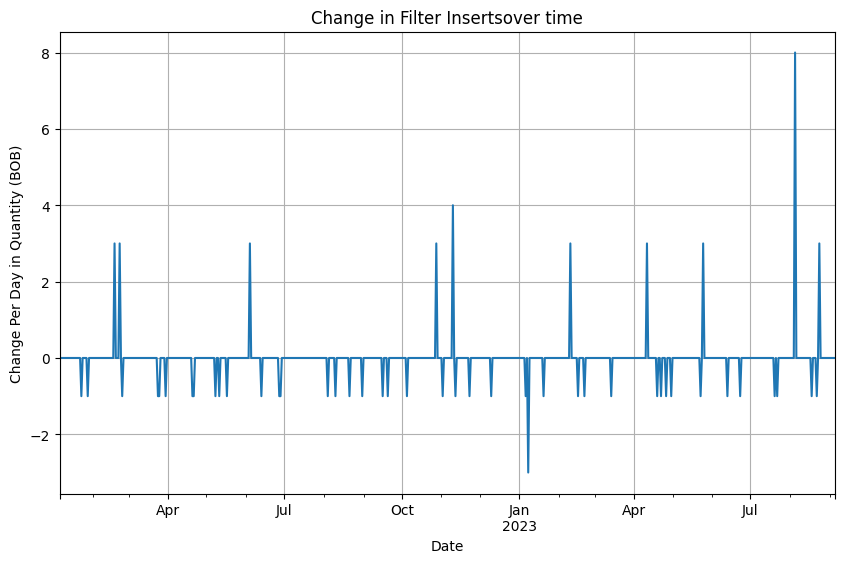

DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=540, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    294
2022-01-07    288
2022-01-08    288
2022-01-09    288
2022-01-10    

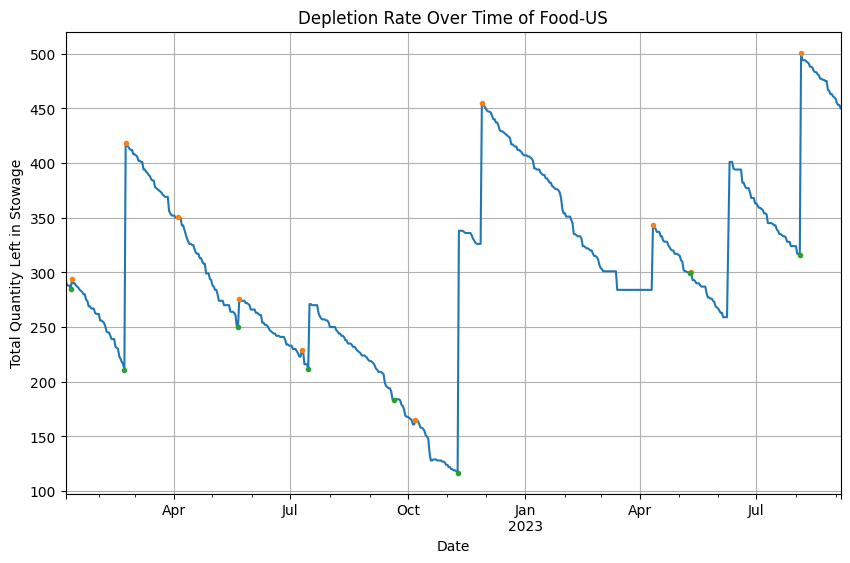

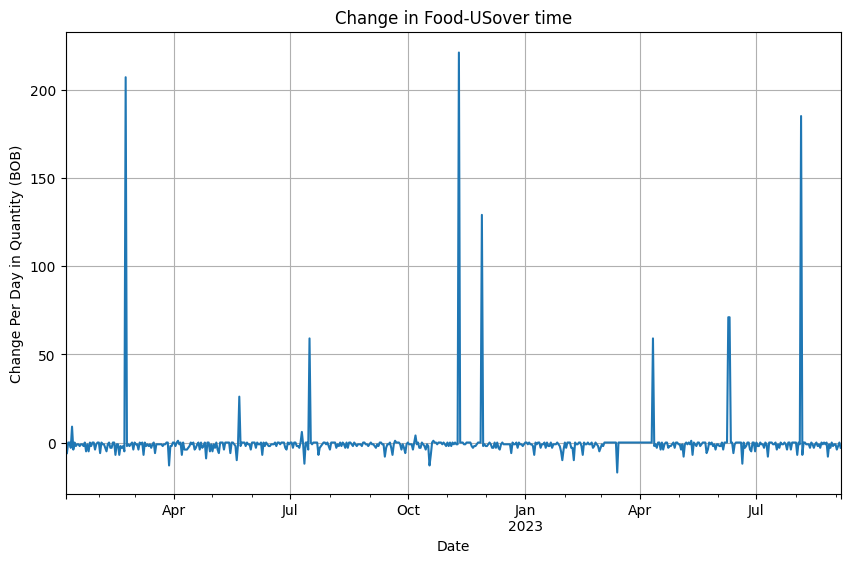

DatetimeIndex(['2022-10-19', '2022-10-20', '2022-10-21', '2022-10-22',
               '2022-10-23', '2022-10-24', '2022-10-25', '2022-10-26',
               '2022-10-27', '2022-10-28',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=267, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06     NaN
2022-01-07     NaN
2022-01-08     NaN
2022-01-09     NaN
2022-01-10

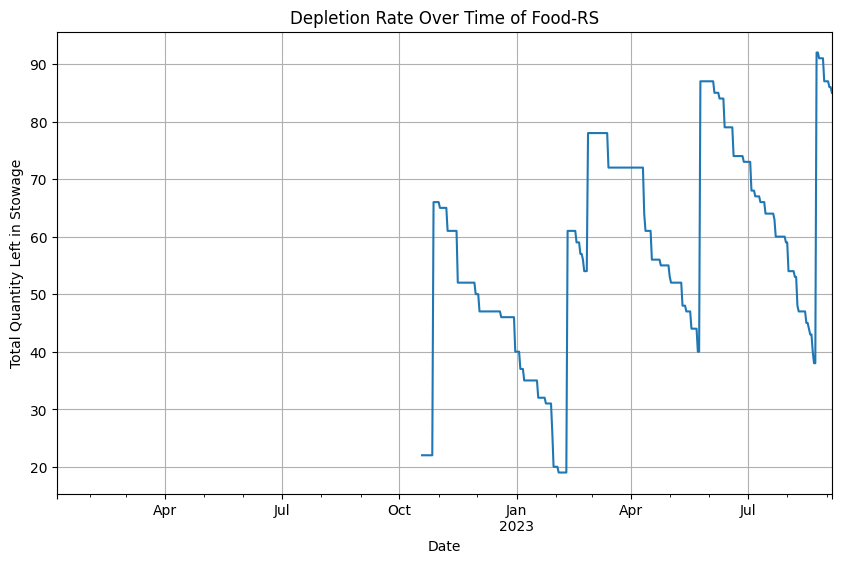

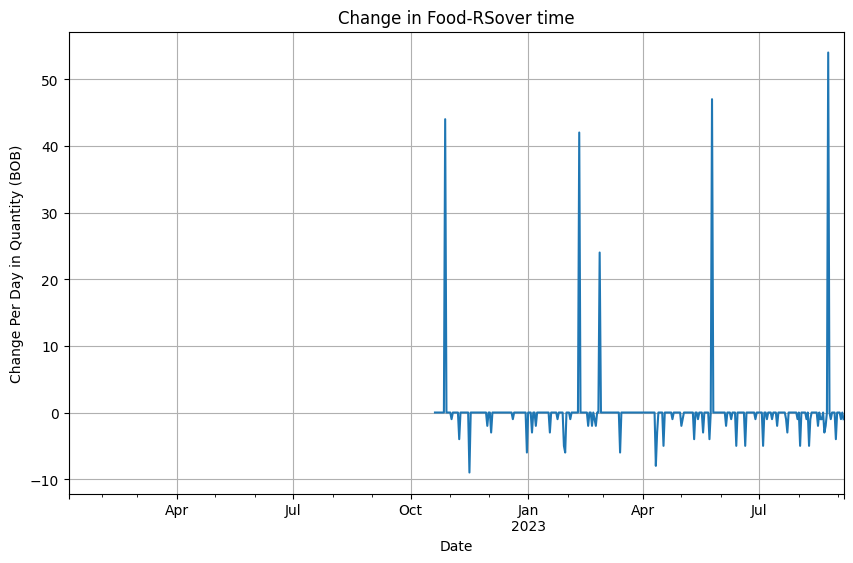

In [ ]:
for catIdx in range(1,8):
  categoryCount = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)].groupby('date').count()['status']
  categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

  for targetDate in ['2023/05/01','2023/06/09']:
    targetIdx = categoryCount.index.get_loc(targetDate)
    correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
    categoryCount[targetIdx] = correctedValue

  categoryCount.index = pd.to_datetime(categoryCount.index)

  print(categoryCount.index)
  dateRangeIdx = pd.date_range('2022/01/06', '2023/09/05')
  categoryCountExtended = categoryCount.reindex(dateRangeIdx, method='ffill')
  print(categoryCountExtended.index)

  print(categoryCountExtended)
  print(categoryCount['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/02/26':'2023/03/15'])
  print(categoryCountExtended['2023/03/04'])

  categoryCountGapped = categoryCount
  categoryCountGapped.index = pd.to_datetime(categoryCount.index)
  categoryCountGapped = categoryCountGapped.reindex(dateRangeIdx, method='ffill')

  print(categoryCountGapped['2023/03/01':'2023/03/15'])

  print(categoryCount.values)

  maxIndices = argrelmax(categoryCountExtended.values)
  maxSeries = categoryCountExtended.iloc[maxIndices]
  minIndices = argrelmin(categoryCountExtended.values)
  minSeries = categoryCountExtended.iloc[minIndices]

  print('Here is the maxSeries data:')
  print(maxSeries)

  maxSeriesExtended = maxSeries.reindex_like(categoryCount)

  print('Here is the minSeries data:')
  print(minSeries)

  minSeriesExtended = minSeries.reindex_like(categoryCount)
  print(maxSeries.index)

  print(minSeries.index)

  print(categoryCount.index)

  categoryCountExtended.plot(kind='line', figsize=(10, 6))
  maxSeriesExtended.plot(style='.')
  minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.title('Depletion Rate Over Time of ' + categoryName)
  plt.xlabel('Date')
  plt.ylabel('Total Quantity Left in Stowage')
  plt.grid(True)
  plt.show()

  diffCategoryCountExtended = categoryCountExtended.diff()

  # To get rid of the resupply spikes, uncomment the for loop below
  #for i in diffCategoryCountExtended.index:
    #diffCategoryCountExtended[i] = diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0

  diffCategoryCountExtended.plot(kind='line', figsize=(10, 6))
  #maxSeriesExtended.plot(style='.')
  #minSeriesExtended.plot(style='.')
  #plt.plot(categoryCount.index, categoryCount.values)
  #plt.plot(maxSeries.index, maxSeries.values)
  plt.title('Change in ' + categoryName + 'over time')
  plt.xlabel('Date')
  plt.ylabel('Change Per Day in Quantity (BOB)')
  plt.grid(True)
  plt.show()

In [ ]:
for i in diffCategoryCountExtended.index:
  print(diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0)

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0
0.0
0.0
0.0
0.0
-1.0
0.0
0.0
0.0
0.0
0.0
-4.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-9.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-2.0
0.0
0.0
-3.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-6.0
0.0
0.0
0.0
-3.0
0.0
0.0
-2.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-3.0
0.0
0.0
0.0
0.0
0.0
-1.0
0.0
0.0
0.0
0.0
-5.0
-6.0
0.0

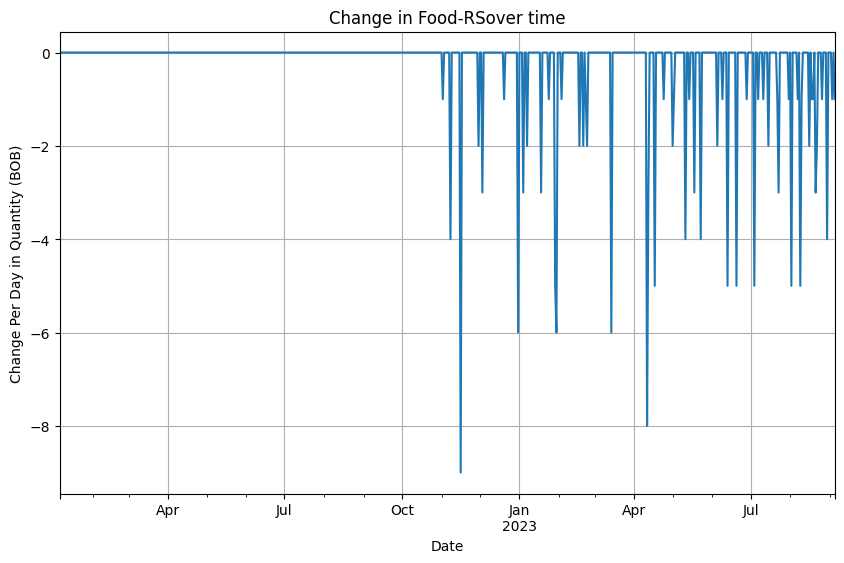

In [ ]:
diffCategoryCountExtended = categoryCountExtended.diff()

for i in diffCategoryCountExtended.index:
  diffCategoryCountExtended[i] = diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0

diffCategoryCountExtended.plot(kind='line', figsize=(10, 6))
#maxSeriesExtended.plot(style='.')
#minSeriesExtended.plot(style='.')
#plt.plot(categoryCount.index, categoryCount.values)
#plt.plot(maxSeries.index, maxSeries.values)
plt.title('Change in ' + categoryName + 'over time')
plt.xlabel('Date')
plt.ylabel('Change Per Day in Quantity (BOB)')
plt.grid(True)
plt.show()

In [ ]:
print(maxSeries)
print(minSeries)


Series([], Freq: D, Name: status, dtype: float64)
Series([], Freq: D, Name: status, dtype: float64)


In [ ]:
print(maxSeries)

Series([], Freq: D, Name: status, dtype: float64)


In [ ]:
print(resupplySeries)

2022-10-28    44.0
2023-02-10    42.0
2023-02-26    24.0
2023-05-25    47.0
2023-08-24    54.0
Name: status, dtype: float64


## Flight Plan Related / Crew Count

In [ ]:
flightPlan = pd.read_csv(dir + flist[2])

In [ ]:
DockAndEVA = flightPlan.drop(flightPlan[~(((flightPlan['event'] == 'EVA') & (flightPlan['eva_accuracy'] == 'Actual')) | (flightPlan['event'] == 'Dock'))].index)
DockAndEVA['datedim'] = pd.to_datetime(DockAndEVA['datedim'])
DockAndEVA = DockAndEVA.sort_values(by='datedim')
DockAndEVA.reset_index(drop=True, inplace=True)
DockAndEVA.head(20)

,datedim,vehicle_name,port_name,vehicle_type,eva_name,eva_type,eva_accuracy,event
0,2022-01-19,NaN,NaN,NaN,R-51,RS,Actual,EVA
1,2022-02-17,80Progress,MRM2 / SM Zenith,Progress,NaN,NaN,NaN,Dock
2,2022-02-21,NG-17,N1 Nadir,CRS2 Cygnus,NaN,NaN,NaN,Dock
3,2022-03-15,NaN,NaN,NaN,U-79 (IROSA Prep 3A),US,Actual,EVA
4,2022-03-18,67Soyuz,NM,Soyuz,NaN,NaN,NaN,Dock
5,2022-03-23,NaN,NaN,NaN,U-80 (RBVM Jumper),US,Actual,EVA
6,2022-04-09,Ax-1,N2 Zenith,PAM - SpaceX,NaN,NaN,NaN,Dock
7,2022-04-18,NaN,NaN,NaN,R-52,RS,Actual,EVA
8,2022-04-27,Crew-4,N2 Zenith,Crew Dragon,NaN,NaN,NaN,Dock
9,2022-04-28,NaN,NaN,NaN,R-53,RS,Actual,EVA


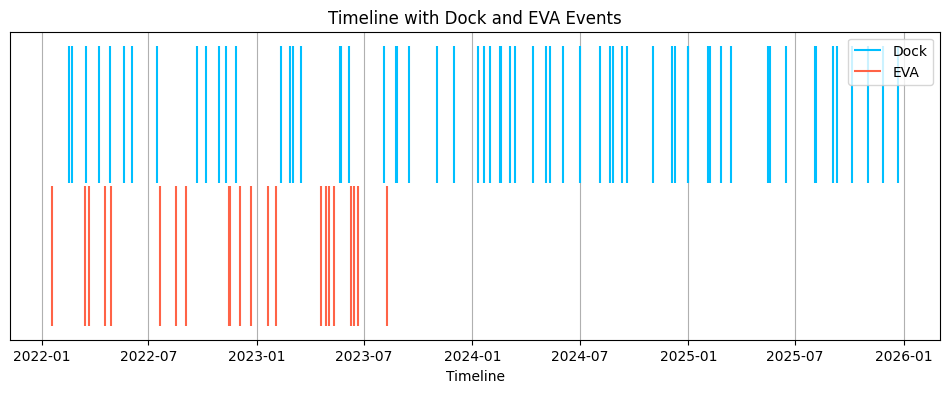

In [ ]:
All_Docking = DockAndEVA[DockAndEVA['event'] == 'Dock']
All_EVA = DockAndEVA[DockAndEVA['event'] == 'EVA']

fig, ax = plt.subplots(figsize=(12, 4))

plt.vlines(x=All_Docking['datedim'], ymin=0.51, ymax=1, color='deepskyblue', label='Dock')
plt.vlines(x=All_EVA['datedim'], ymin=0, ymax=0.5, color='tomato', label='EVA')

plt.xlabel('Timeline')
plt.title('Timeline with Dock and EVA Events')
plt.grid()
plt.yticks([])
plt.legend()
plt.show()

In [ ]:
EVA_activites = flightPlan.drop(flightPlan[~((flightPlan['event'] == 'EVA') & (flightPlan['eva_accuracy'] == 'Actual'))].index)
EVA_activites['datedim'] = pd.to_datetime(EVA_activites['datedim'])
EVA_activites = EVA_activites.sort_values(by='datedim')
EVA_activites.reset_index(drop=True, inplace=True)
EVA_activites.head(20)

,datedim,vehicle_name,port_name,vehicle_type,eva_name,eva_type,eva_accuracy,event
0,2022-01-19,NaN,NaN,NaN,R-51,RS,Actual,EVA
1,2022-03-15,NaN,NaN,NaN,U-79 (IROSA Prep 3A),US,Actual,EVA
2,2022-03-23,NaN,NaN,NaN,U-80 (RBVM Jumper),US,Actual,EVA
3,2022-04-18,NaN,NaN,NaN,R-52,RS,Actual,EVA
4,2022-04-28,NaN,NaN,NaN,R-53,RS,Actual,EVA
5,2022-07-21,NaN,NaN,NaN,R-ESA,RS,Actual,EVA
6,2022-08-17,NaN,NaN,NaN,R-54,RS,Actual,EVA
7,2022-09-02,NaN,NaN,NaN,R-54A,RS,Actual,EVA
8,2022-11-15,NaN,NaN,NaN,U-81 (IROSA Prep 1B),US,Actual,EVA
9,2022-11-17,NaN,NaN,NaN,R-55,RS,Actual,EVA


In [ ]:
flightPlan = flightPlan.dropna(subset=['event'])
flightPlan = flightPlan.drop(flightPlan[~flightPlan['event'].isin(['Dock', 'Undock'])].index)
flightPlan['datedim'] = pd.to_datetime(flightPlan['datedim'])
flightPlan.reset_index(drop=True, inplace=True)
flightPlan_sorted = flightPlan.sort_values(by=['vehicle_name', 'datedim'])
flightPlan_sorted.reset_index(drop=True, inplace=True)
flightPlan.tail(20)

,datedim,vehicle_name,port_name,vehicle_type,eva_name,eva_type,eva_accuracy,event
104,2025-05-30,PAM-6,N2 Fwd / PMA-2,PAM,NaN,NaN,NaN,Undock
105,2025-06-04,NG-22,N1 Nadir,CRS2 Cygnus,NaN,NaN,NaN,Undock
106,2025-06-12,90Progress,MRM2 / SM Zenith,Progress,NaN,NaN,NaN,Undock
107,2025-06-16,92Progress,MRM2 / SM Zenith,Progress,NaN,NaN,NaN,Dock
108,2025-08-03,DCC-3,N2 Nadir,Dream Chaser,NaN,NaN,NaN,Undock
109,2025-08-03,NG-23,N1 Nadir,CRS2 Cygnus,NaN,NaN,NaN,Dock
110,2025-08-05,USCV-11,N2 Fwd / PMA-2,USCV,NaN,NaN,NaN,Dock
111,2025-08-11,USCV-10,N2 Zenith,USCV,NaN,NaN,NaN,Undock
112,2025-08-30,91Progress,SM-Aft,Progress,NaN,NaN,NaN,Undock
113,2025-09-03,93Progress,SM-Aft,Progress,NaN,NaN,NaN,Dock


In [ ]:
grouped_data = flightPlan_sorted.groupby('vehicle_name')
soyuz_count = 0
crew_count = 0
progress_count = 0
for name, group in grouped_data:
    if name.startswith('SpX'):
        flightPlan_sorted.loc[group.index, 'vehicle_name'] = 'SpX'
    if name.startswith('DCC'):
        flightPlan_sorted.loc[group.index, 'vehicle_name'] = 'DCC'
    if name.startswith('HTV'):
        flightPlan_sorted.loc[group.index, 'vehicle_name'] = 'HTV'
    if name.startswith('NG'):
        flightPlan_sorted.loc[group.index, 'vehicle_name'] = 'NG'
    if name.startswith('Ax'):
        flightPlan_sorted.loc[group.index, 'vehicle_name'] = 'Ax'
    if name.startswith('Boe'):
        flightPlan_sorted.loc[group.index, 'vehicle_name'] = 'Boe'
    if name.startswith('PAM'):
        flightPlan_sorted.loc[group.index, 'vehicle_name'] = 'PAM'
    if name.endswith('Soyuz'):
        events = group['event'].tolist()
        dock_indices = [i for i, event in enumerate(events) if event == 'Dock']
        undock_indices = [i for i, event in enumerate(events) if event == 'Undock']
        if len(dock_indices) == len(undock_indices):
            for i in range(len(dock_indices)):
                start_index = dock_indices[i]
                end_index = undock_indices[i]
                flightPlan_sorted.loc[group.index[start_index:end_index + 1], 'vehicle_name'] = f'Soyuz-{(soyuz_count % 2) + 1}'
                soyuz_count += 1
    if name.endswith('Progress'):
        events = group['event'].tolist()
        dock_indices = [i for i, event in enumerate(events) if event == 'Dock']
        undock_indices = [i for i, event in enumerate(events) if event == 'Undock']
        if len(dock_indices) == len(undock_indices):
            for i in range(len(dock_indices)):
                start_index = dock_indices[i]
                end_index = undock_indices[i]
                flightPlan_sorted.loc[group.index[start_index:end_index + 1], 'vehicle_name'] = f'Progress-{(progress_count % 3) + 1}'
                progress_count += 1
    if name.startswith('Crew'):
        events = group['event'].tolist()
        dock_indices = [i for i, event in enumerate(events) if event == 'Dock']
        undock_indices = [i for i, event in enumerate(events) if event == 'Undock']
        if len(dock_indices) == len(undock_indices):
            for i in range(len(dock_indices)):
                start_index = dock_indices[i]
                end_index = undock_indices[i]
                flightPlan_sorted.loc[group.index[start_index:end_index + 1], 'vehicle_name'] = f'Crew-{(crew_count % 2) + 1}'
                crew_count += 1

flightPlan_sorted = flightPlan_sorted.sort_values(by=['vehicle_name', 'datedim'])
grouped_data = flightPlan_sorted.groupby('vehicle_name')

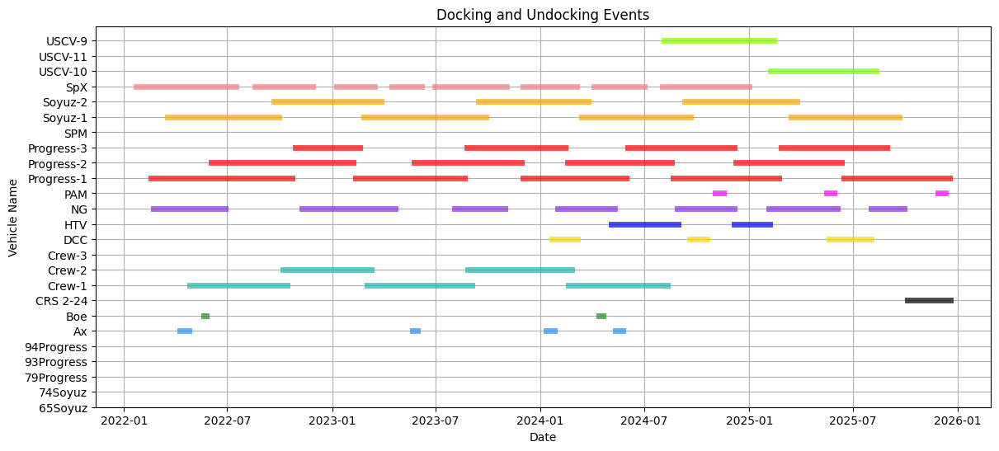

In [ ]:
# Create a figure and axis object
fig, ax = plt.subplots(figsize=(14, 6))
color_mapping = {
    'Soyuz': 'orange',
    'Progress': 'red',
    'Ax': 'dodgerblue',
    'Boe': 'forestgreen',
    'Crew': 'lightseagreen',
    'DCC': 'gold',
    'HTV': 'blue',
    'NG': 'blueviolet',
    'PAM': 'magenta',
    'SpX': 'lightcoral',
    'USCV': 'lawngreen'
}
# Plot events for each vehicle group
for i, (name, group) in enumerate(grouped_data):
    docking_dates = group[group['event'] == 'Dock']['datedim']
    undocking_dates = group[group['event'] == 'Undock']['datedim']
    color = 'black'  # Default color if no match found
    for key in color_mapping.keys():
        if key in name:
            color = color_mapping[key]
            break
    for dock_date, undock_date in zip(docking_dates, undocking_dates):
        ax.plot([dock_date, undock_date], [i, i], color=color, linewidth=5, alpha= 0.7)

ax.set_yticks(range(len(grouped_data)))
ax.set_yticklabels(grouped_data.groups.keys())
ax.set_xlabel('Date')
ax.set_ylabel('Vehicle Name')
ax.set_title('Docking and Undocking Events')
plt.grid(True)
plt.show()

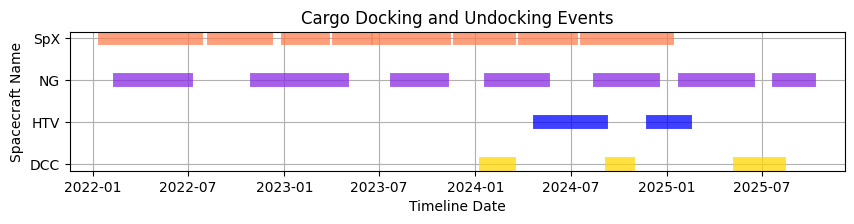

In [ ]:
Cargo_events = flightPlan_sorted[flightPlan_sorted['vehicle_name'].str.startswith(('SpX', 'NG', 'HTV', 'DCC'))]
# Plot cargo events for each spacecraft
fig, ax = plt.subplots(figsize=(10, 1.8))
color_mapping = {
    'DCC': 'gold',
    'HTV': 'blue',
    'NG': 'blueviolet',
    'SpX': 'coral',
}
for i, (name, group) in enumerate(Cargo_events.groupby('vehicle_name')):
    docking_dates = group[group['event'] == 'Dock']['datedim']
    undocking_dates = group[group['event'] == 'Undock']['datedim']
    color = 'black'  # Default color if no match found
    for key in color_mapping.keys():
        if key in name:
            color = color_mapping[key]
            break
    # Plot connected lines between docking and undocking events with the specified color
    for dock_date, undock_date in zip(docking_dates, undocking_dates):
        ax.plot([dock_date, undock_date], [i, i],color=color, linewidth=10, alpha=0.75)
# Set x-axis and y-axis labels
ax.set_yticks(range(len(Cargo_events.groupby('vehicle_name').groups)))
ax.set_yticklabels(Cargo_events.groupby('vehicle_name').groups.keys())
ax.set_xlabel('Timeline Date')
ax.set_ylabel('Spacecraft Name')
ax.set_title('Cargo Docking and Undocking Events')
plt.grid(True)
plt.show()

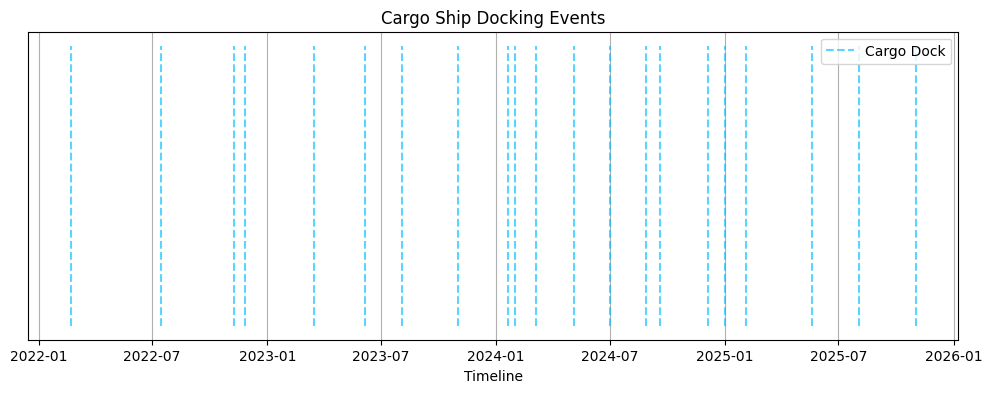

In [ ]:
Cargo_Docking = Cargo_events[Cargo_events['event'] == 'Dock']
fig, ax = plt.subplots(figsize=(12, 4))

plt.vlines(x=Cargo_Docking['datedim'], ymin=0.2, ymax=0.8, color='deepskyblue', label='Cargo Dock',linestyle='--', alpha=0.65)

plt.xlabel('Timeline')
plt.title('Cargo Ship Docking Events')
plt.grid()
plt.yticks([])
plt.legend()
plt.show()

In [ ]:
theFlightPlan = pd.read_csv(dir + flist[3]) # 'iss_flight_plan_crew_20220101-20251321.csv'

In [ ]:
theFlightPlan

,datedim,nationality_category,crew_count
0,1/1/2022,ASI,0
1,1/2/2022,ASI,0
2,1/3/2022,ASI,0
3,1/4/2022,ASI,0
4,1/5/2022,ASI,0
...,...,...,...
17527,12/27/2025,USOS,4
17528,12/28/2025,USOS,4
17529,12/29/2025,USOS,4
17530,12/30/2025,USOS,4


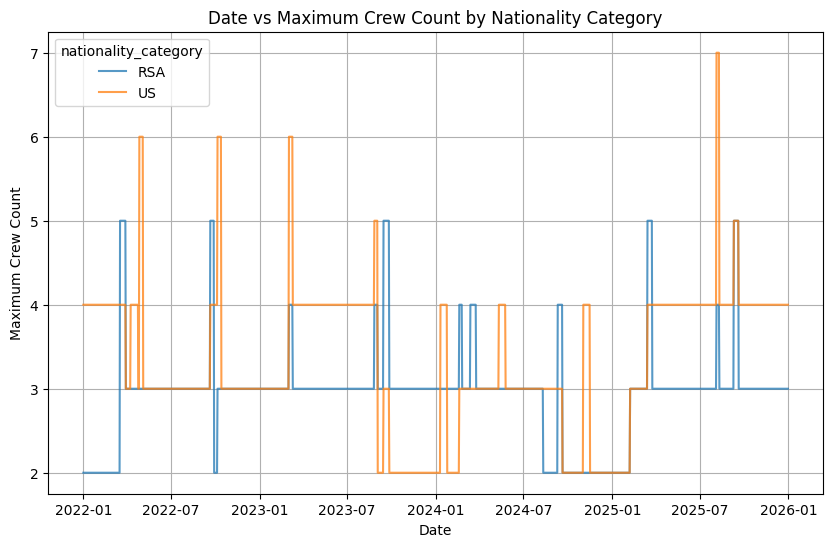

In [ ]:
# this doesn't represent the actual count. It undercounts as it finds the maximum count per day
theFlightPlan = theFlightPlan.sort_values(by='datedim')
from matplotlib.dates import MonthLocator
for index, row in theFlightPlan.iterrows():
    if row['nationality_category'].startswith('RSA'):
        theFlightPlan.at[index, 'nationality_category'] = 'RSA'
    else:
        theFlightPlan.at[index, 'nationality_category'] = 'US'
theFlightPlan['datedim'] = pd.to_datetime(theFlightPlan['datedim'])
theFlightPlan = theFlightPlan.sort_values(by='datedim')
grouped_data = theFlightPlan.groupby(['datedim', 'nationality_category'])['crew_count'].max().reset_index()
plt.figure(figsize=(10, 6))
sns.lineplot(data=grouped_data, x='datedim', y='crew_count', hue='nationality_category', alpha= 0.75)
# Add labels and title
plt.grid()
plt.xlabel('Date')
plt.ylabel('Maximum Crew Count')
plt.title('Date vs Maximum Crew Count by Nationality Category')
ax.xaxis.set_major_locator(MonthLocator(interval=6))
# Show plot
plt.show()

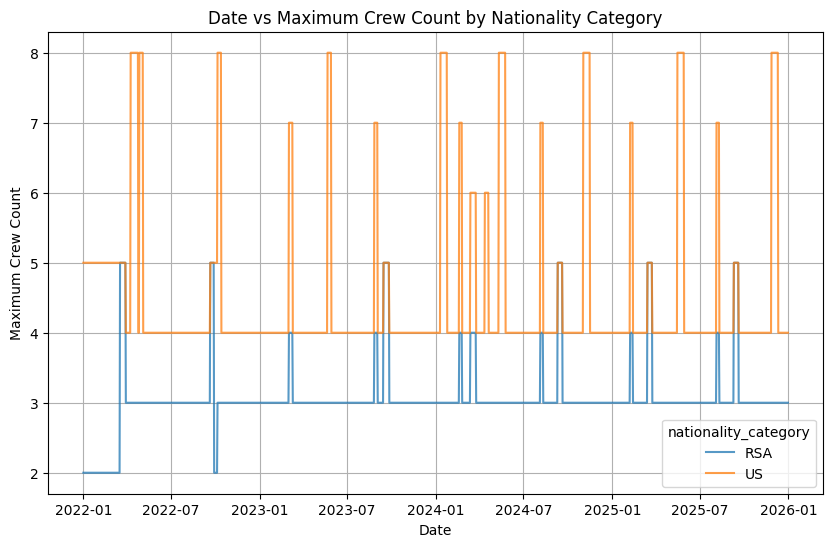

In [ ]:
theFlightPlan = theFlightPlan.sort_values(by='datedim')
from matplotlib.dates import MonthLocator
for index, row in theFlightPlan.iterrows():
    if row['nationality_category'].startswith('RSA'):
        theFlightPlan.at[index, 'nationality_category'] = 'RSA'
    elif row['nationality_category'].startswith('SFP'):
        theFlightPlan.at[index, 'nationality_category'] = 'RSA'
    else:
        theFlightPlan.at[index, 'nationality_category'] = 'US'
theFlightPlan['datedim'] = pd.to_datetime(theFlightPlan['datedim'])
theFlightPlan = theFlightPlan.sort_values(by='datedim')
grouped_data = theFlightPlan.groupby(['datedim', 'nationality_category'])['crew_count'].sum().reset_index()
plt.figure(figsize=(10, 6))
sns.lineplot(data=grouped_data, x='datedim', y='crew_count', hue='nationality_category', alpha= 0.75)
# Add labels and title
plt.grid()
plt.xlabel('Date')
plt.ylabel('Maximum Crew Count')
plt.title('Date vs Maximum Crew Count by Nationality Category')
ax.xaxis.set_major_locator(MonthLocator(interval=6))
# Show plot
plt.show()

In [ ]:
grouped_data['datedim'] = pd.to_datetime(grouped_data['datedim'])
crewCounts = grouped_data
# crewCountsClipped = grouped_data[grouped_data['datedim'] <= ]
crewCounts

,datedim,nationality_category,crew_count
0,2022-01-01,RSA,2
1,2022-01-01,US,5
2,2022-01-02,RSA,2
3,2022-01-02,US,5
4,2022-01-03,RSA,2
...,...,...,...
2917,2025-12-29,US,4
2918,2025-12-30,RSA,3
2919,2025-12-30,US,4
2920,2025-12-31,RSA,3


In [ ]:
crewCounts[ (crewCounts['datedim'] == pd.to_datetime('2022-01-03')) & (crewCounts['nationality_category'] == 'US') ]

,datedim,nationality_category,crew_count
5,2022-01-03,US,5


In [ ]:
crewCounts[ (crewCounts['nationality_category'] == 'US') ].iloc[0,2]

5

In [ ]:
crewCounts[ (crewCounts['datedim'] == pd.to_datetime('2022-01-03')) & (crewCounts['nationality_category'] == 'US') ]

,datedim,nationality_category,crew_count
5,2022-01-03,US,5


In [ ]:
crewTotalCounts = crewCounts.groupby(['datedim'])['crew_count'].sum().reset_index()
crewTotalCounts

,datedim,crew_count
0,2022-01-01,7
1,2022-01-02,7
2,2022-01-03,7
3,2022-01-04,7
4,2022-01-05,7
...,...,...
1456,2025-12-27,7
1457,2025-12-28,7
1458,2025-12-29,7
1459,2025-12-30,7


In [ ]:
 crewTotalCounts[crewTotalCounts['datedim'] == pd.to_datetime('2022-01-01')]

,datedim,crew_count
0,2022-01-01,7


In [ ]:
crewTotalCounts.iloc[0,1]

7

In [ ]:
primaryDateTimeIdx = pd.date_range('2022-01-01','2023-09-05')

In [ ]:
for i in primaryDateTimeIdx:
  print(i)

In [ ]:
len(primaryDateTimeIdx)

613

In [ ]:
rates = pd.read_csv(dir + flist[5]) # ratesXXX.csv
rates

,rate_category,affected_consumable,rate,units,type,efficiency
0,US Food BOBs,US Food BOBs,0.027000,BOBS/Crew/Day,usage,NaN
1,RS Food,RS Food Rations,0.200000,Rations/Crew/Day,usage,NaN
2,ACY Inserts,ACY Inserts,1.300000,Insert/Crew/Day,usage,NaN
3,KTO,KTO,0.035714,KTO/Crew/day,usage,NaN
4,Pretreat Tank,Pretreat Tanks,0.005556,Pretreat/Crew/Day,usage,NaN
5,Filter Inserts,Filter Inserts,0.007576,Insert Filter/Crew/Day,usage,NaN
6,Urine Receptacle,Urine Receptacle,0.007576,Urine Receptacle/Crew/Day,usage,NaN
7,Crew Metabolic O2 Usage,Oxygen,1.830000,lbs/Crew/Day,usage,NaN
8,Oxygen Generation Assembly (OGA),Oxygen,20.400000,lbs/Day*Efficiency,generation,1.0
9,PrK Leakage Air,Air,0.750000,lbs/Day,usage,NaN


In [ ]:
rates.iloc[0,2]

0.027

In [ ]:
catIdx = 6
categoryDataFrame = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == catIdx)]
categoryDataFrame = categoryDataFrame.drop_duplicates(subset=['id','date'])
categoryCount = categoryDataFrame.groupby('date').count()['status']
categoryName = stowables[stowables['categoryID'] == catIdx].iloc[0]['category_name']

countDataFrame['Count'] = pd.Series(categoryCount)

for targetDate in ['2023/05/01','2023/06/09']:
  targetIdx = categoryCount.index.get_loc(targetDate)
  correctedValue = (categoryCount[targetIdx+1] + categoryCount[targetIdx-1]) // 2
  categoryCount[targetIdx] = correctedValue

categoryCount.index = pd.to_datetime(categoryCount.index)

print(categoryCount.index)
dateRangeIdx = pd.date_range('2022/01/06', '2023/09/05')
categoryCountExtended = categoryCount.reindex(dateRangeIdx, method='ffill')
print(categoryCountExtended.index)

print(categoryCountExtended)
print(categoryCount['2023/02/26':'2023/03/15'])
print(categoryCountExtended['2023/02/26':'2023/03/15'])
print(categoryCountExtended['2023/03/04'])

categoryCountGapped = categoryCount
categoryCountGapped.index = pd.to_datetime(categoryCount.index)
categoryCountGapped = categoryCountGapped.reindex(dateRangeIdx, method='ffill')

print(categoryCountGapped['2023/03/01':'2023/03/15'])

print(categoryCount.values)

maxIndices = argrelmax(categoryCountExtended.values)
maxSeries = categoryCountExtended.iloc[maxIndices]
minIndices = argrelmin(categoryCountExtended.values)
minSeries = categoryCountExtended.iloc[minIndices]

print('Here is the maxSeries data:')
print(maxSeries)

maxSeriesExtended = maxSeries.reindex_like(categoryCount)

print('Here is the minSeries data:')
print(minSeries)

minSeriesExtended = minSeries.reindex_like(categoryCount)
print(maxSeries.index)

print(minSeries.index)

print(categoryCount.index)

# categoryCountExtended.plot(kind='line', figsize=(10, 6))
# #axs[0].plot(categoryCountExtended.index, categoryCountExtended.values, '-', label = categoryName)
#maxSeriesExtended.plot(style='.')
#minSeriesExtended.plot(style='.')
#plt.plot(categoryCount.index, categoryCount.values)
#plt.plot(maxSeries.index, maxSeries.values)


diffCategoryCountExtended = categoryCountExtended.diff()

# To get rid of the resupply spikes, uncomment the for loop below
#for i in diffCategoryCountExtended.index:
  #diffCategoryCountExtended[i] = diffCategoryCountExtended[i] if diffCategoryCountExtended[i] <= 0 else 0

'''
print()
resupplyList = []
for i in diffCategoryCountExtended.index:
  if diffCategoryCountExtended[i] > 1:
    resupplyList.append(diffCategoryCountExtended[i])
'''
resupplyList = argrelextrema(diffCategoryCountExtended.values, np.greater_equal)[0];

significant_resupplyList = [i for i in resupplyList if diffCategoryCountExtended[i] > significantSpikeValues[catIdx-1]]
resupplySeries = diffCategoryCountExtended.iloc[significant_resupplyList]

for idx in resupplySeries.index:
  print(idx, resupplySeries[idx])

#diffCategoryCountExtended.plot(kind='line', figsize=(10, 6))
# #axs[1].plot(diffCategoryCountExtended.index, diffCategoryCountExtended.values, '-', label=categoryName)

'''
try:
  axs[1].plot(resupplySeries.index, resupplySeries.values, '.')
except ValueError:
  pass
'''

#maxSeriesExtended.plot(style='.')
#minSeriesExtended.plot(style='.')
#plt.plot(categoryCount.index, categoryCount.values)
#plt.plot(maxSeries.index, maxSeries.values)



DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', name='date', length=540, freq=None)
DatetimeIndex(['2022-01-06', '2022-01-07', '2022-01-08', '2022-01-09',
               '2022-01-10', '2022-01-11', '2022-01-12', '2022-01-13',
               '2022-01-14', '2022-01-15',
               ...
               '2023-08-27', '2023-08-28', '2023-08-29', '2023-08-30',
               '2023-08-31', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05'],
              dtype='datetime64[ns]', length=608, freq='D')
2022-01-06    294
2022-01-07    288
2022-01-08    288
2022-01-09    288
2022-01-10    

"\ntry:\n  axs[1].plot(resupplySeries.index, resupplySeries.values, '.')\nexcept ValueError:\n  pass\n"

In [ ]:
categoryCountExtended[0]

294

In [ ]:
resupplySeries
type(resupplySeries.index)

In [ ]:
historicalCat6 = [0]
for idx in range(1,len(primaryDateTimeIdx)):
  historicalCat6.append(-1 * rates.iloc[0,2] * crewTotalCounts.iloc[idx,1])

In [ ]:
for idx in range(1,len(primaryDateTimeIdx)):
  print(primaryDateTimeIdx[idx])

In [ ]:
historicalCat6Arr = np.array(historicalCat6)

In [ ]:
historicalCat6Fit = historicalCat6[5:]
historicalCat6Fit[0] = 0
print(len(historicalCat6Fit))
print(historicalCat6Fit)

608
[0, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.27, -0.27, -0.27, -0.27, -0.27, -0.27, -0.27, -0.27, -0.27, -0.27, -0.27, -0.27, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.189, -0.189, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.297, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.189, -0.1

In [ ]:
historicalCat6Arr.size

613

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

for i in range(len(diffCategoryCountExtended)):
  print(diffCategoryCountExtended[i])

In [ ]:
cat6DateTimeRange = pd.date_range('2022-01-06','2023-09-05')
aggrgCat6 = [categoryCountExtended[0]]
for idx in range(1,len(cat6DateTimeRange)):
  if diffCategoryCountExtended[idx] <= 0:
    aggrgCat6.append(aggrgCat6[idx - 1] + historicalCat6Fit[idx])
  else:
    aggrgCat6.append(aggrgCat6[idx - 1] + historicalCat6Fit[idx] + diffCategoryCountExtended[idx])

In [ ]:
aggrgCat6

[294,
 293.811,
 293.62199999999996,
 293.43299999999994,
 293.2439999999999,
 302.0549999999999,
 301.8659999999999,
 301.67699999999985,
 301.48799999999983,
 301.2989999999998,
 301.1099999999998,
 300.92099999999976,
 300.73199999999974,
 300.5429999999997,
 300.3539999999997,
 300.1649999999997,
 299.97599999999966,
 299.78699999999964,
 299.5979999999996,
 299.4089999999996,
 299.2199999999996,
 299.03099999999955,
 298.84199999999953,
 298.6529999999995,
 298.4639999999995,
 298.27499999999947,
 298.08599999999944,
 297.8969999999994,
 297.7079999999994,
 297.5189999999994,
 297.32999999999936,
 297.14099999999934,
 296.9519999999993,
 296.7629999999993,
 296.5739999999993,
 296.38499999999925,
 296.19599999999923,
 296.0069999999992,
 295.8179999999992,
 295.62899999999917,
 295.43999999999915,
 295.2509999999991,
 295.0619999999991,
 294.8729999999991,
 294.68399999999906,
 294.49499999999904,
 294.305999999999,
 501.116999999999,
 500.927999999999,
 500.73899999999895,
 500.5

<Axes: >

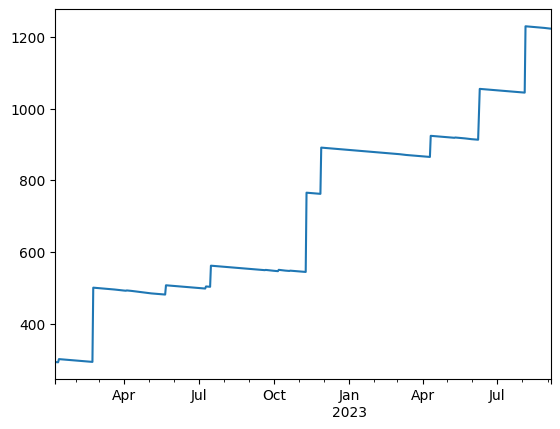

In [ ]:
historicalCat6TimeSeries = pd.Series(aggrgCat6, index = cat6DateTimeRange)

historicalCat6TimeSeries.plot(kind='line')

In [ ]:
for i in range(len(primaryDateTimeIdx)):
  print(primaryDateTimeIdx[i])

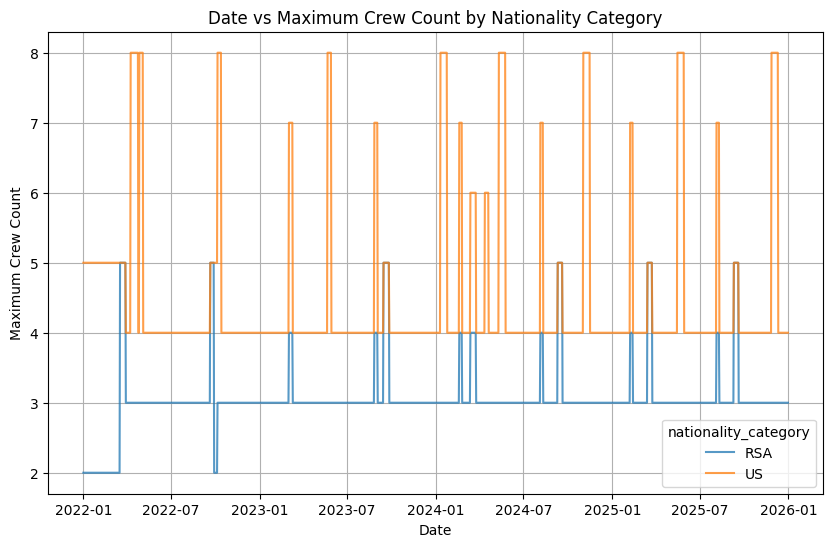

In [ ]:
theFlightPlan = theFlightPlan.sort_values(by='datedim')
from matplotlib.dates import MonthLocator
for index, row in theFlightPlan.iterrows():
    if row['nationality_category'].startswith('RSA'):
        theFlightPlan.at[index, 'nationality_category'] = 'RSA'
    else:
        theFlightPlan.at[index, 'nationality_category'] = 'US'
theFlightPlan['datedim'] = pd.to_datetime(theFlightPlan['datedim'])
theFlightPlan = theFlightPlan.sort_values(by='datedim')
grouped_data = theFlightPlan.groupby(['datedim', 'nationality_category'])['crew_count'].sum().reset_index()
plt.figure(figsize=(10, 6))
sns.lineplot(data=grouped_data, x='datedim', y='crew_count', hue='nationality_category', alpha= 0.75)
# Add labels and title
plt.grid()
plt.xlabel('Date')
plt.ylabel('Maximum Crew Count')
plt.title('Date vs Maximum Crew Count by Nationality Category')
ax.xaxis.set_major_locator(MonthLocator(interval=6))
# Show plot
plt.show()

In [ ]:
theFlightPlan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17532 entries, 0 to 4382
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   datedim               17532 non-null  datetime64[ns]
 1   nationality_category  17532 non-null  object        
 2   crew_count            17532 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 547.9+ KB


In [ ]:
theFlightPlan.groupby('nationality_category').count()

,datedim,crew_count
nationality_category,,
RSA,2922,2922
US,14610,14610


In [ ]:
listNationalityCategory = theFlightPlan['nationality_category'].unique()

In [ ]:
print(listNationalityCategory)

['US' 'RSA']


In [ ]:
for entryName in listNationalityCategory:
  mySlice = theFlightPlan[theFlightPlan['nationality_category'] == entryName]['datedim']
  dateRangeIdx = pd.date_range('2022-01-01',  '2025-12-31')

  print(type(mySlice))
  print(mySlice)

<class 'pandas.core.series.Series'>
0       2022-01-01
16071   2022-01-01
7305    2022-01-01
8766    2022-01-01
13149   2022-01-01
           ...    
16070   2025-12-31
8765    2025-12-31
7304    2025-12-31
14609   2025-12-31
4382    2025-12-31
Name: datedim, Length: 14610, dtype: datetime64[ns]
<class 'pandas.core.series.Series'>
10227   2022-01-01
11688   2022-01-01
10228   2022-01-02
11689   2022-01-02
11690   2022-01-03
           ...    
11685   2025-12-29
13147   2025-12-30
11686   2025-12-30
13148   2025-12-31
11687   2025-12-31
Name: datedim, Length: 2922, dtype: datetime64[ns]


In [ ]:
# Filter theFlightPlan by 'nationality_category' equals to entryName
filtered = theFlightPlan[theFlightPlan['nationality_category'] == entryName]

# Select 'crew_count' and convert to DataFrame
dfFlightPlan = filtered[['crew_count', 'datedim']]

# Set 'datedim' as the index
dfFlightPlan.set_index('datedim', inplace=True)

dfFlightPlan

,crew_count
datedim,
2022-01-01,2
2022-01-01,0
2022-01-02,2
2022-01-02,0
2022-01-03,0
...,...
2025-12-29,3
2025-12-30,0
2025-12-30,3


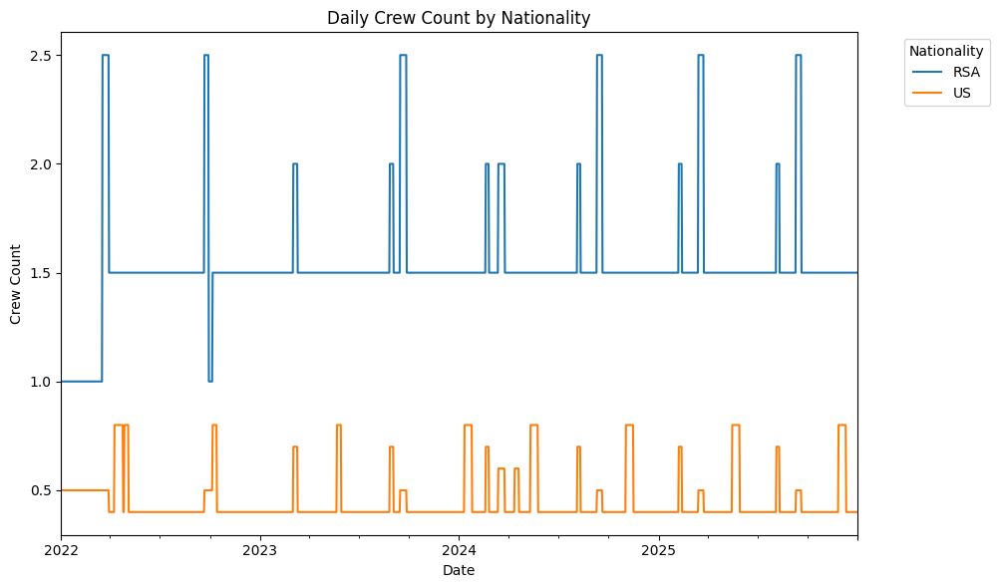

In [ ]:
daily_crew_per_nationality = theFlightPlan.groupby(['datedim', 'nationality_category'])['crew_count'].mean().reset_index() # reset index to monthly value instead of sum of total

# Pivot the data
crew_pivot = daily_crew_per_nationality.pivot(index='datedim', columns='nationality_category', values='crew_count').fillna(0)

# Ensure 'datedim' is in datetime format for proper plotting
crew_pivot.index = pd.to_datetime(crew_pivot.index)

plt.figure(figsize=(12, 6))
crew_pivot.plot(ax=plt.gca())
plt.title('Daily Crew Count by Nationality')
plt.xlabel('Date')
plt.ylabel('Crew Count')
plt.legend(title='Nationality', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside of plot
plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for the legend
plt.show()


In [ ]:
#dfFlightPlan = theFlightPlan[theFlightPlan['nationality_category'] == entryName]['crew_count'].to_frame()
#dfFlightPlan.set_index(theFlightPlan[theFlightPlan['nationality_category'] == entryName]['crew_count']['datedim'], inplace = True)
#dfFlightPlan

In [ ]:
dateRangeIdx2 = pd.date_range('2022-01-01', '2025-12-31', periods = 1461)
print(dateRangeIdx2)
print(type(dateRangeIdx2))


DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04',
               '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08',
               '2022-01-09', '2022-01-10',
               ...
               '2025-12-22', '2025-12-23', '2025-12-24', '2025-12-25',
               '2025-12-26', '2025-12-27', '2025-12-28', '2025-12-29',
               '2025-12-30', '2025-12-31'],
              dtype='datetime64[ns]', length=1461, freq=None)
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>


In [ ]:
crewCountSeries = theFlightPlan[theFlightPlan['nationality_category'] == entryName]['crew_count']
print(crewCountSeries)
counter=0
for idx in crewCountSeries.index:
  print(crewCountSeries[idx])
  counter+=1
print('counter value: ', counter)

In [ ]:
dateRangeIdx2

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04',
               '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08',
               '2022-01-09', '2022-01-10',
               ...
               '2025-12-22', '2025-12-23', '2025-12-24', '2025-12-25',
               '2025-12-26', '2025-12-27', '2025-12-28', '2025-12-29',
               '2025-12-30', '2025-12-31'],
              dtype='datetime64[ns]', length=1461, freq=None)

In [ ]:
# crewCountSeries.reindex(dateRangeIdx2)

In [ ]:
#for entryName in listNationalityCategory:
 # print(type(entryName))

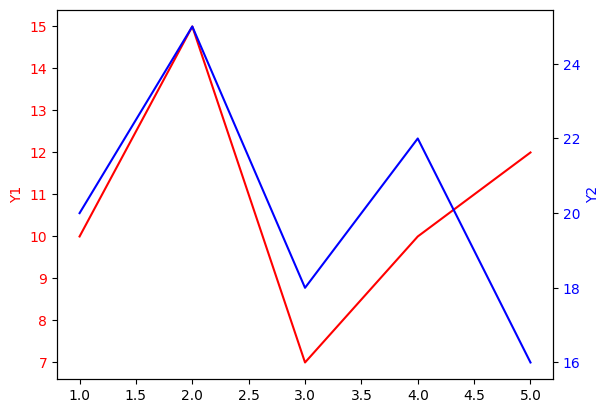

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Example data
data = {'x': [1, 2, 3, 4, 5],
        'y1': [10, 15, 7, 10, 12],
        'y2': [20, 25, 18, 22, 16]}
df = pd.DataFrame(data)

# Create a figure and axis object
fig, ax1 = plt.subplots()

# Plot the first dataset with the first y-axis
ax1.plot(df['x'], df['y1'], color='r')
ax1.set_ylabel('Y1', color='r')  # Set label for the first y-axis
ax1.tick_params(axis='y', labelcolor='r')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()
ax2.plot(df['x'], df['y2'], color='b')
ax2.set_ylabel('Y2', color='b')  # Set label for the second y-axis
ax2.tick_params(axis='y', labelcolor='b')

# Show the plot
plt.show()

## The Actual Usage Rate of Each Category

<ipython-input-161-f689de6a88e8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Cargo_Docking['datedim'] = pd.to_datetime(Cargo_Docking['datedim'])
<ipython-input-161-f689de6a88e8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Cargo_Docking['datedim'] = Cargo_Docking['datedim'].dt.strftime('%Y/%m/%d')


(0.0, 20.0)

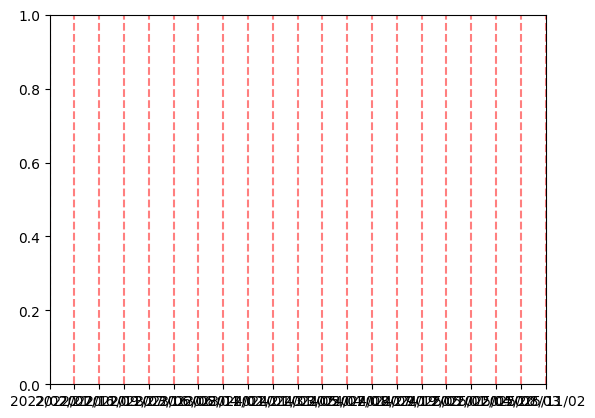

In [ ]:
Cargo_Docking['datedim'] = pd.to_datetime(Cargo_Docking['datedim'])
Cargo_Docking['datedim'] = Cargo_Docking['datedim'].dt.strftime('%Y/%m/%d')
Cargo_Docking_series = pd.Series(Cargo_Docking['datedim'])
Cargo_Docking_series = Cargo_Docking_series.sort_values()
Cargo_Docking_series
x_min = Cargo_Docking_series.min()
x_max = Cargo_Docking_series.max()
for x in Cargo_Docking_series:
    plt.axvline(x=x, color='r', linestyle='--', alpha=0.5)
plt.xlim(x_min, x_max)

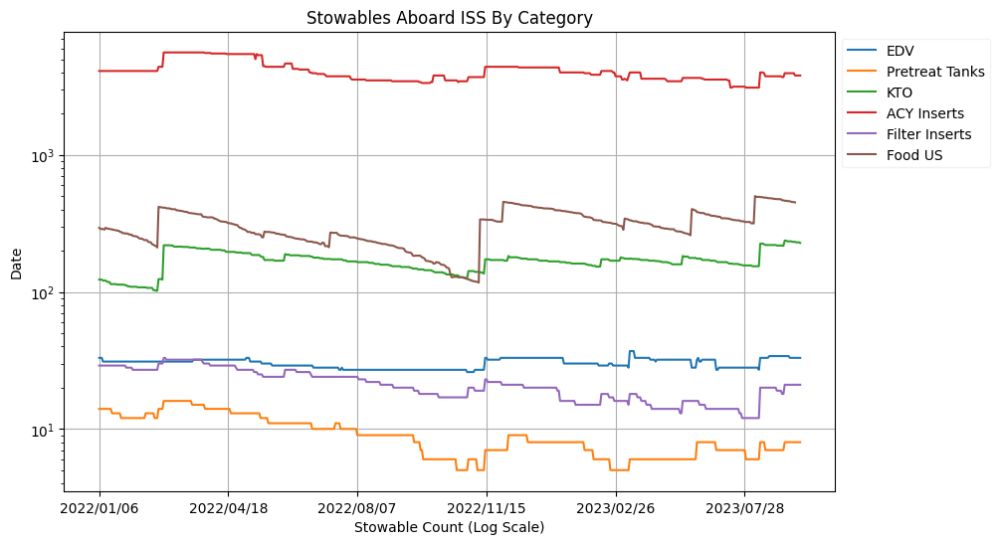

In [ ]:
dataFrameCat1 = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 1)]
dataFrameCat1 = dataFrameCat1.drop_duplicates(subset=['id','date'])
newFrameCat1 = dataFrameCat1.groupby('date').count()['status']
newFrameCat1.plot(kind='line', figsize=(10, 6),label='EDV')

dataFrameCat2 = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 2)]
dataFrameCat2 = dataFrameCat2.drop_duplicates(subset=['id','date'])
newFrameCat2 = dataFrameCat2.groupby('date').count()['status']
newFrameCat2.plot(kind='line', figsize=(10, 6),label='Pretreat Tanks')

dataFrameCat3 = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 3)]
dataFrameCat3 = dataFrameCat3.drop_duplicates(subset=['id','date'])
newFrameCat3 = dataFrameCat3.groupby('date').count()['status']
newFrameCat3.plot(kind='line', figsize=(10, 6),label='KTO')

dataFrameCat4 = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 4)]
dataFrameCat4 = dataFrameCat4.drop_duplicates(subset=['id','date'])
newFrameCat4 = dataFrameCat4.groupby('date').count()['status']
newFrameCat4 *= 50
newFrameCat4.plot(kind='line', figsize=(10, 6),label='ACY Inserts')

dataFrameCat5 = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 5)]
dataFrameCat5 = dataFrameCat5.drop_duplicates(subset=['id','date'])
newFrameCat5 = dataFrameCat5.groupby('date').count()['status']
newFrameCat5.plot(kind='line', figsize=(10, 6),label='Filter Inserts')

dataFrameCat6 = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 6)]
dataFrameCat6 = dataFrameCat6.drop_duplicates(subset=['id','date'])
newFrameCat6 = dataFrameCat6.groupby('date').count()['status']
newFrameCat6.plot(kind='line', figsize=(10, 6),label='Food US')

dataFrameCat7 = stowables[(stowables['status'] == "Stowed") & (stowables['categoryID'] == 7)]
dataFrameCat7 = dataFrameCat7.drop_duplicates(subset=['id','date'])
newFrameCat7 = dataFrameCat7.groupby('date').count()['status']
#newFrameCat7.plot(kind='line', figsize=(10, 6), label='Food RS')
# Category 7 has a shorter starting X


legend = plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
legend.get_frame().set_alpha(0.25)
plt.grid()
plt.xlabel('Stowable Count (Log Scale)')
plt.ylabel('Date')
plt.yscale('log')
plt.title('Stowables Aboard ISS By Category')
plt.show()


Length of Category 1 Accumulated_Series Usage: 544
Length of newFrameDiffCat1.index: 544
Slope: -0.06143680696973399
Intercept: 3.88229897463572


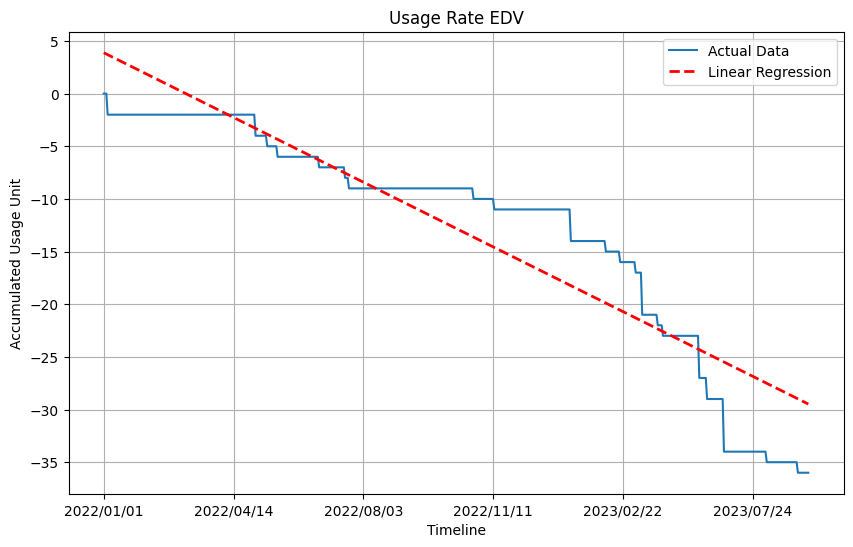

In [ ]:
newFrameDiffCat1 = newFrameCat1.diff()
newFrameDiffCat1[0] = 0
Cat1_accumulated_usage = []
Cat1_accumulated_sum = 0
for i in range(len(newFrameDiffCat1)):
    if newFrameDiffCat1[i] <= 0:
        Cat1_accumulated_sum += newFrameDiffCat1[i]
        Cat1_accumulated_usage.append(Cat1_accumulated_sum)
    else:
        Cat1_accumulated_sum += 0
        Cat1_accumulated_usage.append(Cat1_accumulated_sum)
Cat1_accumulated_series = pd.Series(Cat1_accumulated_usage)

print("Length of Category 1 Accumulated_Series Usage:", len(Cat1_accumulated_series))
print("Length of newFrameDiffCat1.index:", len(newFrameDiffCat1.index))

Cat1_accumulated_series.index = newFrameDiffCat1.index
Cat1_accumulated_series.plot(kind='line', figsize=(10, 6),label='Actual Data')

X = np.arange(len(Cat1_accumulated_series)).reshape(-1, 1)
y = Cat1_accumulated_series.values.reshape(-1, 1)
# Create and fit the linear regression model
model = LinearRegression()
model.fit(X, y)

print("Slope:", model.coef_[0][0])
print("Intercept:", model.intercept_[0])
Slope1=model.coef_[0][0]
predictions = model.predict(X)
#plt.plot(newFrameCat1.index, Cat1_accumulated_series.values,label='Original Data', marker='.', color='royalblue', alpha=0.6)
plt.plot(newFrameDiffCat1.index, predictions, label='Linear Regression', linestyle='--', color='red',linewidth=2)
plt.title('Usage Rate EDV')
plt.ylabel('Accumulated Usage Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 1 predict Model_usage: 544
Length of newFrameCat1.index: 544


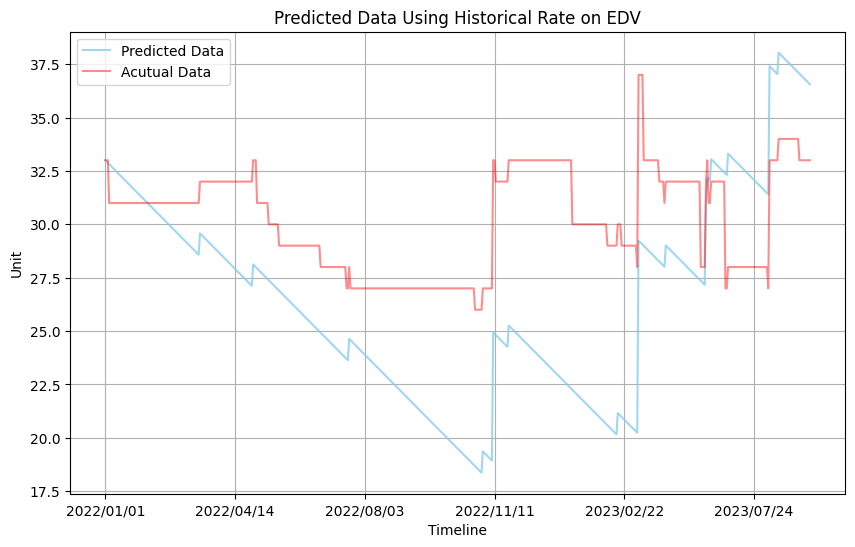

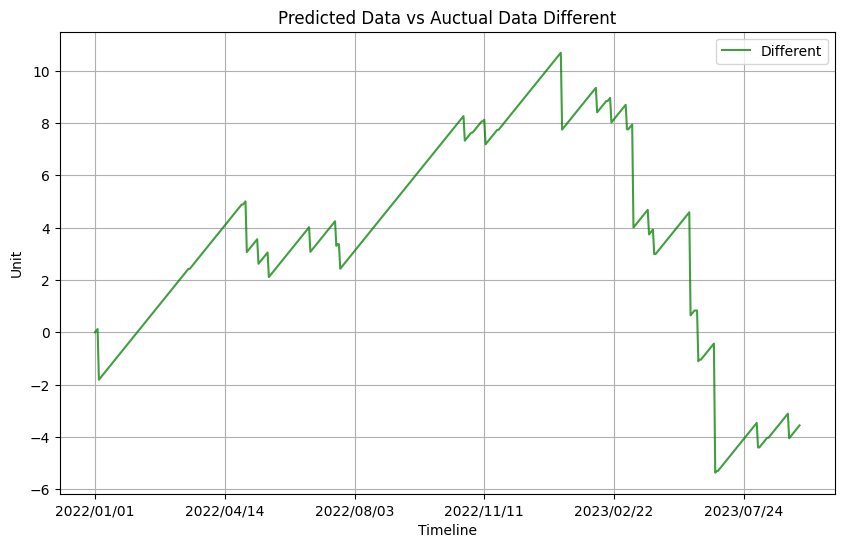

Mean Absolute Percentage Error (MAPE): 0.16%
Mean Squared Error (MSE): 29.54


In [ ]:
pModelCate1 = newFrameCat1
predModel_usage_cat1 = []
pModelCat1Diff = []
for i in range(len(pModelCate1)):
    if i > 0:
      if pModelCate1[i] - pModelCate1[i-1]  > 0:
        predModel_usage_cat1.append(predModel_usage_cat1[i-1]+(pModelCate1[i]-pModelCate1[i-1]))
      else:
        predModel_usage_cat1.append(predModel_usage_cat1[i-1]+Slope1)
    else:
      predModel_usage_cat1.append(pModelCate1[i])

predModel_usage_cat1 = pd.Series(predModel_usage_cat1)
print("Length of Category 1 predict Model_usage:", len(predModel_usage_cat1))
print("Length of newFrameCat1.index:", len(newFrameCat1.index))
predModel_usage_cat1.index = pModelCate1.index
for i in range(len(newFrameCat1)):
    pModelCat1Diff.append(newFrameCat1[i]- predModel_usage_cat1[i])

pModelCat1Diff = pd.Series(pModelCat1Diff)
pModelCat1Diff.index = pModelCate1.index
predModel_usage_cat1.plot(kind='line', figsize=(10, 6),label='Predicted Data', color='skyblue', alpha= 0.8)
newFrameCat1.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Using Historical Rate on EDV')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

pModelCat1Diff.plot(kind='line', figsize=(10, 6),label='Different', color='green',alpha=0.75)
plt.title('Predicted Data vs Auctual Data Different')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

yActual, yPred = np.array(newFrameCat1), np.array(predModel_usage_cat1)
mape = mean_absolute_percentage_error(yActual, yPred)
print("Mean Absolute Percentage Error (MAPE): {:.2f}%".format(mape))

mse = mean_squared_error(yActual, yPred)
print("Mean Squared Error (MSE): {:.2f}".format(mse))

Length of Category 2 Accumulated_Series Usage: 544
Length of newFrameDiffCat2.index: 544
Slope: -0.04272703962217456
Intercept: -1.4179910955207813


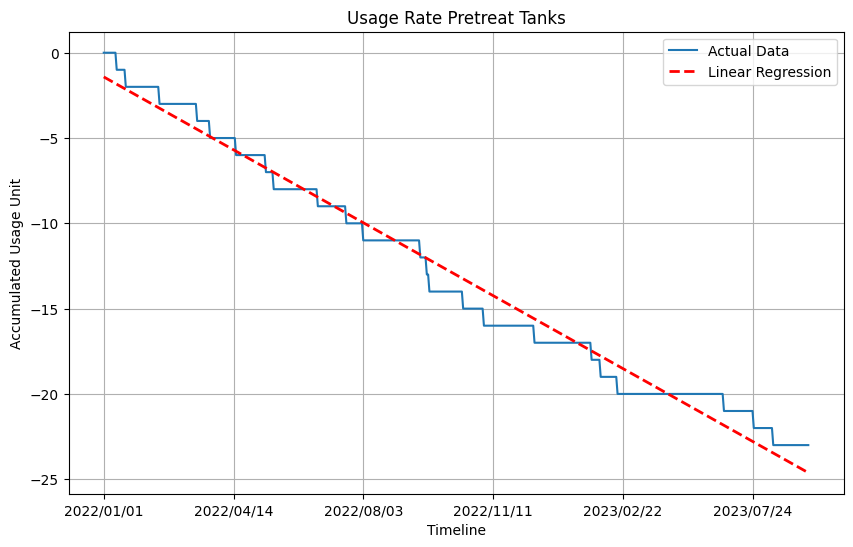

In [ ]:
newFrameDiffCat2 = newFrameCat2.diff()
newFrameDiffCat2[0] = 0
Cat2_accumulated_usage = []
Cat2_accumulated_sum = 0
for i in range(len(newFrameDiffCat2)):
    if newFrameDiffCat2[i] <= 0:
        Cat2_accumulated_sum += newFrameDiffCat2[i]
        Cat2_accumulated_usage.append(Cat2_accumulated_sum)
    else:
        Cat2_accumulated_sum += 0
        Cat2_accumulated_usage.append(Cat2_accumulated_sum)
Cat2_accumulated_series = pd.Series(Cat2_accumulated_usage)

print("Length of Category 2 Accumulated_Series Usage:", len(Cat2_accumulated_series))
print("Length of newFrameDiffCat2.index:", len(newFrameDiffCat2.index))
Cat2_accumulated_series.index = newFrameDiffCat2.index
Cat2_accumulated_series.plot(kind='line', figsize=(10, 6),label='Actual Data')
X = np.arange(len(Cat2_accumulated_series)).reshape(-1, 1)
y = Cat2_accumulated_series.values.reshape(-1, 1)
# Create and fit the linear regression model
model = LinearRegression()
model.fit(X, y)

print("Slope:", model.coef_[0][0])
print("Intercept:", model.intercept_[0])
Slope2=model.coef_[0][0]
predictions = model.predict(X)
#plt.plot(newFrameCat2.index, Cat2_accumulated_series.values,label='Original Data', marker='.', color='orange', alpha=0.6)
plt.plot(newFrameDiffCat2.index, predictions, label='Linear Regression', linestyle='--', color='red',linewidth=2)
plt.title('Usage Rate Pretreat Tanks')
plt.ylabel('Accumulated Usage Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 2 predict Model_usage: 544
Length of newFrameCat2.index: 544


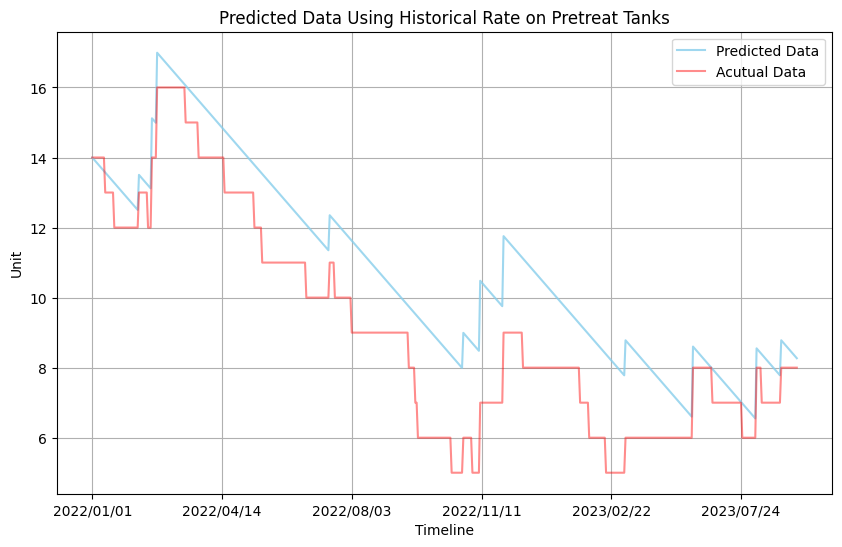

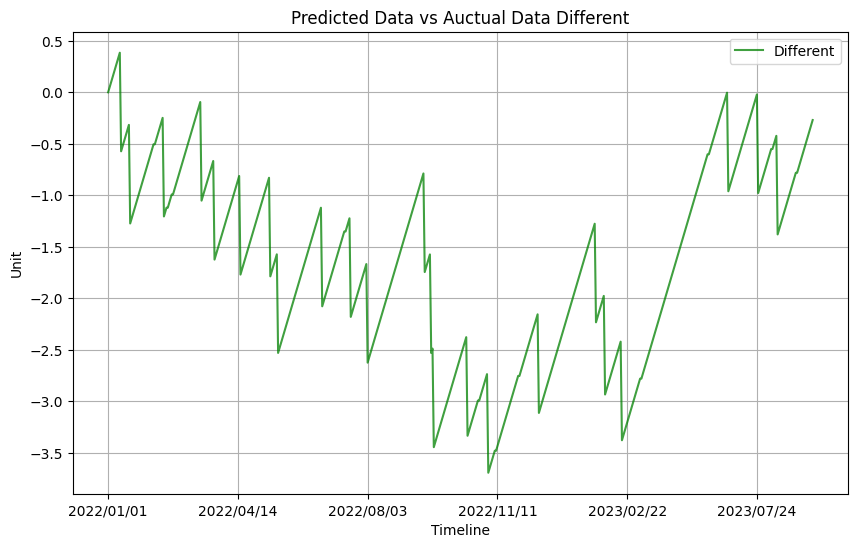

Mean Absolute Percentage Error (MAPE): 0.22%
Mean Squared Error (MSE): 3.57


In [ ]:
pModelCate2 = newFrameCat2
predModel_usage_cat2 = []
pModelCat2Diff = []
for i in range(len(pModelCate2)):
    if i > 0:
      if pModelCate2[i] - pModelCate2[i-1]  > 0:
        predModel_usage_cat2.append(predModel_usage_cat2[i-1]+(pModelCate2[i]-pModelCate2[i-1]))
      else:
        predModel_usage_cat2.append(predModel_usage_cat2[i-1]+Slope2)
    else:
      predModel_usage_cat2.append(pModelCate2[i])

predModel_usage_cat2 = pd.Series(predModel_usage_cat2)
print("Length of Category 2 predict Model_usage:", len(predModel_usage_cat2))
print("Length of newFrameCat2.index:", len(newFrameCat2.index))
predModel_usage_cat2.index = pModelCate2.index
for i in range(len(newFrameCat2)):
    pModelCat2Diff.append(newFrameCat2[i]- predModel_usage_cat2[i])

pModelCat2Diff = pd.Series(pModelCat2Diff)
pModelCat2Diff.index = pModelCate2.index
predModel_usage_cat2.plot(kind='line', figsize=(10, 6),label='Predicted Data', color='skyblue', alpha= 0.8)
newFrameCat2.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Using Historical Rate on Pretreat Tanks')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

pModelCat2Diff.plot(kind='line', figsize=(10, 6),label='Different', color='green',alpha=0.75)
plt.title('Predicted Data vs Auctual Data Different')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

yActual, yPred = np.array(newFrameCat2), np.array(predModel_usage_cat2)
mape = mean_absolute_percentage_error(yActual, yPred)
print("Mean Absolute Percentage Error (MAPE): {:.2f}%".format(mape))

mse = mean_squared_error(yActual, yPred)
print("Mean Squared Error (MSE): {:.2f}".format(mse))

Length of Category 3 Accumulated_Series Usage: 544
Length of newFrameDiffCat3.index: 544
Slope: -0.448712256964218
Intercept: -3.292269293038345


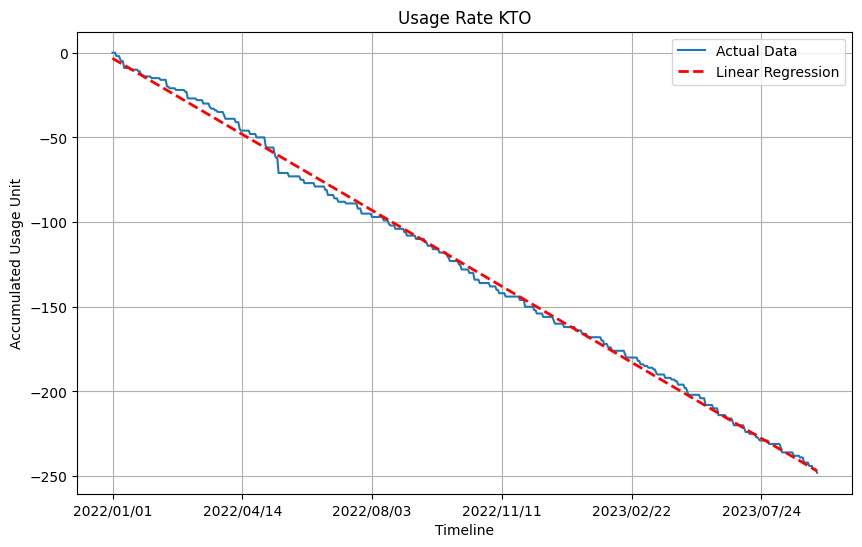

In [ ]:
newFrameDiffCat3 = newFrameCat3.diff()
newFrameDiffCat3[0] = 0
Cat3_accumulated_usage = []
Cat3_accumulated_sum = 0
for i in range(len(newFrameDiffCat3)):
    if newFrameDiffCat3[i] <= 0:
        Cat3_accumulated_sum += newFrameDiffCat3[i]
        Cat3_accumulated_usage.append(Cat3_accumulated_sum)
    else:
        Cat3_accumulated_sum += 0
        Cat3_accumulated_usage.append(Cat3_accumulated_sum)
Cat3_accumulated_series = pd.Series(Cat3_accumulated_usage)

print("Length of Category 3 Accumulated_Series Usage:", len(Cat3_accumulated_series))
print("Length of newFrameDiffCat3.index:", len(newFrameDiffCat3.index))

Cat3_accumulated_series.index = newFrameDiffCat3.index
Cat3_accumulated_series.plot(kind='line', figsize=(10, 6),label='Actual Data')

X = np.arange(len(Cat3_accumulated_series)).reshape(-1, 1)
y = Cat3_accumulated_series.values.reshape(-1, 1)
# Create and fit the linear regression model
model = LinearRegression()
model.fit(X, y)

print("Slope:", model.coef_[0][0])
print("Intercept:", model.intercept_[0])
Slope3=model.coef_[0][0]

predictions = model.predict(X)
#plt.plot(newFrameCat3.index, Cat3_accumulated_series.values,label='Original Data', marker='.', color='seagreen', alpha=0.6)
plt.plot(newFrameDiffCat3.index, predictions, label='Linear Regression', linestyle='--', color='red',linewidth=2)
plt.title('Usage Rate KTO')
plt.ylabel('Accumulated Usage Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 3 predict Model_usage: 544
Length of newFrameCat3.index: 544


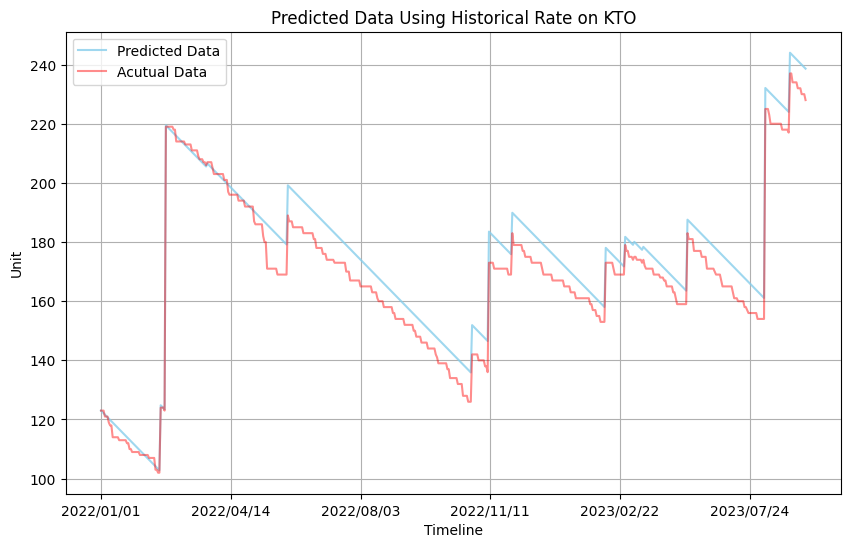

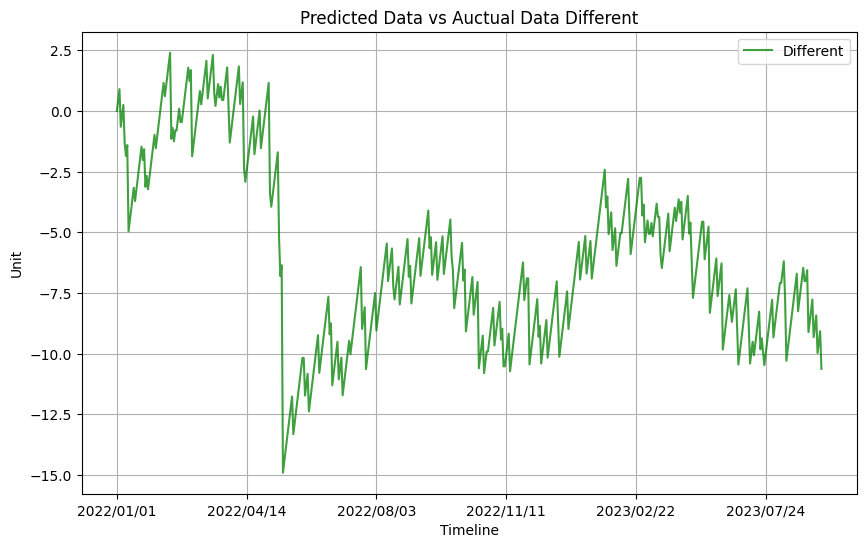

Mean Absolute Percentage Error (MAPE): 0.04%
Mean Squared Error (MSE): 49.33


In [ ]:
pModelCate3 = newFrameCat3
predModel_usage_cat3 = []
pModelCat3Diff = []
for i in range(len(pModelCate3)):
    if i > 0:
      if pModelCate3[i] - pModelCate3[i-1]  > 0:
        predModel_usage_cat3.append(predModel_usage_cat3[i-1]+(pModelCate3[i]-pModelCate3[i-1]))
      else:
        predModel_usage_cat3.append(predModel_usage_cat3[i-1]+Slope3)
    else:
      predModel_usage_cat3.append(pModelCate3[i])

predModel_usage_cat3 = pd.Series(predModel_usage_cat3)
print("Length of Category 3 predict Model_usage:", len(predModel_usage_cat3))
print("Length of newFrameCat3.index:", len(newFrameCat3.index))
predModel_usage_cat3.index = pModelCate3.index
for i in range(len(newFrameCat3)):
    pModelCat3Diff.append(newFrameCat3[i]- predModel_usage_cat3[i])

pModelCat3Diff = pd.Series(pModelCat3Diff)
pModelCat3Diff.index = pModelCate3.index
predModel_usage_cat3.plot(kind='line', figsize=(10, 6),label='Predicted Data', color='skyblue', alpha= 0.8)
newFrameCat3.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Using Historical Rate on KTO')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

pModelCat3Diff.plot(kind='line', figsize=(10, 6),label='Different', color='green',alpha=0.75)
plt.title('Predicted Data vs Auctual Data Different')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

yActual, yPred = np.array(newFrameCat3), np.array(predModel_usage_cat3)
mape = mean_absolute_percentage_error(yActual, yPred)
print("Mean Absolute Percentage Error (MAPE): {:.2f}%".format(mape))

mse = mean_squared_error(yActual, yPred)
print("Mean Squared Error (MSE): {:.2f}".format(mse))

Length of Category 4 Accumulated_Series Usage: 544
Length of newFrameDiffCat4.index: 544
Slope: -11.910463992987328
Intercept: 318.8012682137064


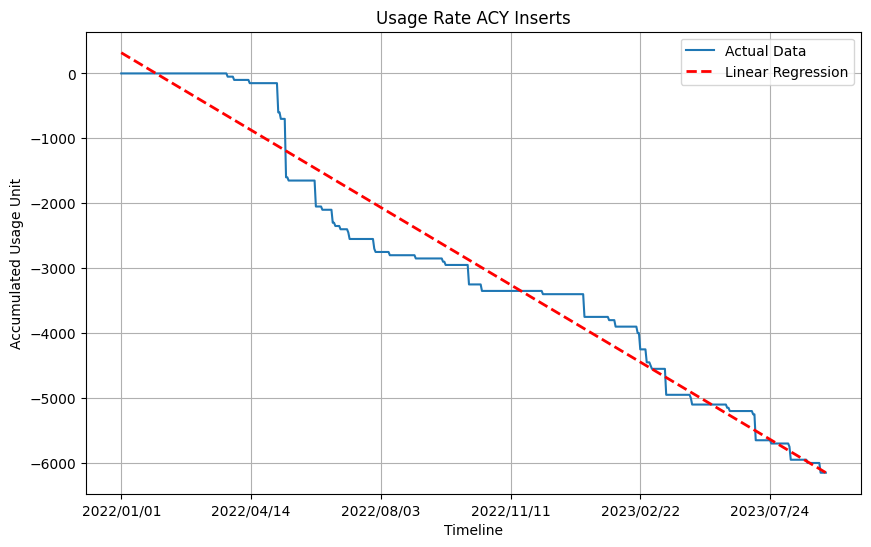

In [ ]:
newFrameDiffCat4 = newFrameCat4.diff()
newFrameDiffCat4[0] = 0
Cat4_accumulated_usage = []
Cat4_accumulated_sum = 0
for i in range(len(newFrameDiffCat4)):
    if newFrameDiffCat4[i] <= 0:
        Cat4_accumulated_sum += newFrameDiffCat4[i]
        Cat4_accumulated_usage.append(Cat4_accumulated_sum)
    else:
        Cat4_accumulated_sum += 0
        Cat4_accumulated_usage.append(Cat4_accumulated_sum)
Cat4_accumulated_series = pd.Series(Cat4_accumulated_usage)

print("Length of Category 4 Accumulated_Series Usage:", len(Cat4_accumulated_series))
print("Length of newFrameDiffCat4.index:", len(newFrameDiffCat4.index))

Cat4_accumulated_series.index = newFrameDiffCat4.index
Cat4_accumulated_series.plot(kind='line', figsize=(10, 6),label='Actual Data')

X = np.arange(len(Cat4_accumulated_series)).reshape(-1, 1)
y = Cat4_accumulated_series.values.reshape(-1, 1)
# Create and fit the linear regression model
model = LinearRegression()
model.fit(X, y)

print("Slope:", model.coef_[0][0])
print("Intercept:", model.intercept_[0])
Slope4 = model.coef_[0][0]
predictions = model.predict(X)
#plt.plot(newFrameDiffCat4.index, Cat4_accumulated_series.values,label='Original Data', marker='.', color='lightcoral', alpha=0.6)
plt.plot(newFrameDiffCat4.index, predictions, label='Linear Regression', linestyle='--', color='red',linewidth=2)
plt.title('Usage Rate ACY Inserts')
plt.ylabel('Accumulated Usage Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 4 predict Model_usage: 544
Length of newFrameCat4.index: 544


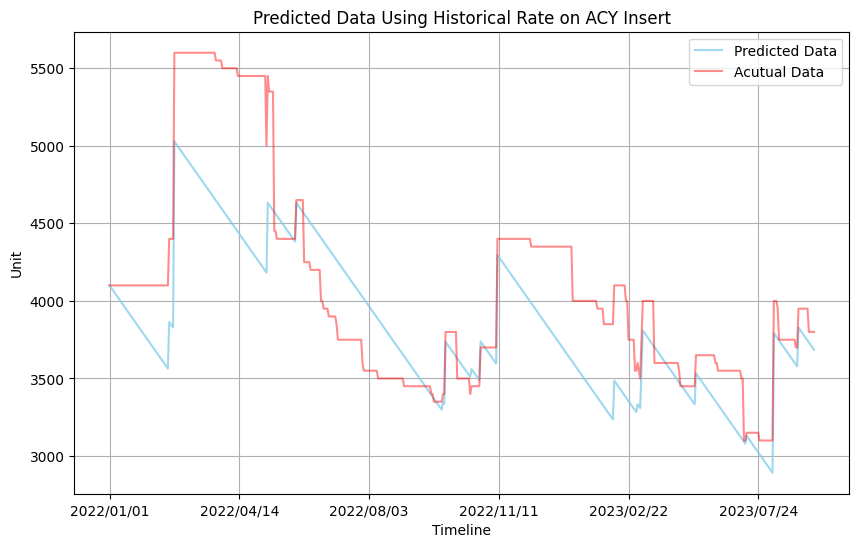

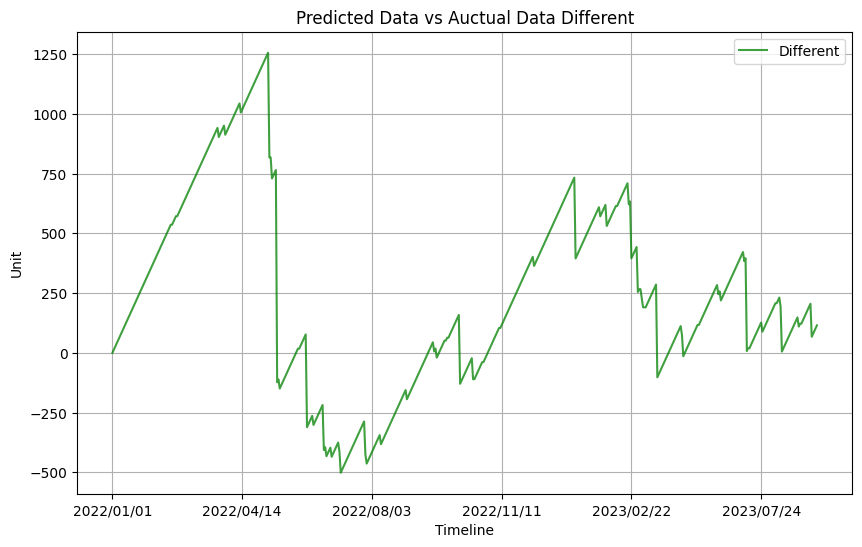

Mean Absolute Percentage Error (MAPE): 0.08%
Mean Squared Error (MSE): 209494.42


In [ ]:
pModelCate4 = newFrameCat4
predModel_usage_cat4 = []
pModelCat4Diff = []
for i in range(len(pModelCate4)):
    if i > 0:
      if pModelCate4[i] - pModelCate4[i-1]  > 0:
        predModel_usage_cat4.append(predModel_usage_cat4[i-1]+(pModelCate4[i]-pModelCate4[i-1]))
      else:
        predModel_usage_cat4.append(predModel_usage_cat4[i-1]+Slope4)
    else:
      predModel_usage_cat4.append(pModelCate4[i])

predModel_usage_cat4 = pd.Series(predModel_usage_cat4)
print("Length of Category 4 predict Model_usage:", len(predModel_usage_cat4))
print("Length of newFrameCat4.index:", len(newFrameCat4.index))
predModel_usage_cat4.index = pModelCate4.index
for i in range(len(newFrameCat4)):
    pModelCat4Diff.append(newFrameCat4[i]- predModel_usage_cat4[i])

pModelCat4Diff = pd.Series(pModelCat4Diff)
pModelCat4Diff.index = pModelCate4.index
predModel_usage_cat4.plot(kind='line', figsize=(10, 6),label='Predicted Data', color='skyblue', alpha= 0.8)
newFrameCat4.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Using Historical Rate on ACY Insert')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

pModelCat4Diff.plot(kind='line', figsize=(10, 6),label='Different', color='green',alpha=0.75)
plt.title('Predicted Data vs Auctual Data Different')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

yActual, yPred = np.array(newFrameCat4), np.array(predModel_usage_cat4)
mape = mean_absolute_percentage_error(yActual, yPred)
print("Mean Absolute Percentage Error (MAPE): {:.2f}%".format(mape))

mse = mean_squared_error(yActual, yPred)
print("Mean Squared Error (MSE): {:.2f}".format(mse))

Length of Category 5 Accumulated_Series Usage: 544
Length of newFrameDiffCat5.index: 544
Slope: -0.08487624965339169
Intercept: 1.7902253103076085


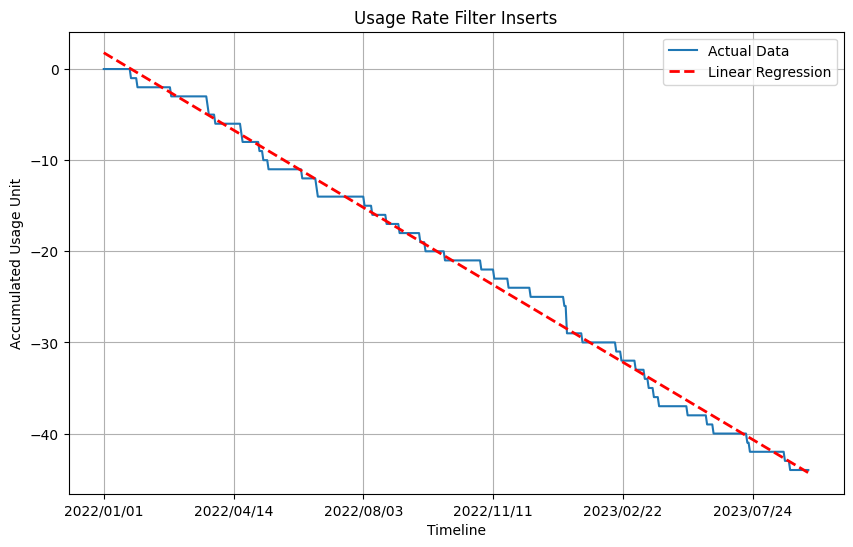

In [ ]:
newFrameDiffCat5 = newFrameCat5.diff()
newFrameDiffCat5[0] = 0
Cat5_accumulated_usage = []
Cat5_accumulated_sum = 0
for i in range(len(newFrameCat5)):
    if newFrameDiffCat5[i] <= 0:
        Cat5_accumulated_sum += newFrameDiffCat5[i]
        Cat5_accumulated_usage.append(Cat5_accumulated_sum)
    else:
        Cat5_accumulated_sum += 0
        Cat5_accumulated_usage.append(Cat5_accumulated_sum)
Cat5_accumulated_series = pd.Series(Cat5_accumulated_usage)

print("Length of Category 5 Accumulated_Series Usage:", len(Cat5_accumulated_series))
print("Length of newFrameDiffCat5.index:", len(newFrameDiffCat5.index))

Cat5_accumulated_series.index = newFrameDiffCat5.index
Cat5_accumulated_series.plot(kind='line', figsize=(10, 6),label='Actual Data')

X = np.arange(len(Cat5_accumulated_series)).reshape(-1, 1)
y = Cat5_accumulated_series.values.reshape(-1, 1)
# Create and fit the linear regression model
model = LinearRegression()
model.fit(X, y)

print("Slope:", model.coef_[0][0])
print("Intercept:", model.intercept_[0])
Slope5 = model.coef_[0][0]
predictions = model.predict(X)
#plt.plot(newFrameDiffCat5.index, Cat5_accumulated_series.values,label='Original Data', marker='.', color='sienna', alpha=0.6)
plt.plot(newFrameDiffCat5.index, predictions, label='Linear Regression', linestyle='--', color='red',linewidth=2)
plt.title('Usage Rate Filter Inserts')
plt.ylabel('Accumulated Usage Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 5 predict Model_usage: 544
Length of newFrameCat5.index: 544


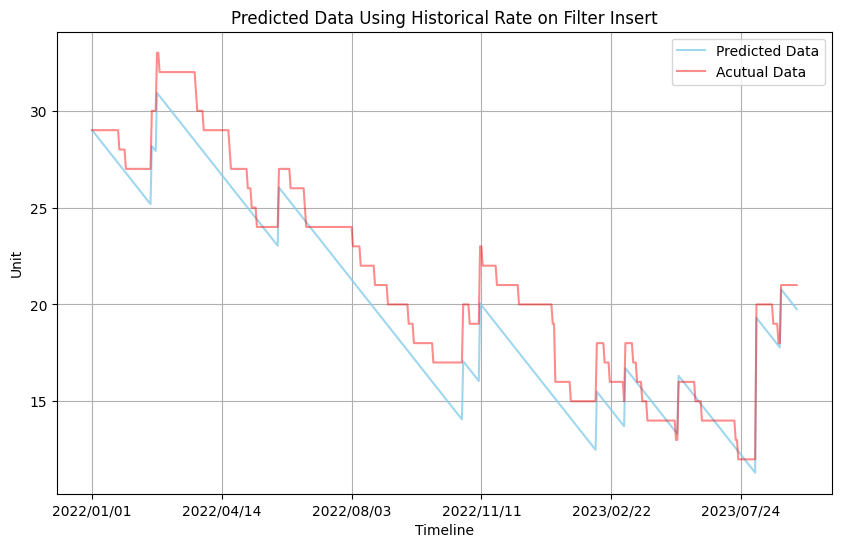

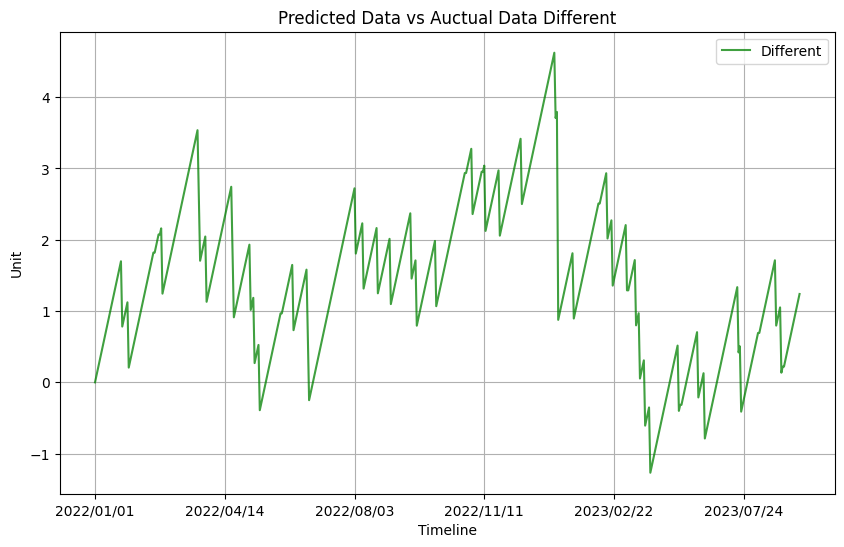

Mean Absolute Percentage Error (MAPE): 0.07%
Mean Squared Error (MSE): 3.19


In [ ]:
pModelCate5 = newFrameCat5
predModel_usage_cat5 = []
pModelCat5Diff = []
for i in range(len(pModelCate5)):
    if i > 0:
      if pModelCate5[i] - pModelCate5[i-1]  > 0:
        predModel_usage_cat5.append(predModel_usage_cat5[i-1]+(pModelCate5[i]-pModelCate5[i-1]))
      else:
        predModel_usage_cat5.append(predModel_usage_cat5[i-1]+Slope5)
    else:
      predModel_usage_cat5.append(pModelCate5[i])

predModel_usage_cat5 = pd.Series(predModel_usage_cat5)
print("Length of Category 5 predict Model_usage:", len(predModel_usage_cat5))
print("Length of newFrameCat5.index:", len(newFrameCat5.index))
predModel_usage_cat5.index = pModelCate5.index
for i in range(len(newFrameCat5)):
    pModelCat5Diff.append(newFrameCat5[i]- predModel_usage_cat5[i])

pModelCat5Diff = pd.Series(pModelCat5Diff)
pModelCat5Diff.index = pModelCate5.index
predModel_usage_cat5.plot(kind='line', figsize=(10, 6),label='Predicted Data', color='skyblue', alpha= 0.8)
newFrameCat5.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Using Historical Rate on Filter Insert')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

pModelCat5Diff.plot(kind='line', figsize=(10, 6),label='Different', color='green',alpha=0.75)
plt.title('Predicted Data vs Auctual Data Different')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

yActual, yPred = np.array(newFrameCat5), np.array(predModel_usage_cat5)
mape = mean_absolute_percentage_error(yActual, yPred)
print("Mean Absolute Percentage Error (MAPE): {:.2f}%".format(mape))

mse = mean_squared_error(yActual, yPred)
print("Mean Squared Error (MSE): {:.2f}".format(mse))

Length of Category 6 Accumulated_Series Usage: 540
Length of newFrameDiffCat6.index: 540
Slope: -1.599344533646092
Intercept: -23.75442596015597


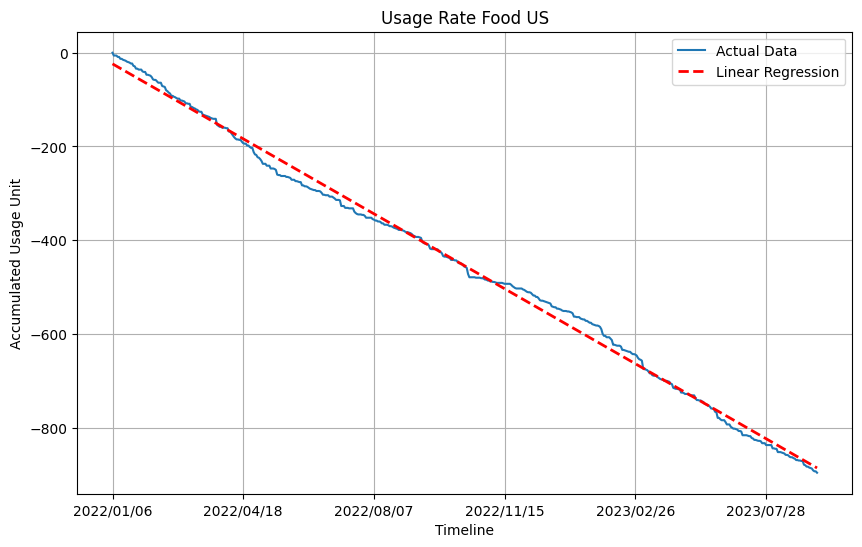

In [ ]:
newFrameDiffCat6 = newFrameCat6.diff()
newFrameDiffCat6[0] = 0
Cat6_accumulated_usage = []
Cat6_accumulated_sum = 0
for i in range(len(newFrameDiffCat6)):
    if newFrameDiffCat6[i] <= 0:
        Cat6_accumulated_sum += newFrameDiffCat6[i]
        Cat6_accumulated_usage.append(Cat6_accumulated_sum)
    else:
        Cat6_accumulated_sum += 0
        Cat6_accumulated_usage.append(Cat6_accumulated_sum)
Cat6_accumulated_series = pd.Series(Cat6_accumulated_usage)

print("Length of Category 6 Accumulated_Series Usage:", len(Cat6_accumulated_series))
print("Length of newFrameDiffCat6.index:", len(newFrameDiffCat6.index))

Cat6_accumulated_series.index = newFrameDiffCat6.index
Cat6_accumulated_series.plot(kind='line', figsize=(10, 6),label='Actual Data')

X = np.arange(len(Cat6_accumulated_series)).reshape(-1, 1)
y = Cat6_accumulated_series.values.reshape(-1, 1)
# Create and fit the linear regression model
model = LinearRegression()
model.fit(X, y)

print("Slope:", model.coef_[0][0])
print("Intercept:", model.intercept_[0])
slope6 = model.coef_[0][0]
predictions = model.predict(X)
#plt.plot(newFrameDiffCat6.index, Cat6_accumulated_series.values,label='Original Data', marker='.', color='purple', alpha=0.6)
plt.plot(newFrameDiffCat6.index, predictions, label='Linear Regression', linestyle='--', color='red',linewidth=2)
plt.title('Usage Rate Food US')
plt.ylabel('Accumulated Usage Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 6 predict Model_usage: 540
Length of newFrameCat6.index: 540


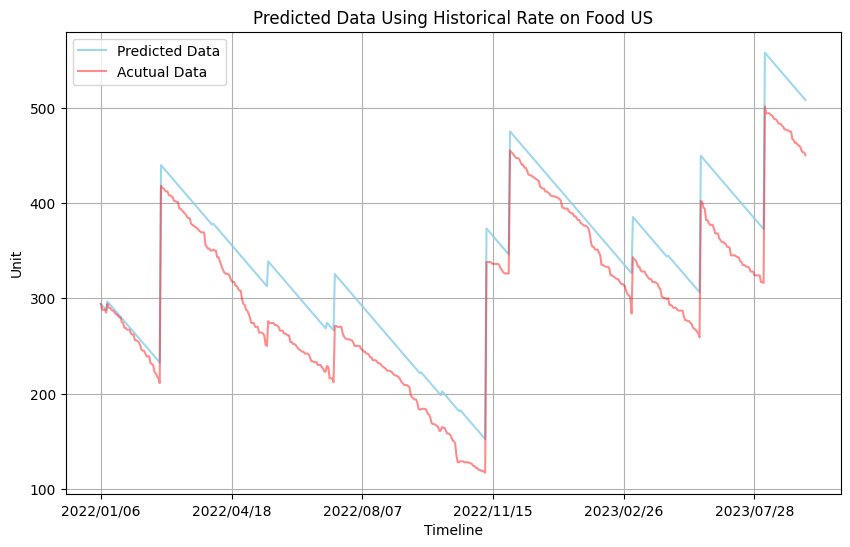

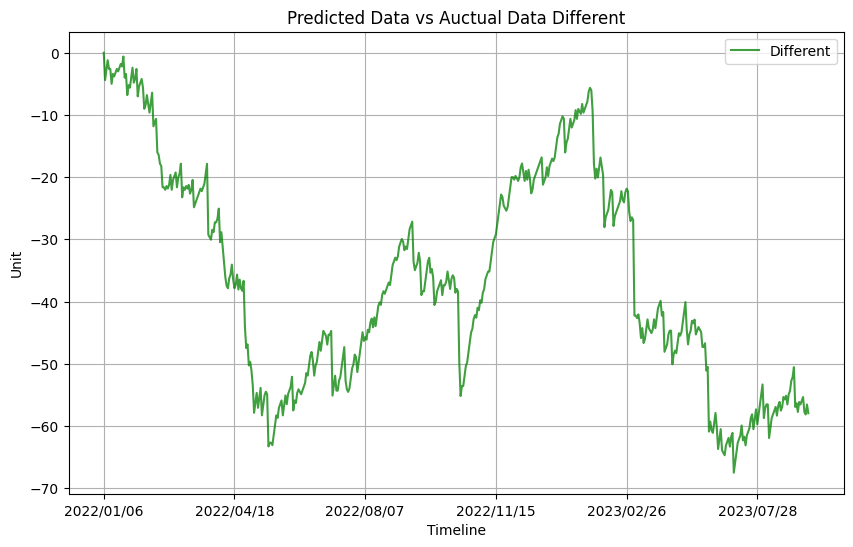

Mean Absolute Percentage Error (MAPE): 0.13%
Mean Squared Error (MSE): 1629.47


In [ ]:
pModelCate6 = newFrameCat6
predModel_usage_cat6 = []
pModelCat6Diff = []
for i in range(len(pModelCate6)):
    if i > 0:
      if pModelCate6[i] - pModelCate6[i-1]  > 0:
        predModel_usage_cat6.append(predModel_usage_cat6[i-1]+(pModelCate6[i]-pModelCate6[i-1]))
      else:
        predModel_usage_cat6.append(predModel_usage_cat6[i-1]+slope6)
    else:
      predModel_usage_cat6.append(pModelCate6[i])

predModel_usage_cat6 = pd.Series(predModel_usage_cat6)
print("Length of Category 6 predict Model_usage:", len(predModel_usage_cat6))
print("Length of newFrameCat6.index:", len(newFrameCat6.index))
predModel_usage_cat6.index = pModelCate6.index
for i in range(len(newFrameCat6)):
    pModelCat6Diff.append(newFrameCat6[i]- predModel_usage_cat6[i])

pModelCat6Diff = pd.Series(pModelCat6Diff)
pModelCat6Diff.index = pModelCate6.index
predModel_usage_cat6.plot(kind='line', figsize=(10, 6),label='Predicted Data', color='skyblue', alpha= 0.8)
newFrameCat6.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Using Historical Rate on Food US')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

pModelCat6Diff.plot(kind='line', figsize=(10, 6),label='Different', color='green',alpha=0.75)
plt.title('Predicted Data vs Auctual Data Different')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

yActual, yPred = np.array(newFrameCat6), np.array(predModel_usage_cat6)
mape = mean_absolute_percentage_error(yActual, yPred)
print("Mean Absolute Percentage Error (MAPE): {:.2f}%".format(mape))

mse = mean_squared_error(yActual, yPred)
print("Mean Squared Error (MSE): {:.2f}".format(mse))

In [ ]:
crew_count = theFlightPlan[theFlightPlan['nationality_category'] == 'US'].groupby(['datedim', 'nationality_category'])['crew_count'].max().reset_index()
start_date = '2022-01-06'
end_date = '2023-09-05'
crew_count['datedim'] = pd.to_datetime(crew_count['datedim'])
cut_crew_count = crew_count[(crew_count['datedim'] >= start_date) & (crew_count['datedim'] <= end_date)]
cut_crew_count.reset_index()

,index,datedim,nationality_category,crew_count
0,5,2022-01-06,US,4
1,6,2022-01-07,US,4
2,7,2022-01-08,US,4
3,8,2022-01-09,US,4
4,9,2022-01-10,US,4
...,...,...,...,...
603,608,2023-09-01,US,5
604,609,2023-09-02,US,5
605,610,2023-09-03,US,2
606,611,2023-09-04,US,2


In [ ]:
DTRFrame6 = pd.DataFrame(newFrameCat6.index, columns=['date'])
DTRFrame6['count'] = newFrameCat6.values
resupply_c = []
use_c = []
weekbefore_c = []
for i in range(len(newFrameCat6)):
    if i > 0:
      if newFrameCat6[i] - newFrameCat6[i-1]  > 0:
        resupply_c.append(newFrameCat6[i]-newFrameCat6[i-1])
      else:
        resupply_c.append(0)
      if newFrameCat6[i] - newFrameCat6[i-1]  < 0:
        use_c.append(newFrameCat6[i]-newFrameCat6[i-1])
      else:
        use_c.append(0)
      if i > 6:
        weekbefore_c.append(newFrameCat6[i-6])
      else:
        weekbefore_c.append(0)
    else:
       resupply_c.append(0)
       use_c.append(0)
       weekbefore_c.append(0)
DTRFrame6['supply'] = resupply_c
DTRFrame6['use'] = use_c
DTRFrame6['1 Week Before'] = weekbefore_c
DTRFrame6 = DTRFrame6.iloc[7:]
DTRFrame6

,date,count,supply,use,1 Week Before
7,2022/01/13,290,0,0,288
8,2022/01/14,288,0,-2,288
9,2022/01/15,287,0,-1,288
10,2022/01/16,286,0,-1,285
11,2022/01/17,284,0,-2,294
...,...,...,...,...,...
535,2023/09/01,459,0,-1,467
536,2023/09/02,455,0,-4,466
537,2023/09/03,453,0,-2,463
538,2023/09/04,453,0,0,463


In [ ]:
DTRFrame6['date'] = pd.to_datetime(DTRFrame6['date'])
DTRFrame6 = pd.merge(DTRFrame6, crew_count, left_on='date', right_on='datedim', how='left')
DTRFrame6.drop(columns='datedim', inplace=True)
DTRFrame6.rename(columns={'crew_count_y': 'crew_count'}, inplace=True)
DTRFrame6

,date,count,supply,use,1 Week Before,nationality_category,crew_count
0,2022-01-13,290,0,0,288,US,4
1,2022-01-14,288,0,-2,288,US,4
2,2022-01-15,287,0,-1,288,US,4
3,2022-01-16,286,0,-1,285,US,4
4,2022-01-17,284,0,-2,294,US,4
...,...,...,...,...,...,...,...
528,2023-09-01,459,0,-1,467,US,5
529,2023-09-02,455,0,-4,466,US,5
530,2023-09-03,453,0,-2,463,US,2
531,2023-09-04,453,0,0,463,US,2


Mean Absolute Error: 18.14968564875321
Mean Absolute Percentage Error : 0.06269078395557219
Mean Squared Error: 1179.601204622861
R-squared: 0.8512873940513481


[Text(0.55078125, 0.9166666666666666, 'x[1] <= 315.5\nsquared_error = 7568.264\nsamples = 239\nvalue = 303.912'),
 Text(0.2734375, 0.75, 'x[1] <= 210.0\nsquared_error = 4171.924\nsamples = 129\nvalue = 245.628'),
 Text(0.09375, 0.5833333333333334, 'x[1] <= 125.0\nsquared_error = 4983.381\nsamples = 28\nvalue = 172.393'),
 Text(0.0625, 0.4166666666666667, 'squared_error = 10780.222\nsamples = 6\nvalue = 264.333'),
 Text(0.125, 0.4166666666666667, 'x[1] <= 159.5\nsquared_error = 468.308\nsamples = 22\nvalue = 147.318'),
 Text(0.0625, 0.25, 'x[1] <= 138.5\nsquared_error = 9.686\nsamples = 11\nvalue = 127.636'),
 Text(0.03125, 0.08333333333333333, 'squared_error = 4.806\nsamples = 6\nvalue = 125.833'),
 Text(0.09375, 0.08333333333333333, 'squared_error = 6.96\nsamples = 5\nvalue = 129.8'),
 Text(0.1875, 0.25, 'x[1] <= 170.5\nsquared_error = 152.182\nsamples = 11\nvalue = 167.0'),
 Text(0.15625, 0.08333333333333333, 'squared_error = 15.806\nsamples = 6\nvalue = 158.167'),
 Text(0.21875, 0.0

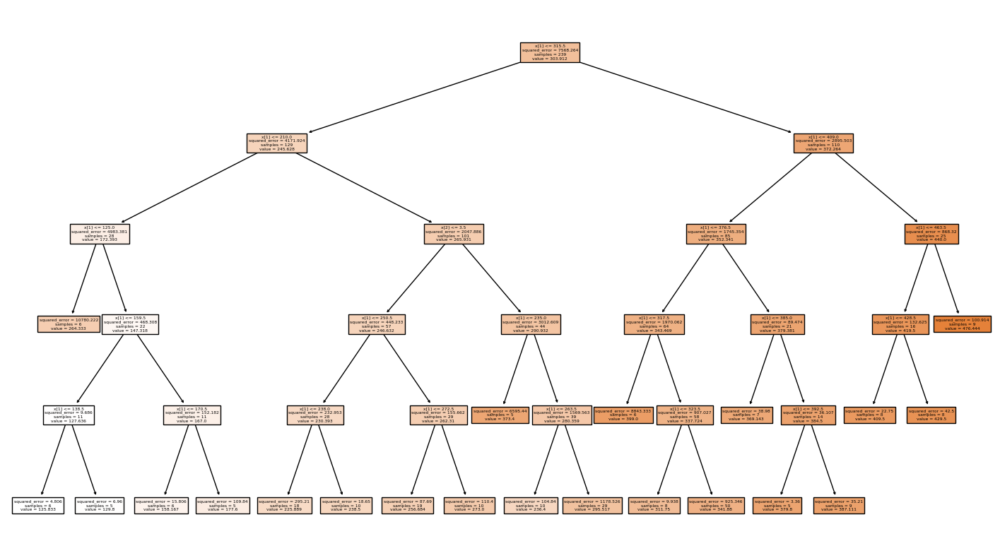

In [ ]:
X = DTRFrame6[['supply', '1 Week Before','crew_count']]
y = DTRFrame6['count']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.55, random_state=0)
predModel = DecisionTreeRegressor(max_depth=5, min_samples_leaf=5,random_state=0)
predModel.fit(X_train, y_train)
predictionDTR = predModel.predict(X_test)
mae = mean_absolute_error(y_test, predictionDTR)
print("Mean Absolute Error:", mae)

mape = mean_absolute_percentage_error(y_test, predictionDTR)
print("Mean Absolute Percentage Error :", mape)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, predictionDTR)
print("Mean Squared Error:", mse)

# Calculate R-squared
r_squared = r2_score(y_test, predictionDTR)
print("R-squared:", r_squared)

fig = plt.figure(figsize=(18, 10))
tree.plot_tree(predModel, filled=True)

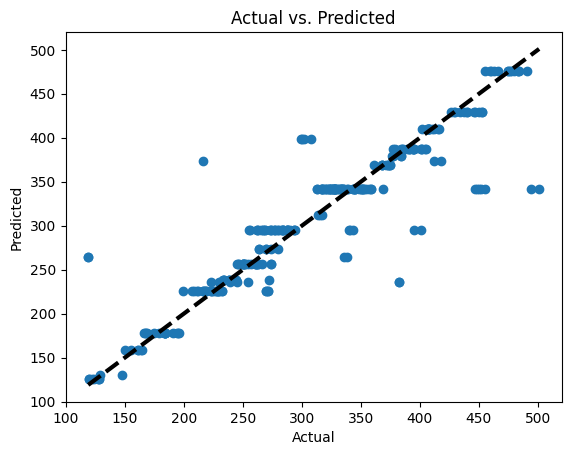

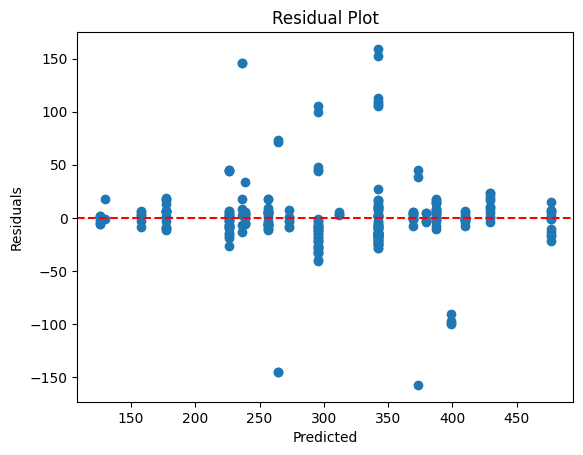

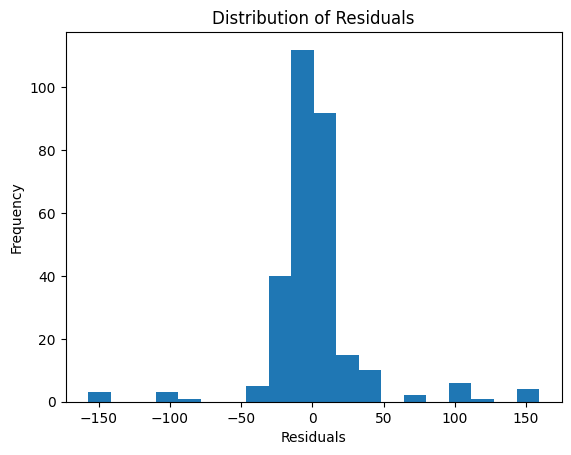

In [ ]:
plt.scatter(y_test, predictionDTR)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted')
plt.show()

residuals = y_test - predictionDTR
plt.scatter(predictionDTR, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

plt.hist(residuals, bins=20)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals')
plt.show()

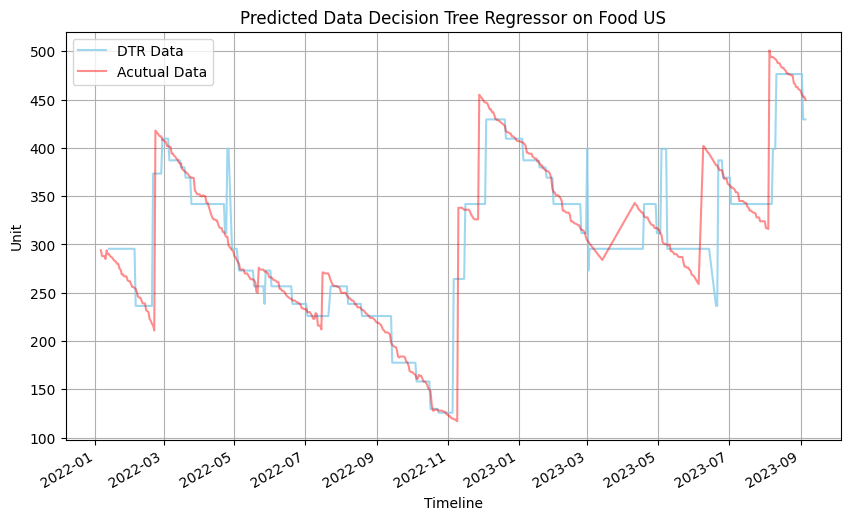

In [ ]:
DTR_food_US = predModel.predict(X)
DTR_food_US = pd.Series(DTR_food_US)
DTR_food_US.index = DTRFrame6['date']
newFrameCat6.index = pd.to_datetime(newFrameCat6.index, format='%Y/%m/%d')

DTR_food_US.plot(kind='line', figsize=(10, 6),label='DTR Data', color='skyblue', alpha= 0.8)
newFrameCat6.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Decision Tree Regressor on Food US')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 7 Accumulated_Series Usage: 267
Length of newFrameDiffCat7.index: 267
Slope: -0.5862801814195056
Intercept: 12.293616188719326


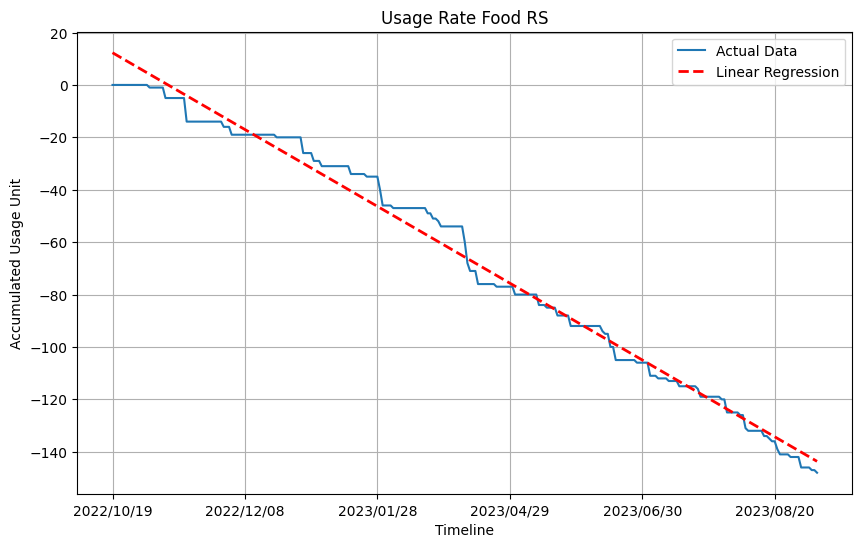

In [ ]:
newFrameDiffCat7 = newFrameCat7.diff()
newFrameDiffCat7[0] = 0
Cat7_accumulated_usage = []
Cat7_accumulated_sum = 0
for i in range(len(newFrameDiffCat7)):
    if newFrameDiffCat7[i] <= 0:
        Cat7_accumulated_sum += newFrameDiffCat7[i]
        Cat7_accumulated_usage.append(Cat7_accumulated_sum)
    else:
        Cat7_accumulated_sum += 0
        Cat7_accumulated_usage.append(Cat7_accumulated_sum)
Cat7_accumulated_series = pd.Series(Cat7_accumulated_usage)

print("Length of Category 7 Accumulated_Series Usage:", len(Cat7_accumulated_series))
print("Length of newFrameDiffCat7.index:", len(newFrameDiffCat7.index))

Cat7_accumulated_series.index = newFrameDiffCat7.index
Cat7_accumulated_series.plot(kind='line', figsize=(10, 6),label='Actual Data')

X = np.arange(len(Cat7_accumulated_series)).reshape(-1, 1)
y = Cat7_accumulated_series.values.reshape(-1, 1)
# Create and fit the linear regression model
model = LinearRegression()
model.fit(X, y)

print("Slope:", model.coef_[0][0])
print("Intercept:", model.intercept_[0])
slope7 = model.coef_[0][0]
predictions = model.predict(X)
#plt.plot(newFrameDiffCat7.index, Cat7_accumulated_series.values,label='Original Data', marker='.', color='green', alpha=0.6)
plt.plot(newFrameDiffCat7.index, predictions, label='Linear Regression', linestyle='--', color='red',linewidth=2)
plt.title('Usage Rate Food RS')
plt.ylabel('Accumulated Usage Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

Length of Category 7 predict Model_usage: 267
Length of newFrameCat7.index: 267


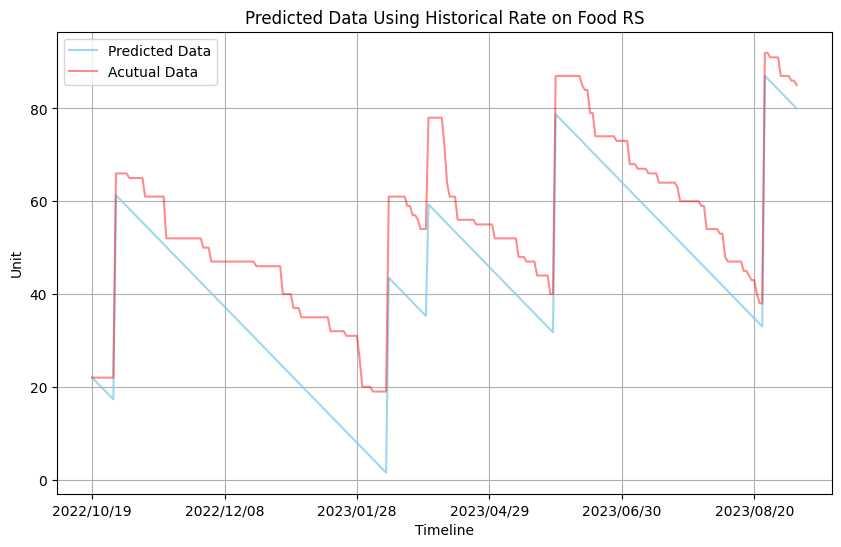

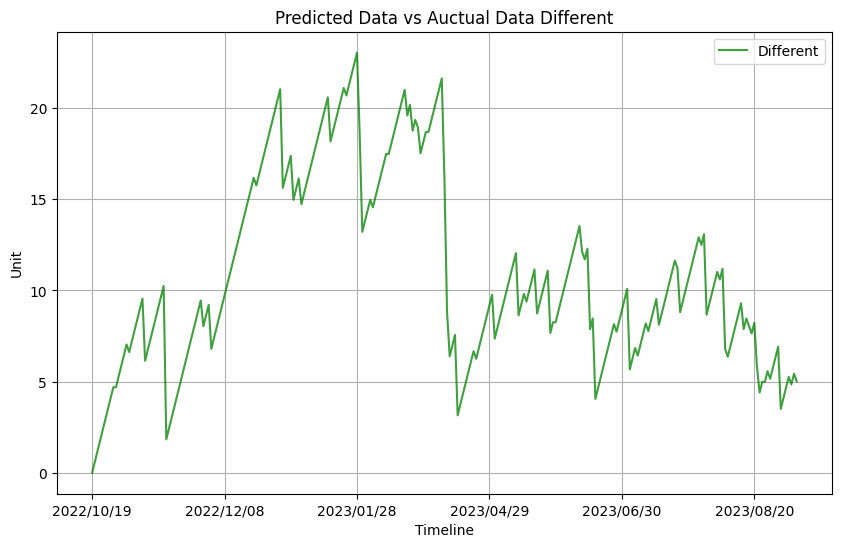

Mean Absolute Percentage Error (MAPE): 0.24%
Mean Squared Error (MSE): 145.24


In [ ]:
pModelCate7 = newFrameCat7
predModel_usage_cat7 = []
pModelCat7Diff = []
for i in range(len(pModelCate7)):
    if i > 0:
      if pModelCate7[i] - pModelCate7[i-1]  > 0:
        predModel_usage_cat7.append(predModel_usage_cat7[i-1]+(pModelCate7[i]-pModelCate7[i-1]))
      else:
        predModel_usage_cat7.append(predModel_usage_cat7[i-1]+slope7)
    else:
      predModel_usage_cat7.append(pModelCate7[i])

predModel_usage_cat7 = pd.Series(predModel_usage_cat7)
print("Length of Category 7 predict Model_usage:", len(predModel_usage_cat7))
print("Length of newFrameCat7.index:", len(newFrameCat7.index))
predModel_usage_cat7.index = pModelCate7.index
for i in range(len(newFrameCat7)):
    pModelCat7Diff.append(newFrameCat7[i]- predModel_usage_cat7[i])

pModelCat7Diff = pd.Series(pModelCat7Diff)
pModelCat7Diff.index = pModelCate7.index
predModel_usage_cat7.plot(kind='line', figsize=(10, 6),label='Predicted Data', color='skyblue', alpha= 0.8)
newFrameCat7.plot(kind='line', figsize=(10, 6),label='Acutual Data', color='red',alpha=0.45)
plt.title('Predicted Data Using Historical Rate on Food RS')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

pModelCat7Diff.plot(kind='line', figsize=(10, 6),label='Different', color='green',alpha=0.75)
plt.title('Predicted Data vs Auctual Data Different')
plt.ylabel('Unit')
plt.xlabel('Timeline')
plt.legend()
plt.grid()
plt.show()

yActual, yPred = np.array(newFrameCat7), np.array(predModel_usage_cat7)
mape = mean_absolute_percentage_error(yActual, yPred)
print("Mean Absolute Percentage Error (MAPE): {:.2f}%".format(mape))

mse = mean_squared_error(yActual, yPred)
print("Mean Squared Error (MSE): {:.2f}".format(mse))

In [ ]:
#print(newFrameCat1)
cat1DiffChange = {'Date': [], 'Count': []}
df_cat1DiffChange = pd.DataFrame()

#print(newFrameCat1.index)
date_index = newFrameCat1.index
cat1DiffChange['Date'].append(date_index)

for i in range(0, len(newFrameCat1)):
    diff = newFrameCat1[i] - newFrameCat1[i-1]
    cat1DiffChange['Count'].append(diff)

df_cat1DiffChange['Date'] = newFrameCat1.index
df_cat1DiffChange['Count'] = cat1DiffChange['Count']
df_cat1DiffChange = df_cat1DiffChange[df_cat1DiffChange['Count'] != 0]
print(newFrameCat1)
df_cat1DiffChange.head(10)

date
2022/01/01    33
2022/01/02    33
2022/01/03    33
2022/01/05    31
2022/01/06    31
              ..
2023/09/01    33
2023/09/02    33
2023/09/03    33
2023/09/04    33
2023/09/05    33
Name: status, Length: 544, dtype: int64


,Date,Count
3,2022/01/05,-2
73,2022/03/17,1
114,2022/04/30,1
117,2022/05/03,-2
126,2022/05/16,-1
134,2022/05/24,-1
166,2022/06/29,-1
186,2022/07/19,-1
188,2022/07/21,1
189,2022/07/23,-1


In [ ]:
'''
first_index = df_cat1DiffChange.index[0]
second_index = df_cat1DiffChange.index[1]

# Filtering newFrameCat1 to include only the relevant subset of data
subset_newFrameCat1 = len(newFrameCat1.index == first_indexsecond_index + 1)

# Creating a DataFrame from the subset data
df_subset_newFrameCat1 = pd.DataFrame(subset_newFrameCat1)

# Assuming 'Date' and 'Count' are columns in df_subset_newFrameCat1
X_subset = df_subset_newFrameCat1[['Date']]  # Independent variable
y_subset = df_subset_newFrameCat1['Count']    # Dependent variable

# Create a linear regression model
model = LinearRegression()

# Fit the model to the subset data
model.fit(X_subset, y_subset)

# Print the coefficients
print("Intercept:", model.intercept_)
print("Coefficient:", model.coef_)
'''

'\nfirst_index = df_cat1DiffChange.index[0]\nsecond_index = df_cat1DiffChange.index[1]\n\n# Filtering newFrameCat1 to include only the relevant subset of data\nsubset_newFrameCat1 = len(newFrameCat1.index == first_indexsecond_index + 1)\n\n# Creating a DataFrame from the subset data\ndf_subset_newFrameCat1 = pd.DataFrame(subset_newFrameCat1)\n\n# Assuming \'Date\' and \'Count\' are columns in df_subset_newFrameCat1\nX_subset = df_subset_newFrameCat1[[\'Date\']]  # Independent variable\ny_subset = df_subset_newFrameCat1[\'Count\']    # Dependent variable\n\n# Create a linear regression model\nmodel = LinearRegression()\n\n# Fit the model to the subset data\nmodel.fit(X_subset, y_subset)\n\n# Print the coefficients\nprint("Intercept:", model.intercept_)\nprint("Coefficient:", model.coef_)\n'